# Business Cases - Case 2: Sales Forecasting


Project developed by:

- **Mara Mesquita** (20241039)  
- **Maria Assunção** (20211605)  
- **Martim António** (20240601)  
- **Pedro Catarro** (20230463)  
- **Victor Pita** (20240596) 

# ``1. Imports``

## ``1.1. Libraries``

In [3]:
# Importing Libraries
import os
import csv
import numpy as np
import pandas as pd
import math
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import pacf, acf
import matplotlib.pyplot as plt
from matplotlib import ticker
import matplotlib.ticker as mtick
import matplotlib.cm as cm
import seaborn as sns
from scipy.stats import chi2_contingency
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
#pip install lazypredict
from lazypredict.Supervised import LazyRegressor
from sklearn.multioutput import MultiOutputRegressor
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
import xgboost as xgb
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error, max_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, max_error
import missingno as msno
import plotly.express as px #for the visuals with this pach we use this source: https://www.datacamp.com/tutorial/python-plotly-express-tutorial and also Chat Gpt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

pd.set_option('display.max_columns', None)

## ``1.2. Datasets``

In [4]:
# Import the datasets
df_market = pd.read_excel("Case2_Market data.xlsx")
df_sales = pd.read_csv("Case2_Sales data.csv",sep=";")
df_test = pd.read_csv("Case2_Test Set Template.csv", sep=";")

# Make a copy of the datasets
df_market_original = df_market.copy()
df_sales_original = df_sales.copy()
df_test_original = df_test.copy()

In [5]:
# Checking the df_sales head dataset
df_sales.head()

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,#1,0
1,02.10.2018,#1,0
2,03.10.2018,#1,0
3,04.10.2018,#1,0
4,05.10.2018,#1,0


In [6]:
# Check the datasets' head
df_market.head()

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.94,16.94,112.09,83.46,82.62,79.45,124.29,86.56,109.33,110.50,91.22,89.99,111.35,73.60,107.60,79.24,97.12,80.10,54.04,44.12,48.75,87.08,39.64,36.62,1.26,78.97,80.76,93.02,NaN,93.23,NaN,102.49,97.60,97.10,106.19,116.79,110.89,118.27,80.83,117.72,NaN,81.10,120.71,141.51,106.16,102.08,85.91
3,2004m3,23.71,23.71,136.33,106.17,100.56,97.01,143.41,106.34,140.88,144.69,85.87,79.88,127.56,84.05,110.19,98.62,113.78,96.02,54.67,47.59,49.26,87.19,42.59,39.93,1.23,79.67,80.96,93.54,NaN,93.34,NaN,105.63,113.22,91.20,121.63,139.29,141.18,148.12,102.13,119.22,NaN,76.69,138.31,152.88,140.29,117.23,97.67
4,2004m4,24.44,24.44,117.79,92.01,89.65,84.93,129.08,95.58,105.85,102.66,85.62,79.74,108.73,73.03,108.17,89.77,101.72,85.17,54.87,47.78,49.42,91.38,42.65,39.13,1.20,80.34,80.76,93.85,NaN,93.44,NaN,103.48,100.17,93.79,104.97,125.29,105.65,125.48,90.96,117.44,Na

In [7]:
# Checking the df_test head dataset
df_test.head()

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,NaN
1,Jun 22,#3,NaN
2,Jul 22,#3,NaN
3,Aug 22,#3,NaN
4,Sep 22,#3,NaN


# ``2. Exploratory Data Analysis``

## ``2.1. Sales``

### Dataset Overview  
The dataset contains sales records with the following key attributes:  

- **DATE**: Specifies the date on which a product group was sold.  
- **Mapped_GCK**: Represents different categories of products, with Siemens' Smart Infrastructure division offering a total of 14 distinct product groups.  
- **Sales_EUR**: Denotes the revenue (in Euros) generated from each recorded sale.  

Each entry corresponds to an individual sales transaction rather than an aggregated daily total.

In [8]:
# Checking the info of the df_sales dataset
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATE        9802 non-null   object
 1   Mapped_GCK  9802 non-null   object
 2   Sales_EUR   9802 non-null   object
dtypes: object(3)
memory usage: 229.9+ KB


The dataset currently stores all columns as **object** types, meaning they are treated as strings. This is not ideal for analysis, so we need to make some conversions:  

- The `DATE` column should be transformed into a proper datetime format.  
- The `Sales_EUR` column must be converted to a numeric type (float) to allow calculations.  

At first glance, there do not appear to be any explicitly missing values in the dataset. However, further checks should be done to confirm whether any empty or improperly formatted entries exist.  

Furthermore, both the `df_market` and `df_test` datasets contain `Year` and `Month` columns. If time-based analysis is required, it may be beneficial to extract these features from the `DATE` column in this dataset as well.


In [9]:
# Converting the DATE column to a datetime format
df_sales['DATE'] = pd.to_datetime(df_sales['DATE'], format='%d.%m.%Y')
# Converting the Sales_EUR to a numeric format
df_sales['Sales_EUR'] = pd.to_numeric(df_sales['Sales_EUR'].str.replace(',', '.'))

In [10]:
df_sales.describe(include = "all")

,DATE,Mapped_GCK,Sales_EUR
count,9802,9802,9802.00
unique,1216,14,NaN
top,2021-04-16 00:00:00,#1,NaN
freq,14,1179,NaN
first,2018-10-01 00:00:00,NaN,NaN
last,2022-04-30 00:00:00,NaN,NaN
mean,NaN,NaN,272785.69
std,NaN,NaN,2230789.16
min,NaN,NaN,-506381.17
25%,NaN,NaN,0.00


Analyzing the dataset reveals several important observations:  

- The available sales data spans from **October 1, 2018, to April 30, 2022**, covering a period of **3 years and 7 months**—a sufficient timeframe for training predictive models.  
- There are **14 distinct product groups** in the dataset, with **Group 1 appearing most frequently** in the records.  
- Some `Sales_EUR` values are **negative**, which, based on insights from discussions with Siemens Advanta consultants, could indicate **returns, price adjustments, or discounts** applied after the initial sale.  
- The highest recorded sales figure exceeds **40 million euros**, but a closer look at the quartiles suggests that **0 is the most frequent value**.  
  - This could be due to days when a product was listed but not sold, or because the actual transaction was recorded at a different time.  
  - Aggregating sales at the **monthly level** might help resolve this discrepancy, making it a logical next step in the data preparation process.  


In [11]:
# Creating the two new columns - Month and Year
df_sales['Month'] = df_sales['DATE'].dt.month
df_sales['Year'] = df_sales['DATE'].dt.year
df_sales['Day'] = df_sales['DATE'].dt.day

In [12]:
df_sales.head(1)

,DATE,Mapped_GCK,Sales_EUR,Month,Year,Day
0,2018-10-01,#1,0.00,10,2018,1


### ``Sales by Date``

In [13]:
# Create a copy of df_sales for exploration
df_sales_analysis = df_sales.copy()
df_sales_analysis = df_sales_analysis.sort_values(by='DATE')
df_sales_analysis = df_sales_analysis[df_sales_analysis['Sales_EUR'] != 0]  # Remove zero sales
df_sales_analysis['Year'] = df_sales_analysis['DATE'].dt.year
df_sales_analysis['Semester'] = np.where(df_sales_analysis['DATE'].dt.month <= 6, 1, 2)
df_sales_analysis['Month'] = df_sales_analysis['DATE'].dt.month.astype(str).str.zfill(2)

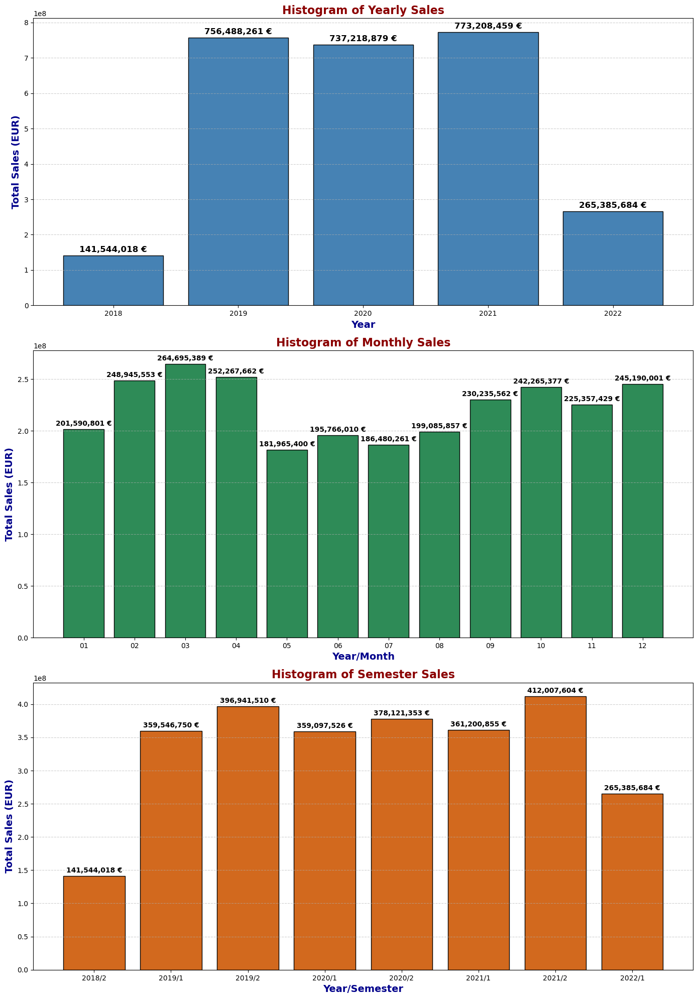

In [14]:
# Generate histograms for Yearly, Monthly, and Semester sales
fig, axes = plt.subplots(3, 1, figsize=(14, 20))

# Yearly Sales Histogram with values above bars (Using deep blue)
yearly_sales = df_sales_analysis.groupby('Year')['Sales_EUR'].sum()
bars = axes[0].bar(yearly_sales.index, yearly_sales.values, color='#4682B4', edgecolor='black')
axes[0].set_title('Histogram of Yearly Sales', fontsize=16, fontweight='bold', color='darkred')
axes[0].set_xlabel('Year', fontsize=14, fontweight='semibold', color='darkblue')
axes[0].set_ylabel('Total Sales (EUR)', fontsize=14, fontweight='semibold', color='darkblue')
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

# Add values on top of bars
for bar in bars:
    height = bar.get_height()
    axes[0].annotate(f'{height:,.0f} €', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 5), textcoords='offset points', ha='center', fontsize=12, fontweight='bold', color='black')

# Monthly Sales Histogram (Make x-axis and y-axis resemble yearly sales format)
monthly_sales = df_sales_analysis.groupby('Month')['Sales_EUR'].sum()
bars = axes[1].bar(monthly_sales.index.astype(str), monthly_sales.values, color='#2E8B57', edgecolor='black')
axes[1].set_title('Histogram of Monthly Sales', fontsize=16, fontweight='bold', color='darkred')
axes[1].set_xlabel('Year/Month', fontsize=14, fontweight='semibold', color='darkblue')
axes[1].set_ylabel('Total Sales (EUR)', fontsize=14, fontweight='semibold', color='darkblue')
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

# Add values on top of bars
for bar in bars:
    height = bar.get_height()
    axes[1].annotate(f'{height:,.0f} €', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 5), textcoords='offset points', ha='center', fontsize=10, fontweight='bold', color='black')

# Semester Sales Histogram (Make x-axis and y-axis resemble yearly sales format)
semester_sales = df_sales_analysis.groupby(['Year', 'Semester'])['Sales_EUR'].sum()
semester_sales.index = [f"{year}/{semester}" for year, semester in semester_sales.index]  # Format Year/Semester
bars = axes[2].bar(semester_sales.index, semester_sales.values, color='#D2691E', edgecolor='black')
axes[2].set_title('Histogram of Semester Sales', fontsize=16, fontweight='bold', color='darkred')
axes[2].set_xlabel('Year/Semester', fontsize=14, fontweight='semibold', color='darkblue')
axes[2].set_ylabel('Total Sales (EUR)', fontsize=14, fontweight='semibold', color='darkblue')
axes[2].grid(axis='y', linestyle='--', alpha=0.6)

# Add values on top of bars
for bar in bars:
    height = bar.get_height()
    axes[2].annotate(f'{height:,.0f} €', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 5), textcoords='offset points', ha='center', fontsize=10, fontweight='bold', color='black')

# Adjust layout
plt.tight_layout()

Examining the trends over different time periods—yearly, semesterly, and monthly—reveals several key observations:  

- **Yearly Sales Trends:**  
  - The data for **2018 and 2022** is incomplete, so conclusions regarding these years should be made with caution.  
  - Between **2019 and 2021**, there is a slight **downward trend in sales volume** .  
  - This decline could be influenced by various external factors such as **the COVID-19 pandemic, economic inflation, or geopolitical events like the Ukraine conflict**. However, it may also reflect a **natural business cycle**.  

- **Semesterly Sales Trends:**  
  - Looking at sales split by **first and second semesters** (excluding partial years 2018 and 2022), there is a noticeable pattern of **declining sales when comparing equivalent semesters across different years**.  
  - In **2019 and 2020**, the **second semester recorded more sales** than the first, highlighting potential seasonal fluctuations in demand.  

- **Monthly Sales Patterns:**  
  - **October** consistently shows the lowest sales activity, aligning with the start of the "Siemens fiscal year," where there may be **less urgency to meet KPIs and sales targets**.  
  - A **sharp drop in sales in January 2021** stands out, likely influenced by **global lockdown measures and restrictions** imposed at the time. This drop further reinforces the semesterly and yearly decline in sales trends observed.  


### ``Mapped_GCK``

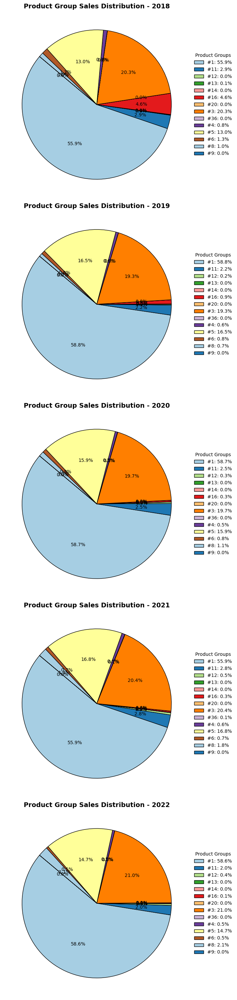

In [15]:
# Get unique years in the dataset
years = df_sales_analysis['Year'].dropna().unique()

# Create pie charts for each year
fig, axes = plt.subplots(len(years), 1, figsize=(12, 6 * len(years)))  # Adjust width for legend space

# If only one year exists, make axes a list to avoid indexing issues
if len(years) == 1:
    axes = [axes]

for i, year in enumerate(sorted(years)):
    yearly_data = df_sales_analysis[df_sales_analysis['Year'] == year]
    product_group_sales = yearly_data.groupby('Mapped_GCK')['Sales_EUR'].sum()

    # Define colors
    colors = plt.cm.Paired.colors[:len(product_group_sales)]

    # Pie chart for each year
    wedges, texts, autotexts = axes[i].pie(product_group_sales, labels=None, autopct='%1.1f%%', 
                                           startangle=140, colors=colors, wedgeprops={'edgecolor': 'black'})

    # Add title
    axes[i].set_title(f'Product Group Sales Distribution - {year}', fontsize=14, fontweight='bold')

    # Extract the percentage text and format it correctly
    percentages = [autotext.get_text() for autotext in autotexts]
    labels_with_percentages = [f"{label}: {pct}" for label, pct in zip(product_group_sales.index, percentages)]

    # Create legend (subtitle) on the side
    axes[i].legend(wedges, labels_with_percentages, title="Product Groups",
                   loc="center left", bbox_to_anchor=(1, 0.5), frameon=False)

# Adjust layout
plt.tight_layout()

Analyzing the yearly product sales breakdown, several key trends emerge:  

- **Product Group #1 dominates the market**, consistently contributing **over 55% of total sales** each year. Its share peaked at **58.8% in 2019** and has since remained stable.  
- **Product Group #3 is the second-largest contributor**, holding a **steady 19%-21% share** across all years. In **2022, its sales increased slightly to 21%**.  
- **Product Group #5 consistently ranks third**, representing **13%-17% of total sales** annually. Its highest share was **16.8% in 2021**.  
- **The remaining product groups collectively account for 8%-12% of total sales**, with **Product Group #11** being the most notable among them, typically ranging between **2% and 3%**.  
- **Several product groups have near-negligible sales every year**, including **#9, #36, #20, and #14**, indicating they play a very minor role in total revenue.  

Overall, the **top three product groups account for approximately 90% of total sales**, highlighting a **high concentration of sales among a few key products**.

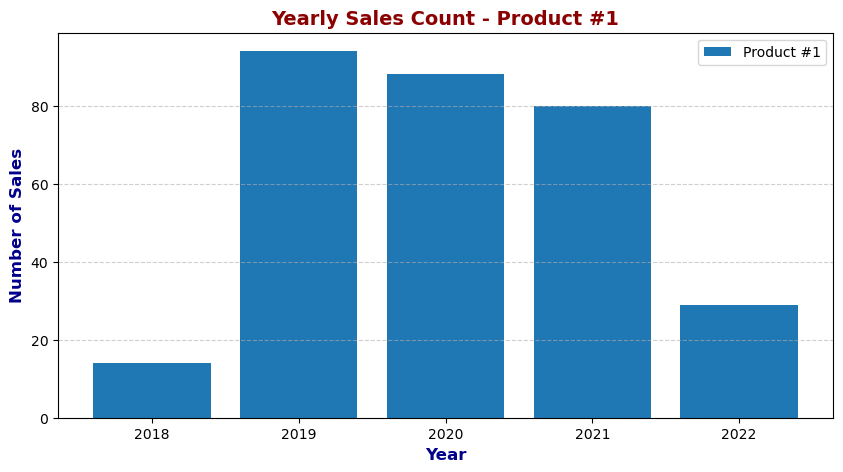

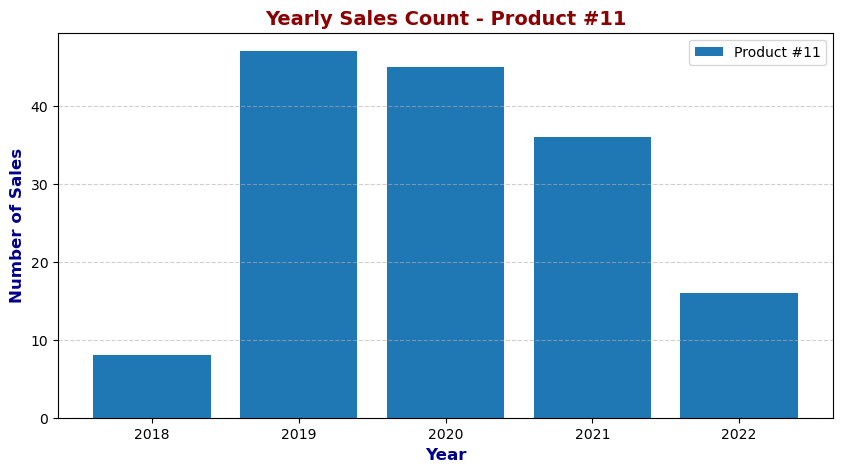

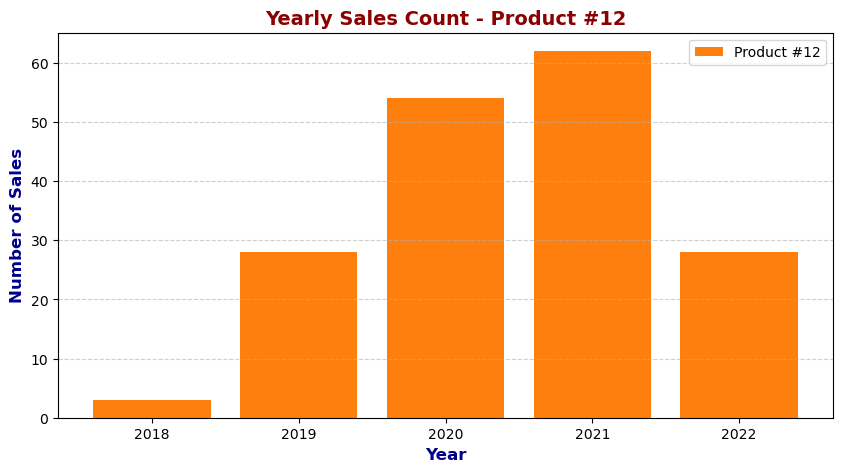

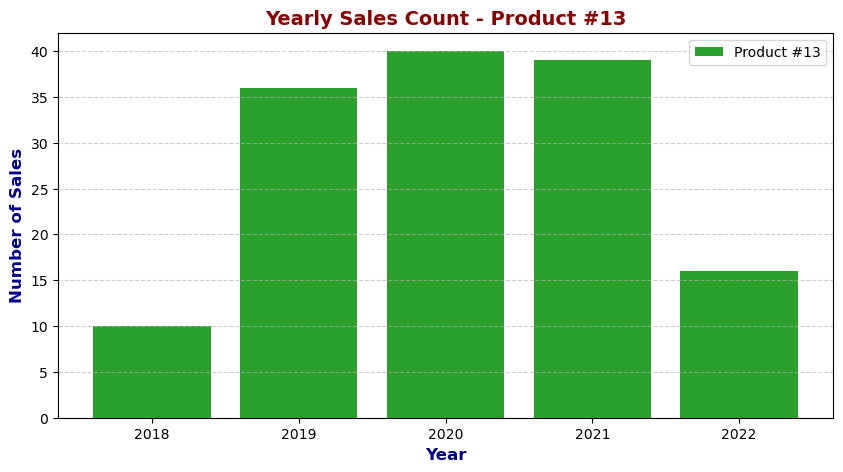

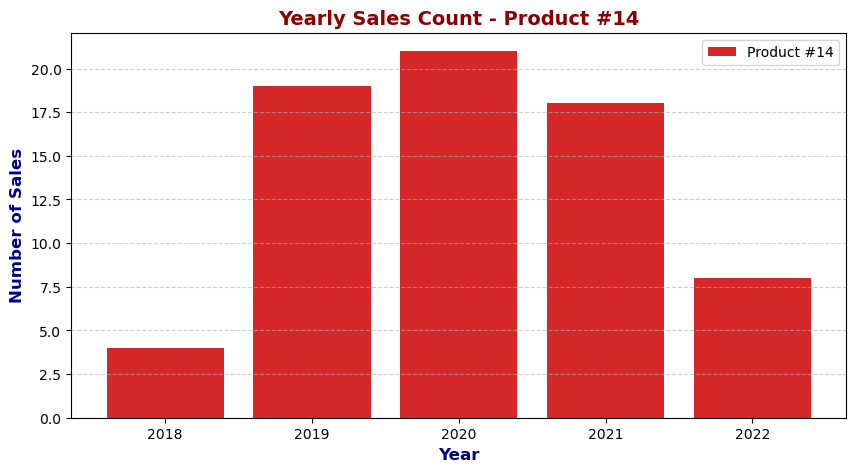

...

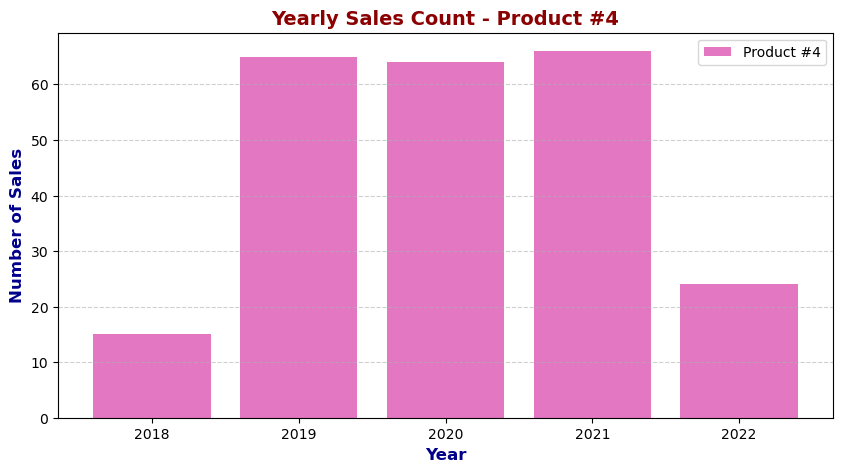

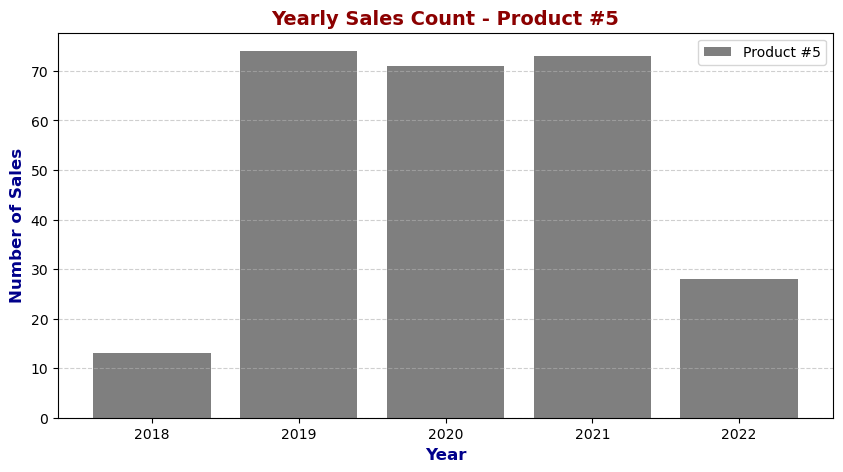

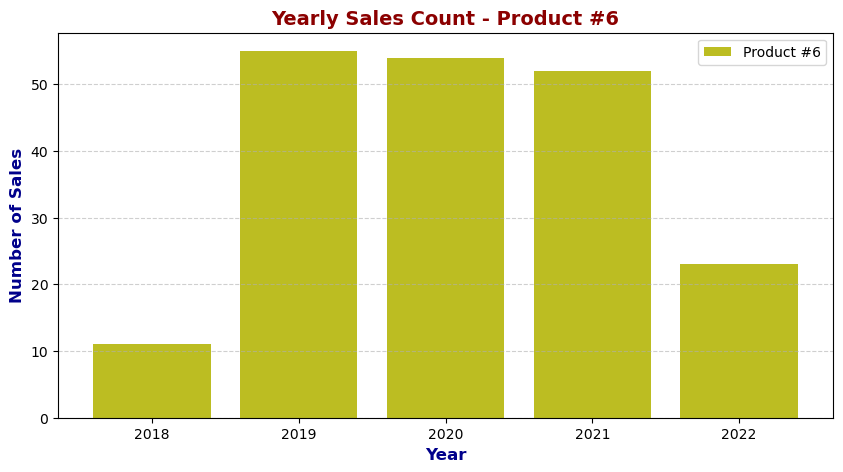

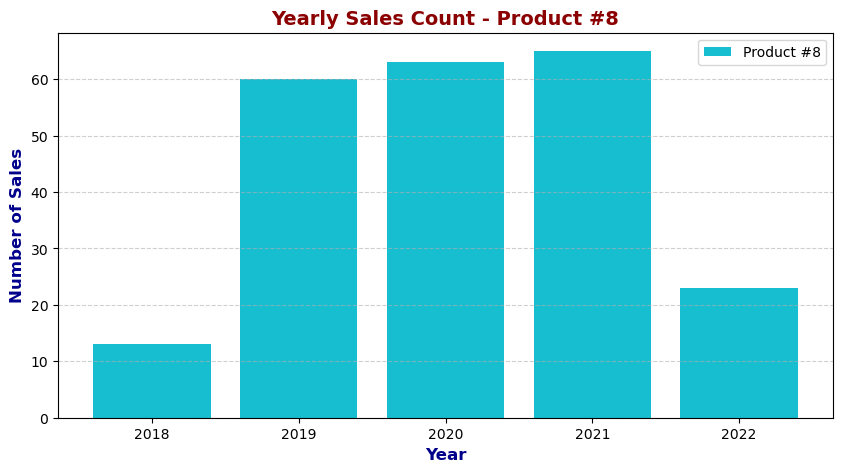

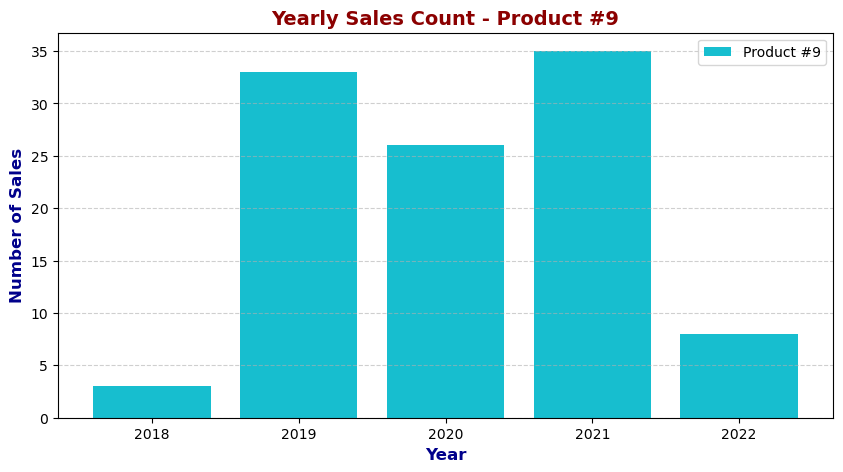

In [16]:
# Count the number of sales per year and product group
yearly_sales_count = df_sales_analysis.groupby(['Year', 'Mapped_GCK']).size().unstack()

# Get a color palette for the product groups
colormap = cm.get_cmap('tab10', len(yearly_sales_count.columns))  

# Create separate bar plots for each product group
for idx, product in enumerate(yearly_sales_count.columns):
    plt.figure(figsize=(10, 5))
    plt.bar(yearly_sales_count.index, yearly_sales_count[product], color=colormap(idx), label=f'Product {product}')

    plt.title(f"Yearly Sales Count - Product {product}", fontsize=14, fontweight='bold', color='darkred')
    plt.xlabel("Year", fontsize=12, fontweight='semibold', color='darkblue')
    plt.ylabel("Number of Sales", fontsize=12, fontweight='semibold', color='darkblue')
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.legend()
    plt.show()

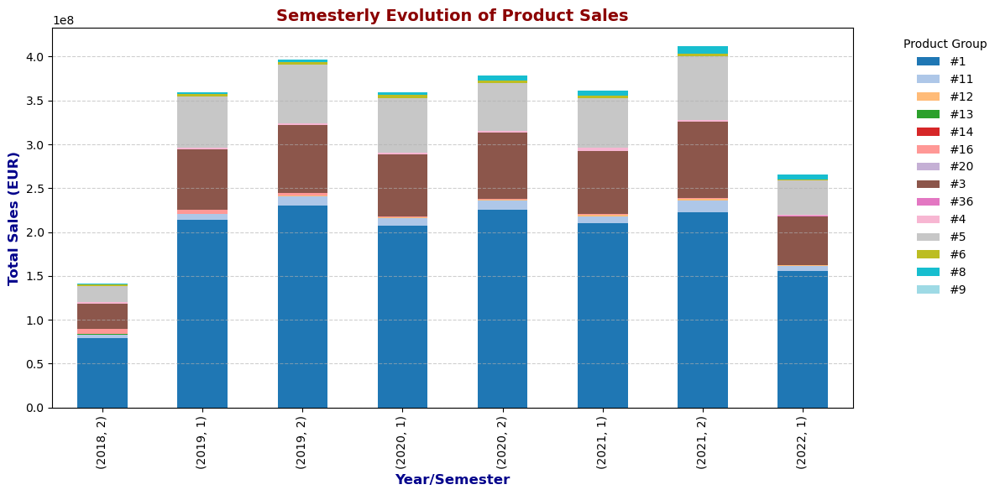

In [17]:
# Group sales by product group and semester
semester_sales = df_sales_analysis.groupby(['Year', 'Semester', 'Mapped_GCK'])['Sales_EUR'].sum().unstack()

# Plot semesterly evolution
semester_sales.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title("Semesterly Evolution of Product Sales", fontsize=14, fontweight='bold', color='darkred')
plt.xlabel("Year/Semester", fontsize=12, fontweight='semibold', color='darkblue')
plt.ylabel("Total Sales (EUR)", fontsize=12, fontweight='semibold', color='darkblue')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend(title="Product Group", bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.tight_layout()
plt.show()

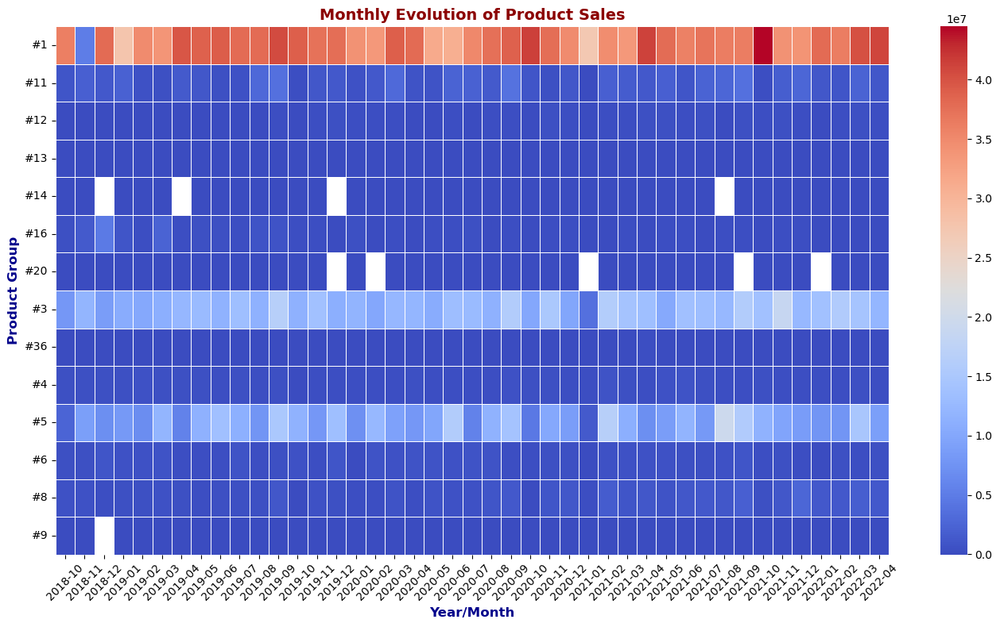

In [18]:
# Group sales by product group and month
monthly_sales = df_sales_analysis.groupby(['Year', 'Month', 'Mapped_GCK'])['Sales_EUR'].sum().unstack()

# Generate heatmap
plt.figure(figsize=(14, 8))
monthly_sales_pivot = monthly_sales.T  # Transpose to put products on y-axis
sns.heatmap(monthly_sales_pivot, cmap="coolwarm", annot=False, linewidths=0.5)  # Removed annot=True

plt.title("Monthly Evolution of Product Sales", fontsize=14, fontweight='bold', color='darkred')
plt.xlabel("Year/Month", fontsize=12, fontweight='semibold', color='darkblue')
plt.ylabel("Product Group", fontsize=12, fontweight='semibold', color='darkblue')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## ``2.2 Market``

In [19]:
# Check the head of the df_market
df_market.head()

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.94,16.94,112.09,83.46,82.62,79.45,124.29,86.56,109.33,110.50,91.22,89.99,111.35,73.60,107.60,79.24,97.12,80.10,54.04,44.12,48.75,87.08,39.64,36.62,1.26,78.97,80.76,93.02,NaN,93.23,NaN,102.49,97.60,97.10,106.19,116.79,110.89,118.27,80.83,117.72,NaN,81.10,120.71,141.51,106.16,102.08,85.91
3,2004m3,23.71,23.71,136.33,106.17,100.56,97.01,143.41,106.34,140.88,144.69,85.87,79.88,127.56,84.05,110.19,98.62,113.78,96.02,54.67,47.59,49.26,87.19,42.59,39.93,1.23,79.67,80.96,93.54,NaN,93.34,NaN,105.63,113.22,91.20,121.63,139.29,141.18,148.12,102.13,119.22,NaN,76.69,138.31,152.88,140.29,117.23,97.67
4,2004m4,24.44,24.44,117.79,92.01,89.65,84.93,129.08,95.58,105.85,102.66,85.62,79.74,108.73,73.03,108.17,89.77,101.72,85.17,54.87,47.78,49.42,91.38,42.65,39.13,1.20,80.34,80.76,93.85,NaN,93.44,NaN,103.48,100.17,93.79,104.97,125.29,105.65,125.48,90.96,117.44,Na

- **Whitespace Removal:**  
  - Extra spaces were eliminated from the **'Unnamed: 0'** column to ensure consistency in date formatting.  

- **Splitting Date Components:**  
  - The **'Unnamed: 0'** column, which contained date values in the format `"YYYYmM"`, was split into two new columns:  
    - **'Year'** → Extracts the four-digit year (e.g., `"2004"` from `"2004m2"`).  
    - **'Month'** → Extracts the corresponding month (e.g., `"2"` from `"2004m2"`).  
  - This makes it easier to analyze trends over time.  

- **Reordering Columns:**  
  - The newly created **'Year'** and **'Month'** columns were moved to the **beginning** of the dataset.  
  - This restructuring ensures that the dataset is **chronologically organized**, simplifying sorting and filtering.  


In [20]:
# Removing any white spaces in the column 'Unnamed: 0' 
df_market.loc[2:, 'Unnamed: 0'] = df_market.loc[2:, 'Unnamed: 0'].str.replace(" ", "")

# Splitting the column 'Unnamed: 0' into two new columns 'Year' and 'Month'
df_market[['Year', 'Month']] = df_market['Unnamed: 0'].str.split('m', expand=True)

# Get the list of column names
cols = df_market.columns.tolist() 
# Move the last column to the first position
cols.insert(0, cols.pop())  
# Move the second last column to the second position
cols.insert(1, cols.pop())  
# Reorder the columns
df_market = df_market[cols] 

# Check the df_market
df_market.head()

,Month,Year,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,None,Index 2010=100 (if not otherwise noted),Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,None,date,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2,2004,2004m2,16.94,16.94,112.09,83.46,82.62,79.45,124.29,86.56,109.33,110.50,91.22,89.99,111.35,73.60,107.60,79.24,97.12,80.10,54.04,44.12,48.75,87.08,39.64,36.62,1.26,78.97,80.76,93.02,NaN,93.23,NaN,102.49,97.60,97.10,106.19,116.79,110.89,118.27,80.83,117.72,NaN,81.10,120.71,141.51,106.16,102.08,85.91
3,3,2004,2004m3,23.71,23.71,136.33,106.17,100.56,97.01,143.41,106.34,140.88,144.69,85.87,79.88,127.56,84.05,110.19,98.62,113.78,96.02,54.67,47.59,49.26,87.19,42.59,39.93,1.23,79.67,80.96,93.54,NaN,93.34,NaN,105.63,113.22,91.20,121.63,139.29,141.18,148.12,102.13,119.22,NaN,76.69,138.31,152.88,140.29,117.23,97.67
4,4,2004,2004m4,24.44,24.44,117.79,92.01,89.65,84.93,129.08,95.58,105.85,102.66,85.62,79.74,108.73,73.03,108.17,89.77,101.72,85.17,54.87,47.78,49.42,91.38,42.65,39.13,1.20,80.34,80

**Preparing and Structuring Market Data** - The dataset we are working with contains economic and market indicators from multiple countries and sectors over time. However, the raw data is **not structured optimally for analysis**. To make it more manageable, we will perform a series of **data transformation steps** to:  

- **Reformat the dataset** by transposing rows and columns for better readability.  
- **Extract economic indicators separately** to maintain clarity.  
- **Reorganize the data structure** by properly assigning country, sector, and cost attributes.  
- **Integrate economic indicators** like exchange rates with the main dataset.  

By performing these transformations, we will ensure that the dataset is **clean, well-structured, and ready for further analysis**. Let’s begin with the first set of transformations.  


In [21]:
# Convert the dataset by swapping rows and columns
df = df_market.T.copy()

# Reset index to convert row indices into a standard numerical format
df = df.reset_index()

# Display the modified structure
df.head()

,index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220
0,Month,None,None,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10,11,12,1,2,3,4
1,Year,Index 2010=100 (if not otherwise noted),date,2004,2004,2004,2004,2004,2004,2004,2004,2004,2004,2004,2005,2005,2005,2005,2005,2005,2005,2005,2005,2005,2005,2005,2006,2006,2006,2006,2006,2006,2006,2006,2006,2006,2006,2006,2007,2007,2007,2007,2007,2007,2007,2007,2007,2007,2007,2007,2008,2008,2008,2008,2008,2008,2008,2008,2008,2008,2008,2008,2009,2009,2009,2009,2009,2009,2009,2009,2009,2009,2009,2009,2010,2010,2010,2010,2010,2010,2010,2010,2010,2010,2010,2010,2011,2011,2011,2011,2011,2011,2011,2011,2011,2011,2011,2011,2012,2012,2012,2012,2012,2012,2012,2012,2012,2012,2012,2012,2013,2013,2013,2013,2013,2013,2013,2013,2013,2013,2013,2013,2014,2014,2014,2014,2014,2014,2014,2014,2014,2014,2014,2014,2015,2015,2015,2015,2015,2015,2015,2015,2015,2015,2015,2015,2016,2016,2016,2016,2016,2016,2016,2016,2016,2016,2016,2016,2017,2017,2017,2017,2017,2017,2017,2017,2017,2017,2017,2017,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2019,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2020,2021,2021,2021,2021,2021,2021,2021,2021,2021,2021,2021,2021,2022,2022,2022,2022
2,Unnamed: 0,Index 2010=100 (if not otherwise noted),date,2004m2,2004m3,2004m4,2004m5,2004m6,2004m7,2004m8,2004m9,2004m10,2004m11,2004m12,2005m1,2005m2,2005m3,2005m4,2005m5,2005m6,2005m7,2005m8,2005m9,2005m10,2005m11,2005m12,2006m1,2006m2,2006m3,2006m4,2006m5,2006m6,2006m7,2006m8,2006m9,2006m10,2006m11,2006m12,2007m1,2007m2,2007m3,2007m4,2007m5,2007m6,2007m7,2007m8,2007m9,2007m10,2007m11,2007m12,2008m1,2008m2,2008m3,2008m4,2008m5,2008m6,2008m7,2008m8,2008m9,2008m10,2008m11,2008m12,2009m1,2009m2,2009m3,2009m4,2009m5,2009m6,2009m7,2009m8,2009m9,2009m10,2009m11,2009m12,2010m1,2010m2,2010m3,2010m4,2010m5,2010m6,2010m7,2010m8,2010m9,2010m10,2010m11,2010m12,2011m1,2011m2,2011m3,2011m4,2011m5,2011m6,2011m7,2011m8,2011m9,2011m10,2011m11,2011m12,2012m1,2012m2,2012m3,2012m4,2012m5,2012m6,2012m7,2012m8,2012m9,2012m10,2012m11,2012m12,2013m1,2013m2,2013m3,2013m4,2013m5,2013m6,2013m7,2013m8,2013m9,2013m10,2013m11,2013m12,2014m1,2014m2,2014m3,2014m4,2014m5,2014m6,2014m7,2014m8,2014m9,2014m10,2014m11,2014m12,2015m1,2015m2,2015m3,2015m4,2015m5,2015m6,2015m7,2015m8,2015m9,2015m10,2015m11,2015m12,2016m1,2016m2,2016m3,2016m4,2016m5,2016m6,2016m7,2016m8,2016m9,2016m10,2016m11,2016m12,2017m1,2017m2,2017m3,2017m4,2017m5,2017m6,2017m7,2017m8,2017m9,2017m10,2017m11,2017m12,2018m1,2018m2,2018m3,2018m4,2018m5,2018m6,2018m7,2018m8,2018m9,2018m10,2018m11,2018m12,2019m1,2019m2,2019m3,2019m4,2019m5,2019m6,2019m7,2019m8,2019m9,2019m10,2019m11,2019m12,2020m1,2020m2,2020m3,2020m4,2020m5,2020m6,2020m7,2020m8,2020m9,2020m10,2020m11,2020m12,2021m1,2021m2,2021m3,2021m4,2021

Transposing and Resetting the Index - In its original form, our dataset contains **column names stored as row values**. This makes direct analysis difficult.  

**What was done?**  
- **Swapped rows and columns** to make the structure more intuitive (`T.copy()`).  
- **Reset the index**, allowing each row to be accessed numerically rather than relying on original row labels.  

**Why?** This step makes the data more accessible and **prepares it for restructuring**, where we will assign meaningful column names and categories.

In [22]:
# Extract relevant economic data (EUR/USD exchange rate)
df_economy = df.loc[[2, 27]]

# Remove exchange rate row from main dataset to prevent redundancy
df = df.drop(index=27)

# Display df_economy
df_economy.head()

,index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220
2,Unnamed: 0,Index 2010=100 (if not otherwise noted),date,2004m2,2004m3,2004m4,2004m5,2004m6,2004m7,2004m8,2004m9,2004m10,2004m11,2004m12,2005m1,2005m2,2005m3,2005m4,2005m5,2005m6,2005m7,2005m8,2005m9,2005m10,2005m11,2005m12,2006m1,2006m2,2006m3,2006m4,2006m5,2006m6,2006m7,2006m8,2006m9,2006m10,2006m11,2006m12,2007m1,2007m2,2007m3,2007m4,2007m5,2007m6,2007m7,2007m8,2007m9,2007m10,2007m11,2007m12,2008m1,2008m2,2008m3,2008m4,2008m5,2008m6,2008m7,2008m8,2008m9,2008m10,2008m11,2008m12,2009m1,2009m2,2009m3,2009m4,2009m5,2009m6,2009m7,2009m8,2009m9,2009m10,2009m11,2009m12,2010m1,2010m2,2010m3,2010m4,2010m5,2010m6,2010m7,2010m8,2010m9,2010m10,2010m11,2010m12,2011m1,2011m2,2011m3,2011m4,2011m5,2011m6,2011m7,2011m8,2011m9,2011m10,2011m11,2011m12,2012m1,2012m2,2012m3,2012m4,2012m5,2012m6,2012m7,2012m8,2012m9,2012m10,2012m11,2012m12,2013m1,2013m2,2013m3,2013m4,2013m5,2013m6,2013m7,2013m8,2013m9,2013m10,2013m11,2013m12,2014m1,2014m2,2014m3,2014m4,2014m5,2014m6,2014m7,2014m8,2014m9,2014m10,2014m11,2014m12,2015m1,2015m2,2015m3,2015m4,2015m5,2015m6,2015m7,2015m8,2015m9,2015m10,2015m11,2015m12,2016m1,2016m2,2016m3,2016m4,2016m5,2016m6,2016m7,2016m8,2016m9,2016m10,2016m11,2016m12,2017m1,2017m2,2017m3,2017m4,2017m5,2017m6,2017m7,2017m8,2017m9,2017m10,2017m11,2017m12,2018m1,2018m2,2018m3,2018m4,2018m5,2018m6,2018m7,2018m8,2018m9,2018m10,2018m11,2018m12,2019m1,2019m2,2019m3,2019m4,2019m5,2019m6,2019m7,2019m8,2019m9,2019m10,2019m11,2019m12,2020m1,2020m2,2020m3,2020m4,2020m5,2020m6,2020m7,2020m8,2020m9,2020m10,2020m11,2020m12,2021m1,2021m2,2021m3,2021m4,2021m5,2021m6,2021m7,2021m8,2021m9,2021m10,2021m11,2021m12,2022m1,2022m2,2022m3,2022m4
27,Unnamed: 25,United States: EUR in LCU,WKLWEUR840_org,1.26,1.23,1.20,1.20,1.21,1.23,1.22,1.22,1.25,1.30,1.34,1.31,1.30,1.32,1.29,1.27,1.22,1.20,1.23,1.23,1.20,1.18,1.19,1.21,1.19,1.20,1.23,1.28,1.26,1.27,1.28,1.27,1.26,1.29,1.32,1.30,1.31,1.32,1.35,1.35,1.34,1.37,1.36,1.39,1.42,1.47,1.46,1.47,1.47,1.55,1.58,1.56,1.56,1.58,1.50,1.44,1.33,1.27,1.34,1.32,1.28,1.30,1.32,1.37,1.40,1.41,1.43,1.46,1.48,1.49,1.46,1.43,1.37,1.36,1.34,1.26,1.22,1.28,1.29,1.31,1.39,1.37,1.32,1.34,1.36,1.40,1.44,1.43,1.44,1.43,1.43,1.38,1.37,1.36,1.32,1.29,1.32,1.32,1.32,1.28,1.25,1.23,1.24,1.29,1.30,1.28,1.31,1.33,1.34,1.30,1.30,1.30,1.32,1.31,1.33,1.33,1.36,1.35,1.37,1.36,1.37,1.38,1.38,1.37,1.36,1.35,1.33,1.29,1.27,1.25,1.23,1.16,1.13,1.08,1.08,1.12,1.12,1.10,1.11,1.12,1.12,1.07,1.09,1.09,1.11,1.11,1.13,1.13,1.12,1.11,1.12,1.12,1.10,1.08,1.05,1.06,1.06,1.07,1.07,1.11,1.12,1.15,1.18,1.19,1.18,1.17,1.18,1.22,1.23,1.23,1.23,1.18,1.17,1.17,1.15,1.17,1.15,1.14,1.14,1.14,1.14,1.13,1.12,1.12,1.13,1.12,1.11,1.10,1.11,1.11,1.11,1.11,1.09,1.11,1.09,1.09,1.13,1.15,1.18,1.18,1.18,1.18,1.22,1.22,1.21,1.19,1.20,1.21,1.20,1.18,1.18,1.18,1.16,1.14,1.13,1.13,1.13,1.10,1.08


Extracting EUR/USD Exchange Rate - The dataset includes an **exchange rate row (EUR/USD)**, which is important for **economic context but not directly related to market-specific trends**.  

**What was done?**  
- Extracted the row containing **EUR/USD exchange rate** into a new dataset (`df_economy`).  
- Removed this row from the main dataset to **avoid duplication**.  

**Why?** **Exchange rates influence market trends**, but they should be handled separately from country- or sector-specific data. This separation allows us to later **combine it with additional macroeconomic indicators** for better financial insights.


In [23]:
# Use row values as column headers for clarity
df_economy = df_economy.rename(columns=df_economy.iloc[0])

# Drop the original first row since it's now redundant
df_economy = df_economy.drop(df_economy.index[0])

# Reset index to standard format
df_economy.reset_index(inplace=True)

# Remove unnecessary columns
df_economy = df_economy.drop(columns={'Unnamed: 0', 'date', 'index'})

# Rename key column for better understanding
df_economy = df_economy.rename(columns={'Index 2010=100 (if not otherwise noted)': 'Index'})

# Ensure the first value in 'Index' column clearly states 'EUR/USD'
df_economy.iloc[0]['Index'] = 'EUR/USD'

# Remove index name for consistency
df_economy.index.name = None

# Display cleaned df_economy
df_economy.head()


,Index,2004m2,2004m3,2004m4,2004m5,2004m6,2004m7,2004m8,2004m9,2004m10,2004m11,2004m12,2005m1,2005m2,2005m3,2005m4,2005m5,2005m6,2005m7,2005m8,2005m9,2005m10,2005m11,2005m12,2006m1,2006m2,2006m3,2006m4,2006m5,2006m6,2006m7,2006m8,2006m9,2006m10,2006m11,2006m12,2007m1,2007m2,2007m3,2007m4,2007m5,2007m6,2007m7,2007m8,2007m9,2007m10,2007m11,2007m12,2008m1,2008m2,2008m3,2008m4,2008m5,2008m6,2008m7,2008m8,2008m9,2008m10,2008m11,2008m12,2009m1,2009m2,2009m3,2009m4,2009m5,2009m6,2009m7,2009m8,2009m9,2009m10,2009m11,2009m12,2010m1,2010m2,2010m3,2010m4,2010m5,2010m6,2010m7,2010m8,2010m9,2010m10,2010m11,2010m12,2011m1,2011m2,2011m3,2011m4,2011m5,2011m6,2011m7,2011m8,2011m9,2011m10,2011m11,2011m12,2012m1,2012m2,2012m3,2012m4,2012m5,2012m6,2012m7,2012m8,2012m9,2012m10,2012m11,2012m12,2013m1,2013m2,2013m3,2013m4,2013m5,2013m6,2013m7,2013m8,2013m9,2013m10,2013m11,2013m12,2014m1,2014m2,2014m3,2014m4,2014m5,2014m6,2014m7,2014m8,2014m9,2014m10,2014m11,2014m12,2015m1,2015m2,2015m3,2015m4,2015m5,2015m6,2015m7,2015m8,2015m9,2015m10,2015m11,2015m12,2016m1,2016m2,2016m3,2016m4,2016m5,2016m6,2016m7,2016m8,2016m9,2016m10,2016m11,2016m12,2017m1,2017m2,2017m3,2017m4,2017m5,2017m6,2017m7,2017m8,2017m9,2017m10,2017m11,2017m12,2018m1,2018m2,2018m3,2018m4,2018m5,2018m6,2018m7,2018m8,2018m9,2018m10,2018m11,2018m12,2019m1,2019m2,2019m3,2019m4,2019m5,2019m6,2019m7,2019m8,2019m9,2019m10,2019m11,2019m12,2020m1,2020m2,2020m3,2020m4,2020m5,2020m6,2020m7,2020m8,2020m9,2020m10,2020m11,2020m12,2021m1,2021m2,2021m3,2021m4,2021m5,2021m6,2021m7,2021m8,2021m9,2021m10,2021m11,2021m12,2022m1,2022m2,2022m3,2022m4
0,EUR/USD,1.26,1.23,1.20,1.20,1.21,1.23,1.22,1.22,1.25,1.30,1.34,1.31,1.30,1.32,1.29,1.27,1.22,1.20,1.23,1.23,1.20,1.18,1.19,1.21,1.19,1.20,1.23,1.28,1.26,1.27,1.28,1.27,1.26,1.29,1.32,1.30,1.31,1.32,1.35,1.35,1.34,1.37,1.36,1.39,1.42,1.47,1.46,1.47,1.47,1.55,1.58,1.56,1.56,1.58,1.50,1.44,1.33,1.27,1.34,1.32,1.28,1.30,1.32,1.37,1.40,1.41,1.43,1.46,1.48,1.49,1.46,1.43,1.37,1.36,1.34,1.26,1.22,1.28,1.29,1.31,1.39,1.37,1.32,1.34,1.36,1.40,1.44,1.43,1.44,1.43,1.43,1.38,1.37,1.36,1.32,1.29,1.32,1.32,1.32,1.28,1.25,1.23,1.24,1.29,1.30,1.28,1.31,1.33,1.34,1.30,1.30,1.30,1.32,1.31,1.33,1.33,1.36,1.35,1.37,1.36,1.37,1.38,1.38,1.37,1.36,1.35,1.33,1.29,1.27,1.25,1.23,1.16,1.13,1.08,1.08,1.12,1.12,1.10,1.11,1.12,1.12,1.07,1.09,1.09,1.11,1.11,1.13,1.13,1.12,1.11,1.12,1.12,1.10,1.08,1.05,1.06,1.06,1.07,1.07,1.11,1.12,1.15,1.18,1.19,1.18,1.17,1.18,1.22,1.23,1.23,1.23,1.18,1.17,1.17,1.15,1.17,1.15,1.14,1.14,1.14,1.14,1.13,1.12,1.12,1.13,1.12,1.11,1.10,1.11,1.11,1.11,1.11,1.09,1.11,1.09,1.09,1.13,1.15,1.18,1.18,1.18,1.18,1.22,1.22,1.21,1.19,1.20,1.21,1.20,1.18,1.18,1.18,1.16,1.14,1.13,1.13,1.13,1.10,1.08


Cleaning and Structuring Economic Data - The extracted **EUR/USD exchange rate dataset (`df_economy`)** still requires some formatting adjustments before use.  

**What was done?**  
- Converted row values into **proper column names**.  
- Dropped redundant data (**unnamed columns, old index references**).  
- Renamed key indicators for **clarity and consistency**.  
- Set the **'Index'** column to explicitly mention "EUR/USD".  

**Why?**  
- A **well-structured dataset** makes future data merging easier.  
- **Avoids confusion** by ensuring columns have meaningful names.  
- Ensures that when adding more economic data, this dataset remains **properly formatted**.


In [24]:
# Extract country names while handling different formatting styles
countries = pd.concat([
    df.iloc[3:21]['index'].str.split('.', n=1, expand=True)[0], 
    df.iloc[21:][0].str.split(':', n=1, expand=True)[0]
])

# Extract sector names while handling variations in structure
sectors = pd.concat([
    df.iloc[3:21][0].str.split('Index ', n=1, expand=True)[1], 
    df.iloc[21:27][0].str.split('Price of ', n=1, expand=True)[1].str.split(' index', n=1, expand=True)[0].str.split(', average', n=1, expand=True)[0], 
    df.iloc[27:][0].str.split(': ', n=1, expand=True)[1]
])

# Extract cost-related data while removing numbering and extra text
costs = pd.concat([
    df.iloc[3:21][0].str.split(' ', n=2, expand=True)[[0, 1]].apply(lambda x: ' '.join(x), axis=1), 
    df.iloc[21:27][0].str.split(' of ', n=1, expand=True)[0].str.split(': ', n=1, expand=True)[1], 
    df.iloc[27:]['index'].str.split('.', n=1, expand=True)[0]
])

# Standardize cost terminology for consistency
costs.replace({'production index': 'Production Index', 'Price': 'Commodity Index'}, inplace=True)


Extracting and Standardizing Market Attributes - The dataset contains country, sector, and cost-related data embedded in various formats. To ensure consistency, these attributes need to be **extracted and structured properly**.

**What was done?**  
- **Country names** were extracted while handling different text formats.  
- **Sector information** was retrieved while considering different naming conventions across rows.  
- **Cost-related data** was cleaned by removing extra text and ensuring uniform naming.  
- Certain cost terms were **standardized** for consistency, such as renaming "Price" to "Commodity Index."

**Why?**  
- A structured dataset improves **clarity** and avoids inconsistencies in analysis.  
- Ensures that each entry is correctly labeled for **future data merging and categorization**.


In [25]:
# Assign extracted information to new columns
df['Country'] = countries
df['Sector'] = sectors
df['Costs'] = costs

# Remove unnecessary columns
df.drop(columns=['index', 0], inplace=True)

Assigning Extracted Attributes to the Dataset - Now that country, sector, and cost information have been extracted and cleaned, they are assigned to corresponding columns in the dataset.

**What was done?**  
- The **Country, Sector, and Costs** columns were created using the extracted values.  
- Unnecessary columns that no longer contribute to the structure were removed.

**Why?**  
- This ensures the dataset is **properly categorized**, making future queries and visualizations more straightforward.  
- It eliminates redundant data, improving the **clarity and efficiency** of the dataset.


In [26]:
# Select the last three rows and reverse their order
last_three_rows = df.T.iloc[-3:].iloc[::-1]

# Concatenate the reversed last three rows with the original DataFrame
df = pd.concat([last_three_rows, df.T.iloc[:-3]])


Adjusting Row Order for Proper Alignment - Certain rows appear to be **misplaced** or out of order in the transposed dataset. To correct this, the last three rows are **reversed** and placed at the beginning.

**What was done?**  
- The **last three rows were repositioned** in the dataset.  
- The dataset was updated to reflect this order adjustment.

**Why?**  
- This step ensures that all data entries are **correctly aligned**.  
- It prevents inconsistencies that might arise during further data processing.


In [27]:
appended_data = []

# Loop through each row containing market data
for index, row in df.T.iloc[3:, :4].rename(columns={1: 'Code'}).iterrows():
    # Loop through each economic data row
    for index1, row1 in df.T.iloc[:3, 4:].T.iterrows():
        # Combine both rows and append to the list
        appended_data.append(pd.concat([row, row1], axis=0))

# Convert list to DataFrame
df_market_clean = pd.concat(appended_data, axis=1).T


Merging Market and Economic Data - At this point, the dataset consists of **market trends (costs, sectors, countries) and economic indicators (exchange rates, indices).** To make these relationships easier to analyze, the dataset is restructured by **combining market and economic attributes**.

**What was done?**  
- **Iterated through the dataset** to combine **market-specific** information with corresponding **economic indicators**.  
- The result was **stored in a list and converted into a structured DataFrame** (`df_market_clean`).  

**Why?**  
- This transformation ensures that every row **contains both market-related and economic data**, making it easier to analyze **how macroeconomic trends influence sector performance**.


In [28]:
# Rename columns for clarity
df_market_clean = df_market_clean.rename(columns={0:'Month', 1:'Year', 2:'MonthYear'})

# Reset index and remove unnecessary columns
df_market_clean = df_market_clean.reset_index().drop(columns={'index'})

# Convert data types for better efficiency
df_market_clean = df_market_clean.astype({'Costs': str, 'Sector': str, 'Country': str, 'Code': str, 'Month': np.int8, 'Year': np.int16})


Cleaning and Optimizing the Market Dataset - The dataset is now structured, but additional refinements are needed to **ensure consistency and improve efficiency**.

**What was done?**  
- **Renamed columns** to make them more descriptive.  
- **Reset the index** and removed unnecessary columns that no longer add value.  
- **Converted data types** to optimize memory usage and facilitate numerical operations.

**Why?**  
- Standardized naming conventions help in **better data interpretation**.  
- Removing redundant information **improves performance** and makes the dataset easier to manipulate.


In [29]:
# Transpose the dataset for structured retrieval
df_help = df_market.T
# Set new column headers using the third row
new_header = df_help.iloc[2]
df_help = df_help[3:]
df_help = df_help.set_axis(new_header, axis='columns')

# Create an empty list to store index values
matching_prices = []

# Loop through each row in df_market_clean
for index, row in df_market_clean.iterrows():
    # Extract code and date for matching
    code_to_match = row['Code']
    value_to_match = row['MonthYear']

    # Locate the corresponding row in df_help
    df_matching_row = df_help.loc[df_help['date'] == code_to_match]

    # Retrieve the corresponding price value
    matching_price = df_matching_row[value_to_match].values[0]
    
    # Append the extracted price value
    matching_prices.append(matching_price)

# Assign the extracted index (price) values to df_market_clean
df_market_clean['Index'] = matching_prices

# Ensure column name consistency
df_market_clean.rename(columns={2: 'MonthYear'}, inplace=True)


Integrating Market Price Data - The dataset now contains market and economic indicators, but the **Index (Price Data)** column is missing. This transformation adds price-related information to ensure the dataset is complete.

**What was done?**  
- The dataset was **transposed and realigned** to facilitate structured retrieval of price data.  
- **Matched price values** using the correct codes and dates.  
- **Extracted corresponding index values** and added them as a new column (`Index`).  

**Why?**  
- Including **market price trends** allows for **a more comprehensive economic analysis**.  
- It ensures that we have **historical pricing data for market trend evaluations**.


In [30]:
# Make a backup of the cleaned dataset
df_market_clean_original = df_market_clean.copy()


In [31]:
df_market_clean

,Costs,Sector,Country,Code,Month,Year,MonthYear,Index
0,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,2,2004,2004m2,16.94
1,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,3,2004,2004m3,23.71
2,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,4,2004,2004m4,24.44
3,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,5,2004,2004m5,23.71
4,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,6,2004,2004m6,27.01
...,...,...,...,...,...,...,...,...
10069,Production Index,Electrical equipment,Germany,PRO27276_org,12,2021,2021m12,97.77
10070,Production Index,Electrical equipment,Germany,PRO27276_org,1,2022,2022m1,98.60
10071,Production Index,Electrical equipment,Germany,PRO27276_org,2,2022,2022m2,106.13
10072,Production Index,Electrical equipment,Germany,PRO27276_org,3,2022,2022m3,119.95


After multiple transformations, we now have a structured dataset that is ready for analysis. Now we will do a quick exploration of this dataset.

In [32]:
# Using `info()` to check the overall structure and data types
df_market_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10074 entries, 0 to 10073
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Costs      10074 non-null  object 
 1   Sector     10074 non-null  object 
 2   Country    10074 non-null  object 
 3   Code       10074 non-null  object 
 4   Month      10074 non-null  int8   
 5   Year       10074 non-null  int16  
 6   MonthYear  10074 non-null  object 
 7   Index      9964 non-null   float64
dtypes: float64(1), int16(1), int8(1), object(5)
memory usage: 501.9+ KB


Generating descriptive statistics for the Index column to understand its distribution, including the mean, standard deviation, and quantiles.

In [33]:
# Retrieve summary statistics to identify the range and spread of values
print("\nDescriptive Statistics for 'Index' Column:\n")
print(df_market_clean["Index"].describe())


Descriptive Statistics for 'Index' Column:

count   9964.00
mean     105.31
std       25.76
min       16.94
25%       94.24
50%      104.26
75%      115.25
max      329.41
Name: Index, dtype: float64


We identified potential outliers in the Index column by selecting values greater than the 75th percentile.

In [34]:
upper_quartile_test = df_market_clean["Index"].quantile(0.75)
outliers = df_market_clean[df_market_clean["Index"] > upper_quartile_test]

print(f"\nRows with values greater than the 75th percentile (potential outliers): {outliers.shape[0]}")


Rows with values greater than the 75th percentile (potential outliers): 2491


We replaced non-standard missing value symbols with NaN and checked how many missing values are in each column.


In [35]:
# It's common to encounter different types of missing values represented by symbols (e.g., "", "?", "-").
# We will replace these with NaN, a standard representation of missing values.
missing_symbols = ["", "?", "-", " ", "null", "NK", "na"]
df_market_clean.replace(missing_symbols, np.nan, inplace=True)

# Now, let's check how many missing values we have in the dataset
print("\nCount of Missing Values in Each Column:")
print(df_market_clean.isna().sum())


Count of Missing Values in Each Column:
Costs          0
Sector         0
Country        0
Code           0
Month          0
Year           0
MonthYear      0
Index        110
dtype: int64


We dropped rows with missing values in the Index column to ensure clean data for analysis.

In [36]:
# Number of missing values in 'Index'
missing_in_index = df_market_clean["Index"].isna().sum()

# We can drop rows with missing values in 'Index', as this is the main focus of our analysis.
# Instead of deleting, we could choose to fill them, but for now, we'll delete the rows with missing 'Index'.
df_market_clean = df_market_clean.dropna(subset=["Index"])

print(f"\nNumber of Missing Values in 'Index': {missing_in_index}")
print(f"Rows with Missing 'Index' have been dropped. Remaining rows: {df_market_clean.shape[0]}")



Number of Missing Values in 'Index': 110
Rows with Missing 'Index' have been dropped. Remaining rows: 9964


We checked for duplicate values.

In [37]:
# It's also a good idea to ensure there are no duplicate rows in the dataset.
# We will identify the number of duplicated rows and print them.
duplicates = df_market_clean.duplicated().sum()
print(f"\nTotal Number of Duplicated Rows: {duplicates}")



Total Number of Duplicated Rows: 0


We examined the unique countries or regions in the dataset to understand its geographical scope.


In [38]:
# To understand the geographical coverage, let's check the unique values in the 'Country' column.
unique_countries = df_market_clean["Country"].unique()
print("\nList of Unique Countries or Regions in the Dataset:\n", unique_countries)


List of Unique Countries or Regions in the Dataset:
 ['China' 'France' 'Germany' 'Italy' 'Japan' 'Switzerland' 'United Kingdom'
 'United States' 'Europe' 'World']


In [39]:
df_market_clean


,Costs,Sector,Country,Code,Month,Year,MonthYear,Index
0,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,2,2004,2004m2,16.94
1,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,3,2004,2004m3,23.71
2,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,4,2004,2004m4,24.44
3,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,5,2004,2004m5,23.71
4,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,6,2004,2004m6,27.01
...,...,...,...,...,...,...,...,...
10069,Production Index,Electrical equipment,Germany,PRO27276_org,12,2021,2021m12,97.77
10070,Production Index,Electrical equipment,Germany,PRO27276_org,1,2022,2022m1,98.60
10071,Production Index,Electrical equipment,Germany,PRO27276_org,2,2022,2022m2,106.13
10072,Production Index,Electrical equipment,Germany,PRO27276_org,3,2022,2022m3,119.95


### ``Dataset Visuals ``

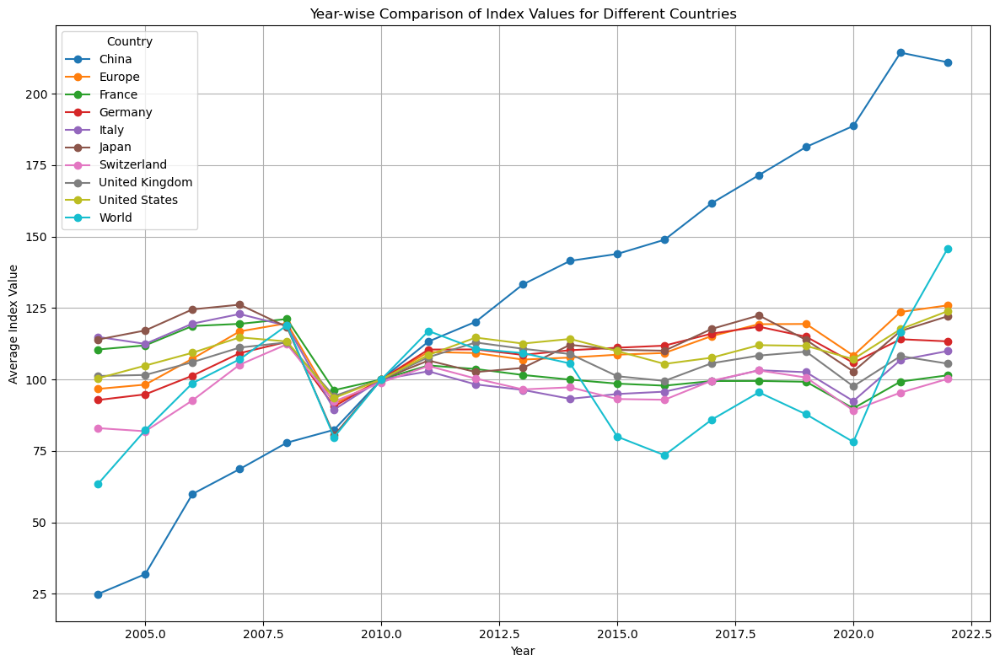

In [40]:
# Aggregating by year and comparing index for different countries
df_yearly = df_market_clean.groupby(['Year', 'Country'])['Index'].mean().unstack()

# Plotting the comparison
df_yearly.plot(kind='line', figsize=(12, 8), marker='o')
plt.title('Year-wise Comparison of Index Values for Different Countries')
plt.xlabel('Year')
plt.ylabel('Average Index Value')
plt.legend(title='Country')
plt.grid(True)
plt.tight_layout()
plt.show()


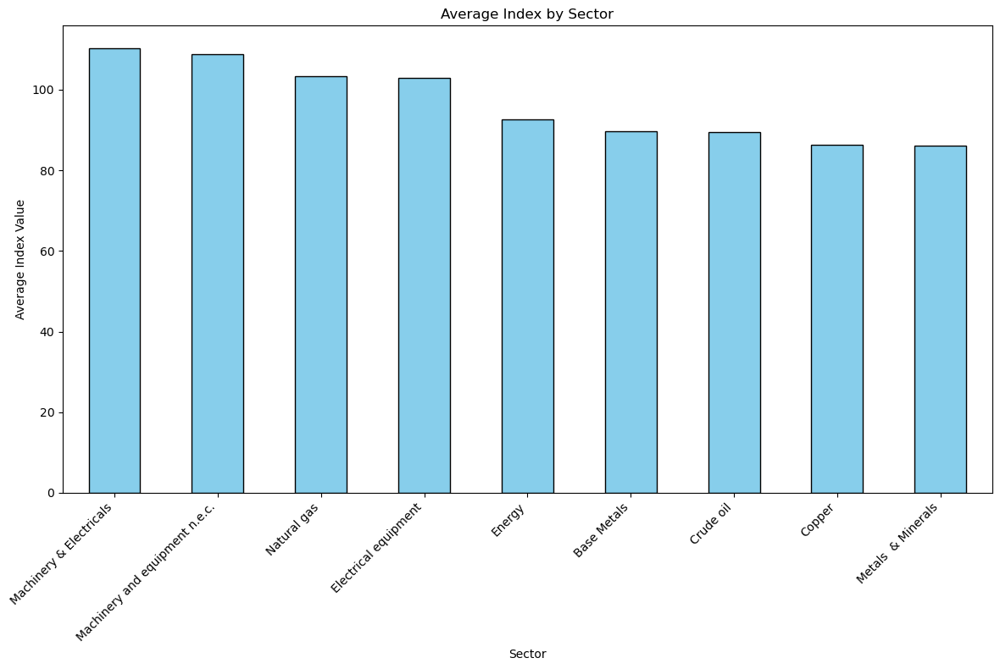

In [41]:
# Plotting the average Index per sector
sector_avg_index = df_market_clean.groupby('Sector')['Index'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sector_avg_index.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Average Index by Sector')
plt.xlabel('Sector')
plt.ylabel('Average Index Value')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


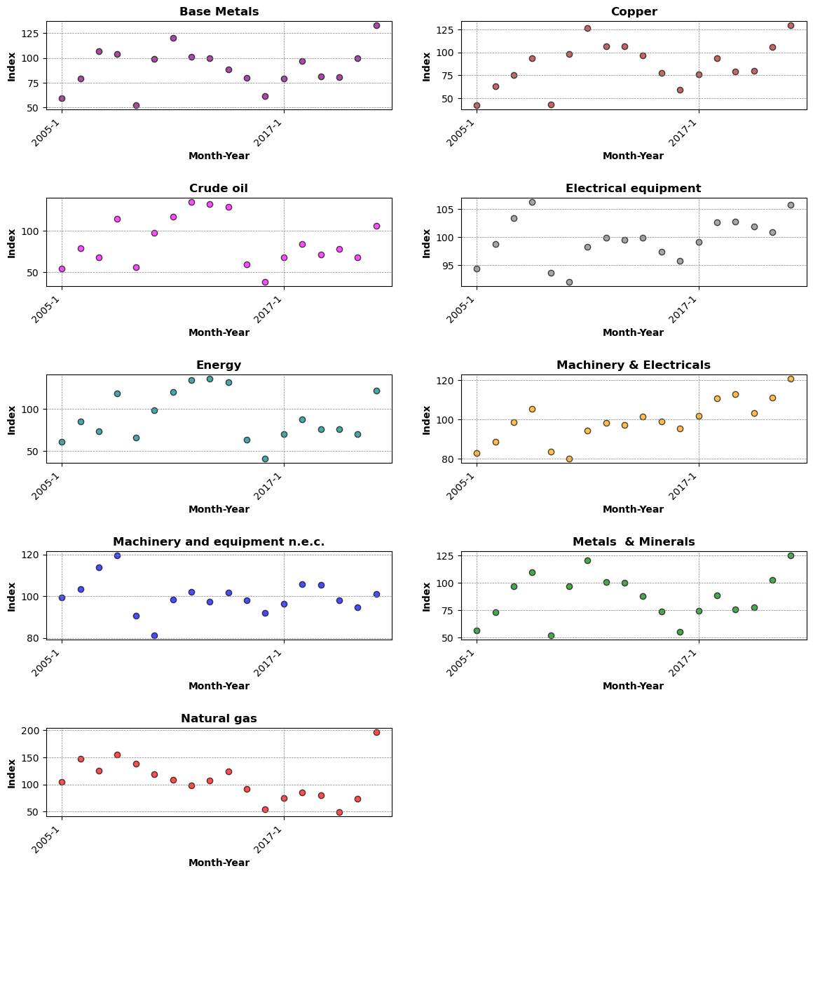

In [42]:
# Create a pivot table to group the data by sector, month, and year
pivot_df_market_clean = pd.pivot_table(df_market_clean[df_market_clean["Month"] == 1], 
                                       values='Index', 
                                       index=['Sector', 'Month', 'Year'], 
                                       aggfunc='mean')

# Set the figure size and create the subplots grid (6 rows, 2 columns)
fig, axs = plt.subplots(nrows=6, ncols=2, figsize=(14, 18))

# Flatten the axs array to loop through it using a single index
axs = axs.flatten()

# Define custom colors for the sectors to avoid repetition
colors = ['purple', 'brown', 'magenta', 'gray', 'teal', 'orange', 'blue', 'green', 'red', 'cyan']

# Loop through each sector and plot the data in the corresponding subplot
for i, sector in enumerate(pivot_df_market_clean.index.levels[0][:10]):  # Adjust for more sectors
    data = pivot_df_market_clean.loc[sector]
    
    # Rearrange the order of years
    data = data.reindex(index=pd.MultiIndex.from_product([pd.Index([1]), pd.Index(range(2005, 2023))], 
                                                         names=['Month', 'Year']))
    ax = axs[i]
    
    # Switch to a bar plot or scatter plot for a different style (instead of line plot)
    ax.scatter(data.index.get_level_values('Year').astype(str) + '-' + data.index.get_level_values('Month').astype(str),
               data.values, label=sector, color=colors[i], alpha=0.7, edgecolors='black')
    
    ax.set_title(sector, fontsize=12, fontweight='bold')
    ax.set_xlabel('Month-Year', fontsize=10, fontweight='bold')
    ax.set_ylabel('Index', fontsize=10, fontweight='bold')
    ax.legend().set_visible(False)

    # Set x-axis tick positions and labels to show every 12 months
    xticks = ax.get_xticks()
    xticklabels = ax.get_xticklabels()
    ax.set_xticks(xticks[::12])  # Adjust for less clutter
    ax.set_xticklabels(xticklabels[::12], rotation=45, ha='right')
    
    # Add a gray grid to the back of the plot
    ax.grid(color='gray', linestyle='--', linewidth=0.5)

# Remove any unused subplots from the grid
for i in range(len(pivot_df_market_clean.index.levels[0]), 12):
    axs[i].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.2, hspace=1)

# Show the plots
plt.show()

**INSIGHTS**

The **INDEX** column represents the **production or price index**, which tracks changes in production output or commodity prices over time. A higher value indicates an increase, while a lower value shows a decrease, relative to a base period.

From the plots, the following trends and insights can be drawn:

1. **China's Strong Growth (Post-2018)**: China’s sharp upward trend post-2018 reflects its **continued industrial expansion**, especially in **technology and manufacturing**, as well as **post-pandemic recovery**. It also indicates the **growing importance of China** in global supply chains.

2. **Volatility in Commodities**: Sectors like **Base Metals**, **Copper**, **Crude Oil**, and **Metals & Minerals** exhibit significant **fluctuations**, which can be attributed to **commodity price changes** driven by **global demand**, **supply chain disruptions**, and **geopolitical factors**. **Crude Oil**, for example, is sensitive to **OPEC decisions** and **global political instability**.

3. **Steady Growth in Electrical Sectors**: The **Electrical Equipment** and **Machinery & Electricals** sectors show **steady increases**, reflecting the global shift toward **automation**, **renewable energy**, and **electrical infrastructure** expansion, especially in emerging markets. **Technological innovations** and the adoption of **smart technologies** likely fueled this growth.

4. **Slow but Steady Growth in Developed Economies**: **Europe**, the **United States**, and **Japan** show more **gradual growth**, with **stable indices** suggesting **mature economies**. **Post-2015**, these economies saw steady improvements in sectors like **energy** and **electrical equipment**, driven by **renewable energy adoption** and **technological upgrades**.

5. **UK’s Volatility**: The **UK**’s fluctuating index reflects the uncertainty around **Brexit** and its impact on **trade and production**. The **post-2020 period** also shows the effects of the **COVID-19 pandemic** on its industrial sectors.


# ``3. Data Pre-Process``

## `3.1 Restructuring Data for Analysis`

### Sales

In [43]:
df_sales_res = df_sales.copy()
# Step 1: Group the data by Mapped_GCK, Year, and Month and aggregate Sales_EUR
df_aggregated = df_sales_res.groupby(['Mapped_GCK', 'Year', 'Month'], as_index=False)['Sales_EUR'].sum()

# Step 2: Pivot the table to get one column per product group (Mapped_GCK)
df_pivot = df_aggregated.pivot_table(index=['Year', 'Month'], columns='Mapped_GCK', values='Sales_EUR', aggfunc='sum', fill_value=0)

# Step 3: Flatten the MultiIndex from the pivot table
df_pivot.reset_index(inplace=True)

# Step 4: Create a 'MonthYear' column for easier reference
df_pivot['MonthYear'] = df_pivot['Year'].astype(str) + '-' + df_pivot['Month'].astype(str).str.zfill(2)

# Step 5: Add the Sales_EUR column back to the pivoted DataFrame
# Since Sales_EUR was aggregated by Mapped_GCK, we can re-aggregate it by Year and Month without Mapped_GCK.
df_sales_sum = df_sales_res.groupby(['Year', 'Month'], as_index=False)['Sales_EUR'].sum()

# Step 6: Merge the aggregated Sales_EUR back into the pivoted DataFrame based on Year and Month
df_final = pd.merge(df_pivot, df_sales_sum[['Year', 'Month', 'Sales_EUR']], on=['Year', 'Month'], how='left')

# Step 7: Set 'MonthYear' as the index of the final DataFrame
df_final['MonthYear'] = df_final['Year'].astype(str) + '-' + df_final['Month'].astype(str).str.zfill(2)

# Step 8: Drop the 'Year' and 'Month' columns as they're no longer necessary
df_final.set_index('MonthYear', inplace=True)

# Step 9: Ensure 'Year' and 'Month' are included as columns (instead of being part of the index)
df_final['Year'] = df_final.index.str[:4].astype(int)  # Extract year from MonthYear index
df_final['Month'] = df_final.index.str[5:].astype(int)  # Extract month from MonthYear index

df_sales = df_final 
df_sales

,Year,Month,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9,Sales_EUR
MonthYear,,,,,,,,,,,,,,,,,
2018-10,2018,10,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,49471370.83
2018-11,2018,11,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90,30760578.47
2018-12,2018,12,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00,61312068.79
2019-01,2019,1,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00,51360149.23
2019-02,2019,2,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28,54336933.67
2019-03,2019,3,33856803.04,493999.81,10118.00,11890.00,7535.25,2258352.22,3369.55,11040544.57,7373.42,491643.59,11914313.63,735604.23,591288.36,13050.61,61435886.28
2019-04,2019,4,39688292.01,1484281.60,21813.27,7488.54,0.00,224501.90,3619.63,12317479.75,4280.25,426221.34,5714462.48,277575.12,418899.90,9119.65,60598035.44
2019-05,2019,5,38897974.29,1066063.90,24468.00,2550.31,17771.40,353451.54,938.90,12798945.18,16905.32,375671.57,11389673.26,315978.77,298806.84,4614.08,65563813.36
2019-06,2019,6,39106750.23,492133.20,44255.68,34849.21,63017.71,367425.38,772.94,11546452.19,15516.22,190721.15,13681879.16,282963.19,420707.73,4488.09,66251932.08


#### `Augmented Dickey-Fuller Test`

The Augmented Dickey-Fuller (ADF) test is implemented to determine whether a time series has a unit root.In a time series this would mean that the series follows a random walk and does not return to its mean or have a fixed variance over time, making the data non-stationary, which is not ideal since this is a key assumption for models like ARIMA, Sarima and other time series.

In [44]:
# Conduct the Augmented Dickey-Fuller test on 'Sales_EUR' to check for stationarity
result = adfuller(df_sales['Sales_EUR'])

# Output the ADF statistic and p-value
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# Check if the p-value is less than or equal to 0.05
if result[1] <= 0.05:
    print('Reject null hypothesis. The data is stationary.')
else:
    print('Fail to reject null hypothesis. The data is non-stationary.')


ADF Statistic: -5.329516385633673
p-value: 4.755190182505957e-06
Reject null hypothesis. The data is stationary.


#### ``Time window for Analysis ``

### Market

The data we need to consider falls between October 2018 and April 2022.

In [45]:
# Removing all the market data from before October 2018
df_market_clean.drop(df_market_clean.loc[(df_market_clean["Year"]<2018) | ((df_market_clean["Year"]==2018) & (df_market_clean["Month"]<10))].index, inplace=True)

# Checking the percentage of data kept
print("Percentage of data kept after removing data before october 2017:", np.round(df_market_clean.shape[0] / df_market_clean_original.shape[0] * 100, 2), "%")

# Checking the shape of the dataset
print("The shape of this cleaned dataset is: ", df_market_clean.shape)

# Checking the new dataset
df_market_clean.head()

Percentage of data kept after removing data before october 2017: 19.23 %
The shape of this cleaned dataset is:  (1937, 8)


,Costs,Sector,Country,Code,Month,Year,MonthYear,Index
176,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,10,2018,2018m10,211.96
177,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,11,2018,2018m11,220.52
178,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,12,2018,2018m12,241.85
179,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,1,2019,2019m1,175.67
180,Production Index,Machinery & Electricals,China,MAB_ELE_PRO156,2,2019,2019m2,175.67


In [46]:
# Create a list of tuples where each tuple contains the corresponding values from the three lists
data = [(sector, cost, country) for sector, cost, country in zip(sectors, costs, countries)]
# Create a list of concatenated strings
concatenated = [','.join(map(str, tup)) for tup in data]
# Creating the new dataframe
df_market_to_join = pd.DataFrame(columns=concatenated, index=df_market_clean['MonthYear'].unique())

# Adding the values to the cells
for index, row in df_market_clean.iterrows():
    year_month = row['MonthYear']
    costs = row['Costs']
    country = row['Country']
    sector = row['Sector']
    h = ','.join([str(sector), str(costs), str(country)])
    price = row['Index']
    df_market_to_join.loc[year_month, h] = price

# Adding a column with the Trimester it belongs
df_market_to_join['Trimester'] = np.select([df_market_to_join.index.str.split('m').str[1].astype(int) < 4, df_market_to_join.index.str.split('m').str[1].astype(int) < 7, df_market_to_join.index.str.split('m').str[1].astype(int) < 10], [1, 2, 3], default=4)
df_market_to_join

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Shipments Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,United Kingdom","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester
2018m10,211.96,211.96,108.28,122.45,124.23,137.74,118.35,122.46,125.21,124.79,109.08,104.59,113.66,112.32,111.90,127.81,124.39,130.99,86.10,100.22,79.35,89.57,97.07,82.55,110.70,111.46,105.30,102.06,109.12,96.32,111.42,131.34,106.82,110.89,129.39,131.50,114.72,127.46,112.85,129.33,112.97,118.67,93.00,112.38,97.85,118.30,4
2018m11,220.52,220.52,99.64,115.96,127.40,142.73,107.72,120.13,122.62,123.29,112.24,107.66,115.09,112.80,110.88,117.68,123.07,132.93,83.84,84.44,77.50,97.36,78.84,82.23,110.99,111.67,105.30,102.06,109.22,95.37,109.74,129.98,110.79,112.12,117.99,127.88,104.87,132.99,113.15,128.24,114.74,120.47,84.13,111.91,91.16,117.16,4
2018m12,241.85,241.85,94.69,115.13,120.52,141.41,88.78,131.94,122.99,124.51,115.41,110.72,101.56,94.50,106.26,123.28,113.86,131.26,82.73,74.90,76.07,94.41,68.27,80.63,111.16,112.79,105.30,102.17,109.33,94.99,103.45,124.20,114.77,99.45,99.19,128.13,104.97,137.36,111.82,117.04,116.50,105.38,64.88,112.52,78.03,89.63,4
2019m1,175.67,175.67,90.14,108.33,104.78,118.70,99.28,92.42,105.51,106.30,109.62,105.16,101.80,99.66,107.51,111.04,106.42,113.06,81.25,76.20,75.77,80.06,71.59,78.82,111.39,112.08,105.51,102.78,109.75,94.95,106.51,112.18,109.20,98.83,106.99,110.20,95.23,104.43,109.50,111.52,110.35,107.17,81.56,95.96,81.91,105.41,1
2019m2,175.67,175.67,92.55,108.94,109.60,122.69,104.59,103.21,114.47,115.00,103.84,99.61,103.50,100.59,109.82,116.74,110.43,117.70,84.68,80.09,80.12,69.55,77.34,83.62,111.56,111.36,105.30,102.68,109.86,94.71,109.30,116.60,103.62,99.55,113.79,117.98,100.10,112.84,110.84,112.67,104.21,110.65,83.45,107.31,80.32,103.65,1
2019m3,261.64,261.64,107.86,126.97,122.53,140.12,114.30,122.45,141.64,146.10,98.05,94.06,120.75,1

### `Missing values`

<Axes: >

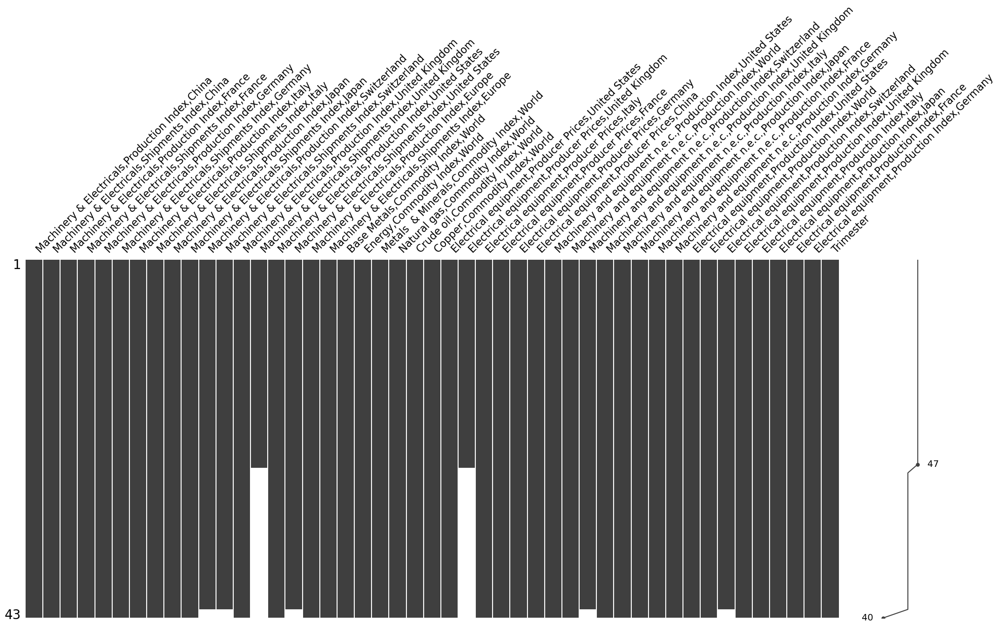

In [47]:
msno.matrix(df_market_to_join)

We have **no information** for ``'Machinery & Electricals,Shipments Index,United Kingdom'`` and ``'Electrical equipment,Producer Prices,United Kingdom'`` - so these should not be considered. With the rest we are going to **interpolate** values to make our analysis more complete. There is only one row with missing values, which is for the month 4 of 2022, the latest month recorded, so we will quickly input this.

In [48]:
df_market_to_join = df_market_to_join.drop([
    'Machinery & Electricals,Shipments Index,United Kingdom',
    'Electrical equipment,Producer Prices,United Kingdom'
], axis=1)

``Interpolation``

**Linear interpolation** is a method used to estimate missing values in time series by assuming a linear change between neighboring data points. It's simple, fast, and commonly used for large datasets. However, it may not be accurate for nonlinear data or large gaps, where more advanced methods like cubic spline interpolation may be better.

In [49]:
# Creating a copy of the dataset
df_market_to_join_interpolation = df_market_to_join.copy()
# locate the NaN values
df_with_missing_values = df_market_to_join_interpolation.isna()
# set the maximum number of columns to display
pd.set_option('display.max_columns', None)
# See the rows with missing
missing_values = df_market_to_join_interpolation[df_market_to_join_interpolation.isnull().any(axis=1)]
# Checking our missing values
missing_values 
# Interpolate missing values in each column separately
df_market_to_join_interpolation = df_market_to_join_interpolation.apply(lambda col: col.interpolate(method='linear', axis=0))

# Replace any remaining missing values with the previous or next value in the same column
df_market_to_join_interpolation = df_market_to_join_interpolation.ffill().bfill()

# verify that there are no more NaN values in the DataFrame
if df_market_to_join_interpolation.isnull().values.any():
    print("There are still some NaN values in the DataFrame!")
else:
    print("All missing values have been interpolated successfully!")
    print(df_market_to_join_interpolation.isna().sum())

# Keeping this approach and applying it to out dataset
df_market_to_join = df_market_to_join_interpolation

All missing values have been interpolated successfully!
Machinery & Electricals,Production Index,China                    0
Machinery & Electricals,Shipments Index,China                     0
Machinery & Electricals,Production Index,France                   0
Machinery & Electricals,Shipments Index,France                    0
Machinery & Electricals,Production Index,Germany                  0
Machinery & Electricals,Shipments Index,Germany                   0
Machinery & Electricals,Production Index,Italy                    0
Machinery & Electricals,Shipments Index,Italy                     0
Machinery & Electricals,Production Index,Japan                    0
Machinery & Electricals,Shipments Index,Japan                     0
Machinery & Electricals,Production Index,Switzerland              0
Machinery & Electricals,Shipments Index,Switzerland               0
Machinery & Electricals,Production Index,United Kingdom           0
Machinery & Electricals,Production Index,United States      

### `Merging Market and Sales Datasets`

In [50]:
df_sales.shape

(43, 17)

In [51]:
# Step 1: Reset the index for df_market_to_join to turn 'MonthYear' into a column
df_market_to_join_reset = df_market_to_join.reset_index()

# Step 2: Rename the 'index' column to 'MonthYear'
df_market_to_join_reset.rename(columns={'index': 'MonthYear'}, inplace=True)

# Step 3: Convert 'MonthYear' to YYYY-MM format (e.g., 2017m10 -> 2017-10)
df_market_to_join_reset['MonthYear'] = pd.to_datetime(df_market_to_join_reset['MonthYear'], format='%Ym%m').dt.strftime('%Y-%m')

# Step 4: Merge df_sales_reset and df_market_to_join_reset on 'MonthYear'
joined_df = pd.merge(df_market_to_join_reset, df_sales, on='MonthYear', how='left')

# Step 5: Set 'MonthYear' as the index
joined_df.set_index('MonthYear', inplace=True)

# Display the result
joined_df.head(5)


,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester,Year,Month,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9,Sales_EUR
MonthYear,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,211.96,211.96,108.28,122.45,124.23,137.74,118.35,122.46,125.21,124.79,109.08,104.59,113.66,111.90,127.81,124.39,130.99,86.10,100.22,79.35,89.57,97.07,82.55,110.70,105.30,102.06,109.12,96.32,111.42,131.34,106.82,110.89,129.39,131.50,114.72,127.46,112.85,129.33,112.97,118.67,93.00,112.38,97.85,118.30,4,2018,10,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,49471370.83
2018-11,220.52,220.52,99.64,115.96,127.40,142.73,107.72,120.13,122.62,123.29,112.24,107.66,115.09,110.88,117.68,123.07,132.93,83.84,84.44,77.50,97.36,78.84,82.23,110.99,105.30,102.06,109.22,95.37,109.74,129.98,110.79,112.12,117.99,127.88,104.87,132.99,113.15,128.24,114.74,120.47,84.13,111.91,91.16,117.16,4,2018,11,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90,30760578.47
2018-12,241.85,241.85,94.69,115.13,120.52,141.41,88.78,131.94,122.99,124.51,115.41,110.72,101.56,106.26,123.28,113.86,131.26,82.73,74.90,76.07,94.41,68.27,80.63,111.16,105.30,102.17,109.33,94.99,103.45,124.20,114.77,99.45,99.19,128.13,104.97,137.36,111.82,117.04,116.50,105.38,64.88,112.52,78.03,89.63,4,2018,12,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00,61312068.79
2019-01,175.67,175.67,90.14,108.33,104.78,118.70,99.28,92.42,105.51,106.30,109.62,105.16,101.80,107.51,111.04,106.42,113.06,81.25,76.20,75.77,80.06,71.59,78.82,111.39,105.51,102.78,109.75,94.95,106.51,112.18,109.20,98.83,106.99,110.20,95.23,104.43,109.50,111.52,110.35,107.17,81.

In [52]:
# Defining a list with our target features
targets = [col for col in joined_df.columns if col.startswith("#")]
joined_df[targets]

,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
MonthYear,,,,,,,,,,,,,,
2018-10,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018-11,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018-12,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019-01,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10,381400.15,1487.00
2019-02,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,6879250.99,542037.52,368475.57,3234.28
2019-03,33856803.04,493999.81,10118.00,11890.00,7535.25,2258352.22,3369.55,11040544.57,7373.42,491643.59,11914313.63,735604.23,591288.36,13050.61
2019-04,39688292.01,1484281.60,21813.27,7488.54,0.00,224501.90,3619.63,12317479.75,4280.25,426221.34,5714462.48,277575.12,418899.90,9119.65
2019-05,38897974.29,1066063.90,24468.00,2550.31,17771.40,353451.54,938.90,12798945.18,16905.32,375671.57,11389673.26,315978.77,298806.84,4614.08
2019-06,39106750.23,492133.20,44255.68,34849.21,63017.71,367425.38,772.94,11546452.19,15516.22,190721.15,13681879.16,282963.19,420707.73,4488.09


In [53]:
targets

['#1',
 '#11',
 '#12',
 '#13',
 '#14',
 '#16',
 '#20',
 '#3',
 '#36',
 '#4',
 '#5',
 '#6',
 '#8',
 '#9']

In [54]:
joined_df.shape

(43, 62)

In [55]:
 # we don't really need these since our index is this
joined_df = joined_df.drop(columns=["Month", "Year"])
joined_df

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9,Sales_EUR
MonthYear,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,211.96,211.96,108.28,122.45,124.23,137.74,118.35,122.46,125.21,124.79,109.08,104.59,113.66,111.90,127.81,124.39,130.99,86.10,100.22,79.35,89.57,97.07,82.55,110.70,105.30,102.06,109.12,96.32,111.42,131.34,106.82,110.89,129.39,131.50,114.72,127.46,112.85,129.33,112.97,118.67,93.00,112.38,97.85,118.30,4,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,49471370.83
2018-11,220.52,220.52,99.64,115.96,127.40,142.73,107.72,120.13,122.62,123.29,112.24,107.66,115.09,110.88,117.68,123.07,132.93,83.84,84.44,77.50,97.36,78.84,82.23,110.99,105.30,102.06,109.22,95.37,109.74,129.98,110.79,112.12,117.99,127.88,104.87,132.99,113.15,128.24,114.74,120.47,84.13,111.91,91.16,117.16,4,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90,30760578.47
2018-12,241.85,241.85,94.69,115.13,120.52,141.41,88.78,131.94,122.99,124.51,115.41,110.72,101.56,106.26,123.28,113.86,131.26,82.73,74.90,76.07,94.41,68.27,80.63,111.16,105.30,102.17,109.33,94.99,103.45,124.20,114.77,99.45,99.19,128.13,104.97,137.36,111.82,117.04,116.50,105.38,64.88,112.52,78.03,89.63,4,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00,61312068.79
2019-01,175.67,175.67,90.14,108.33,104.78,118.70,99.28,92.42,105.51,106.30,109.62,105.16,101.80,107.51,111.04,106.42,113.06,81.25,76.20,75.77,80.06,71.59,78.82,111.39,105.51,102.78,109.75,94.95,106.51,112.18,109.20,98.83,106.99,110.20,95.23,104.43,109.50,111.52,110.35,107.17,81.56,95.96,81.91,105.41,1,27728148.35,2

## `3.2 Lagging Features`

**Lagged features** are essential in time series analysis, as they are past values that could be used as predictors for future values. They can capture the patterns/trends that persist over time.

#### ``Autocorrelation Function and Partial Autocorrelation Function (ACF & PACF)``

In [56]:
joined_df_pacf = joined_df.copy()

In [57]:
# this was just to better understand how some of our variables vary overtime
# Loop through each column and plot the ACF and PACF side by side
'''for col in joined_df_pacf.columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    plot_acf(joined_df_pacf[col], ax=axes[0], lags=10)
    plot_pacf(joined_df_pacf[col], ax=axes[1], lags=5)

    axes[0].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)
    axes[1].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)
    axes[0].set_title('ACF', fontweight='bold')
    axes[1].set_title('PACF', fontweight='bold')
    plt.suptitle('ACF and PACF for {}'.format(col), fontweight='bold')
    #fig.savefig('ACF_PACF_{}.png'.format(col), dpi=300, bbox_inches='tight')
    plt.show()'''

"for col in joined_df_pacf.columns:\n    fig, axes = plt.subplots(1, 2, figsize=(12, 4))\n    plot_acf(joined_df_pacf[col], ax=axes[0], lags=10)\n    plot_pacf(joined_df_pacf[col], ax=axes[1], lags=5)\n\n    axes[0].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)\n    axes[1].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)\n    axes[0].set_title('ACF', fontweight='bold')\n    axes[1].set_title('PACF', fontweight='bold')\n    plt.suptitle('ACF and PACF for {}'.format(col), fontweight='bold')\n    #fig.savefig('ACF_PACF_{}.png'.format(col), dpi=300, bbox_inches='tight')\n    plt.show()"

In [58]:
# Select only the target columns
'''df_targets = joined_df_pacf[targets]

# Loop through each target and plot the ACF and PACF side by side
for target in targets:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    plot_acf(df_targets[target], ax=axes[0], lags=18)
    plot_pacf(df_targets[target], ax=axes[1], lags=12)
    axes[0].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)
    axes[1].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)
    axes[0].set_title('ACF for {}'.format(target), fontweight='bold')
    axes[1].set_title('PACF for {}'.format(target), fontweight='bold')
    plt.suptitle('ACF and PACF for {}'.format(target), fontweight='bold')
    #fig.savefig('ACF_PACF_{}.png'.format(target), dpi=300, bbox_inches='tight')
    plt.show()'''

"df_targets = joined_df_pacf[targets]\n\n# Loop through each target and plot the ACF and PACF side by side\nfor target in targets:\n    fig, axes = plt.subplots(1, 2, figsize=(12, 5))\n    plot_acf(df_targets[target], ax=axes[0], lags=18)\n    plot_pacf(df_targets[target], ax=axes[1], lags=12)\n    axes[0].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)\n    axes[1].grid(color='gray', linestyle='-', linewidth=0.25, alpha=0.5)\n    axes[0].set_title('ACF for {}'.format(target), fontweight='bold')\n    axes[1].set_title('PACF for {}'.format(target), fontweight='bold')\n    plt.suptitle('ACF and PACF for {}'.format(target), fontweight='bold')\n    #fig.savefig('ACF_PACF_{}.png'.format(target), dpi=300, bbox_inches='tight')\n    plt.show()"

In [59]:
df = joined_df_pacf  # replace with your dataframe

# Threshold to consider a lag significant
significance_threshold = 0.2  # Correlation value threshold for significance

# List to hold the insights
insights = []

# Loop through each target and plot the ACF and PACF side by side
for target in targets:
    # Compute ACF and PACF values manually for lags 1 to 10
    acf_values = [df[target].autocorr(lag=lag) for lag in range(1, 19)]  # ACF values for lags 1-10
    
    # Use pacf from statsmodels to compute PACF values
    pacf_values = pacf(df[target], nlags=18)[1:]  # PACF values for lags 1-10 (excluding lag 0)

    # Get significant lags for ACF (based on threshold)
    significant_acf_lags = [lag for lag, acf_val in enumerate(acf_values, start=1) if np.abs(acf_val) > significance_threshold]
    significant_pacf_lags = [lag for lag, pacf_val in enumerate(pacf_values, start=1) if np.abs(pacf_val) > significance_threshold]
    
    # Log insights based on the significant lags
    insight = {
        'target': target,
        'significant_acf_lags': significant_acf_lags,
        'significant_pacf_lags': significant_pacf_lags,
        'acf_values': acf_values,
        'pacf_values': pacf_values.tolist(),
    }
    
    # Add the insight for this target to the list
    insights.append(insight)

insights

[{'target': '#1',
  'significant_acf_lags': [2, 9, 10, 18],
  'significant_pacf_lags': [18],
  'acf_values': [0.042518217143977535,
   0.3177205504969224,
   -0.07174147547715101,
   -0.02494962074740615,
   -0.13308583115639924,
   0.05242351565223355,
   -0.08906674603498303,
   -0.10920368727167466,
   -0.22624693889418662,
   -0.22235311196238497,
   -0.02283285587184931,
   0.08401954257140248,
   -0.04302268489599949,
   -0.02525317897584966,
   0.015310322672743302,
   -0.12497403536486383,
   -0.0107508614979507,
   0.346811214784858],
  'pacf_values': [0.04314196413032762,
   0.18398140462488904,
   -0.06600777421344425,
   -0.054296863974113596,
   -0.06350808452755885,
   0.04377750589916938,
   -0.04650730472396158,
   -0.1010355045274895,
   -0.1347514250151961,
   -0.12845354662402728,
   0.025684366426855388,
   0.07008261490753225,
   -0.08920034333161186,
   -0.09169251803936476,
   0.00922783194689542,
   -0.09199980125991469,
   -0.05805010310373754,
   0.25161761289

In [60]:
# Create a list to store the new dataframes
product_dfs = []

# Loop 14 times to create 14 new dataframes
for i in [1, 11, 12, 13, 14, 16, 20, 3, 36, 4, 5, 6, 8, 9]:
    # Select the first 56 columns and add the i-th column from the last_cols list as the last column
    product_df = joined_df.iloc[:, :45].copy()
    product_df['#' + str(i)] = joined_df['#' + str(i)]
    
    # Store the new dataframe in a variable with the desired name
    exec(f'product_{i} = product_df')
    
    # Append the new dataframe to the list
    product_dfs.append(product_df)

#product_dfs[0]

In [61]:
# Auxiliary funtion to hep generate lagged features
def generate_lagged_features(df, n_lags, columns=None, max_lag = 1):
    """
    Arguments:
    - df (pandas.DataFrame): The dataset to create lag features for.
    - n_lags (int): The number of lag features to create.
    - columns (list of str): The columns to create lag features for. If None, create lag features for all columns.
    - max_lag: maximum nr of lags. Default is 1

    Returns:
    - pandas.DataFrame: The original dataset with lag features appended.
    """
    # create a copy of the dataset so it isn't modified
    df_lagg = df.copy()
    
    # defining the list with all features of the df
    if columns is None:
        columns = df.columns

    # Create copies of the dataset shifted by each lag
    lags = range(1, n_lags+1)
    lagged_data = [df[columns].shift(lag).add_suffix(f'_lag_{lag}') for lag in lags]

    # Concatenate the lagged datasets and drop rows with missing values
    lagged_df = pd.concat([df] + lagged_data, axis=1)

    return lagged_df

In [62]:
column_to_lag_1 = ["#1"]
column_to_lag_11 = ["#11"]
column_to_lag_12 = ["#12"]
column_to_lag_13 = ["#13"]
column_to_lag_14 = ["#14"]
column_to_lag_16 = ["#16"]
column_to_lag_20 = ["#20"]
column_to_lag_3 = ["#3"]
column_to_lag_36 = ["#36"]
column_to_lag_4 = ["#4"]
column_to_lag_5 = ["#5"]
column_to_lag_6 = ["#6"]
column_to_lag_8 = ["#8"]
column_to_lag_9 = ["#9"]

In [63]:
product_1 = generate_lagged_features(product_1, n_lags=18,columns=column_to_lag_1,max_lag=1)
product_11 = generate_lagged_features(product_11, n_lags=18,columns=column_to_lag_11,max_lag=1)
product_12 = generate_lagged_features(product_12, n_lags=18,columns=column_to_lag_12,max_lag=1)
product_13 = generate_lagged_features(product_13, n_lags=18,columns=column_to_lag_13,max_lag=1)
product_14 = generate_lagged_features(product_14, n_lags=18,columns=column_to_lag_14,max_lag=1)
product_16 = generate_lagged_features(product_16, n_lags=18,columns=column_to_lag_16,max_lag=1)
product_20 = generate_lagged_features(product_20, n_lags=18,columns=column_to_lag_20,max_lag=1)
product_3 = generate_lagged_features(product_3, n_lags=18,columns=column_to_lag_3,max_lag=1)
product_36 = generate_lagged_features(product_36, n_lags=18,columns=column_to_lag_36,max_lag=1)
product_4 = generate_lagged_features(product_4, n_lags=18,columns=column_to_lag_4,max_lag=1)
product_5 = generate_lagged_features(product_5, n_lags=18,columns=column_to_lag_5,max_lag=1)
product_6 = generate_lagged_features(product_6, n_lags=18,columns=column_to_lag_6,max_lag=1)
product_8 = generate_lagged_features(product_8, n_lags=18,columns=column_to_lag_8,max_lag=1)
product_9 = generate_lagged_features(product_9, n_lags=18,columns=column_to_lag_9,max_lag=1)

In [64]:
# creating a list
lagged_dfs = [product_1, product_11, product_12, product_13, product_14, product_16, product_20, product_3, product_36, product_4, product_5, product_6, product_8, product_9]

<code>Finding the optimal lags for each product dataset </code>

In [65]:
# Dictionary to store the optimal lag values for each product
optimal_lags = {}
# Initialize a list to store the optimal lag values
optimal_lag_values = []
# List of product IDs (the same column names you're working with)
columns = [1, 11, 12, 13, 14, 16, 20, 3, 36, 4, 5, 6, 8, 9]

# Loop through all the datasets and find the optimal lag value
for i in columns:
    # Define the column to lag for the dataset (retrieved dynamically)
    column_to_lag = eval(f"column_to_lag_{i}")
    
    # Define the dataset to use (retrieved dynamically)
    df = eval(f"product_{i}")
    
    # Define the columns to correlate (lag columns and original columns)
    lagged_cols = [f'{column_to_lag[0]}_lag_{j}' for j in range(1, 19)]
    cols_to_correlate = df.columns[:45].tolist() + lagged_cols
    #print(cols_to_correlate)
    
    # Compute the correlation matrix
    corr_matrix = df[cols_to_correlate].corr()
    
    # Find the maximum correlation for each lag value
    max_corr = corr_matrix.loc[cols_to_correlate[:45], lagged_cols].abs().max()
    
    # Find the lag value with the maximum correlation
    lag_value = max_corr.idxmax()[len(column_to_lag[0] + '_lag_'):]
    
    # Store the optimal lag value in the dictionary with the product code as the key
    product_code = f"#{i}"
    optimal_lags[product_code] = int(lag_value)
    
    # Optionally print the result
    print(f'Optimal lag value for dataset product_{i} is {lag_value}')


Optimal lag value for dataset product_1 is 17
Optimal lag value for dataset product_11 is 18
Optimal lag value for dataset product_12 is 16
Optimal lag value for dataset product_13 is 9
Optimal lag value for dataset product_14 is 12
Optimal lag value for dataset product_16 is 16
Optimal lag value for dataset product_20 is 12
Optimal lag value for dataset product_3 is 18
Optimal lag value for dataset product_36 is 12
Optimal lag value for dataset product_4 is 15
Optimal lag value for dataset product_5 is 18
Optimal lag value for dataset product_6 is 7
Optimal lag value for dataset product_8 is 7
Optimal lag value for dataset product_9 is 18


In [66]:
# List of product IDs
product_ids = [1, 11, 12, 13, 14, 16, 20, 3, 36, 4, 5, 6, 8, 9]

# Loop over each product ID and perform the column dropping based on the optimal lag
for product_id in product_ids:
    # Dynamically get the product dataframe (using globals() to access variable by name)
    product_code = f"#{product_id}"
    product_df = globals().get(f"product_{product_id}")
    
    # Retrieve the optimal lag value for the current product
    optimal_lag = optimal_lags.get(product_code)
    
    # Define the columns to keep (only the lag column for the optimal lag)
    cols_to_keep = [f"{product_code}_lag_{optimal_lag}"]
    
    # Identify columns to drop (those starting with the product's lag column prefix but not matching the optimal lag)
    cols_to_drop = [col for col in product_df.columns if col.startswith(f"{product_code}_lag_") and col not in cols_to_keep]
    
    # Drop the columns that are not needed
    product_df.drop(cols_to_drop, axis=1, inplace=True)


`Joining all lagged features into one complete dataset.`

In [67]:
# list of dataset names to be joined
datasets = ["product_11", "product_12", "product_13", "product_14", "product_16", "product_20", "product_3", "product_36", "product_4", "product_5", "product_6", "product_8", "product_9"]

# create an empty dataframe to store the final result
final_df = pd.DataFrame()

# loop through each dataset and join the last two columns with product_1
for dataset in datasets:
    # load the dataset
    df = eval(dataset)
    # join the last two columns with product_1
    product_1 = pd.concat([product_1, df.iloc[:, -2:]], axis=1)

# assign the final dataframe to a new variable or overwrite product_1
final_df = product_1.copy()

# Creating sa copy of the dataset
joined_df = final_df.copy()

# Getting product_1 dfataframe back to the orinal form but with the lagged column
product_1 = product_1.iloc[:, :47]

The output of this section is `joined_df`.

## `3.3 Feature Engineering`

We created a column `Trimester` to try and find patterns in seasonality or periodicity that affect the target variable. This was addressed in the `Data Preparation` Section.

Additionally, we also kept **lagged features** that had the most correlation with each target. These will be considered for our analysis to find relationships within the same product but also between them.

At this point we did not consider any further feature enginering as our dataset already presented a lot of varierty/diversity in features/indeces for a lot of different metrics across a considerable amount of countries.

## `3.4 Outliers`

We wanted to assess the extreme values in our anaylsis. To do this we used the IQR method.

In [68]:
non_metric_features = ["Trimester"]
metric_features = joined_df.columns.drop(non_metric_features).to_list()

In [69]:
# List to store feature names with more than 10% outliers (definined threshold)
features_above_10_percent = []

In [70]:
outlier_percentages = {}
# We know that low outliers are below Q1 − 1.5 ⋅ IQR and high outliers are above Q3 + 1.5 ⋅ IQR
for column in metric_features:
    # Defining Q1 and Q3 to then find IQR
    Q1 = joined_df[column].quantile(0.25)
    Q3 = joined_df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # Getting the outliers below the first quantile and above the second quantile
    outliers = joined_df[(joined_df[column] < (Q1 - 1.5 * IQR)) | (joined_df[column] > (Q3 + 1.5 * IQR))]
    
    # Getting the percentage of the outliers
    percentage_outliers = (len(outliers) / len(joined_df)) * 100
    outlier_percentages[column] = percentage_outliers

# Printing the results and counting the number of columns per the percentage higher or lower than 5.
nr_col_lower_5 = 0
nr_col_higher_5 = 0
nr_col_higher_10 = 0

print("Percentage of outliers per column using IQR:")
for column, percentage in outlier_percentages.items():
    print(f"{column}: \033[1;35m{percentage:.2f}%\033[0m")
    
    # Count columns based on percentage ranges
    if percentage < 5:
        nr_col_lower_5 += 1
    if percentage > 5:
        nr_col_higher_5 += 1
    if percentage > 10:
        nr_col_higher_10 += 1
        features_above_10_percent.append(column)  # Add feature name to the list

# Printing the number of columns that have a percentage lower than 5%, higher than 5%, and higher than 10%
print(f"From the columns, \033[1;33m{nr_col_lower_5}\033[0m have a percentage lower than 5%")
print(f"From the columns, \033[1;33m{nr_col_higher_5}\033[0m have a percentage higher than 5%")
print(f"From the columns, \033[1;33m{nr_col_higher_10}\033[0m have a percentage higher than 10%")

Percentage of outliers per column using IQR:
Machinery & Electricals,Production Index,China: 4.65%
Machinery & Electricals,Shipments Index,China: 4.65%
Machinery & Electricals,Production Index,France: 11.63%
Machinery & Electricals,Shipments Index,France: 6.98%
Machinery & Electricals,Production Index,Germany: 2.33%
Machinery & Electricals,Shipments Index,Germany: 2.33%
Machinery & Electricals,Production Index,Italy: 9.30%
Machinery & Electricals,Shipments Index,Italy: 2.33%
Machinery & Electricals,Production Index,Japan: 2.33%
Machinery & Electricals,Shipments Index,Japan: 2.33%
Machinery & Electricals,Production Index,Switzerland: 0.00%
Machinery & Electricals,Shipments Index,Switzerland: 0.00%
Machinery & Electricals,Production Index,United Kingdom: 4.65%
Machinery & Electricals,Production Index,United States: 2.33%
Machinery & Electricals,Shipments Index,United States: 4.65%
Machinery & Electricals,Production Index,Europe: 6.98%
Machinery & Electricals,Shipments Index,Europe: 9.30%

In [71]:
# Output the list of features with more than 10% outliers
print("\nFeatures with more than 10% outliers:")
print(features_above_10_percent)


Features with more than 10% outliers:
['Machinery & Electricals,Production Index,France', 'Natural gas,Commodity Index,World', 'Electrical equipment,Producer Prices,Germany', 'Machinery and equipment n.e.c.,Production Index,France', 'Electrical equipment,Production Index,United States', '#16', '#16_lag_16']


`Plotting Box-Plots for Visual Inspection`

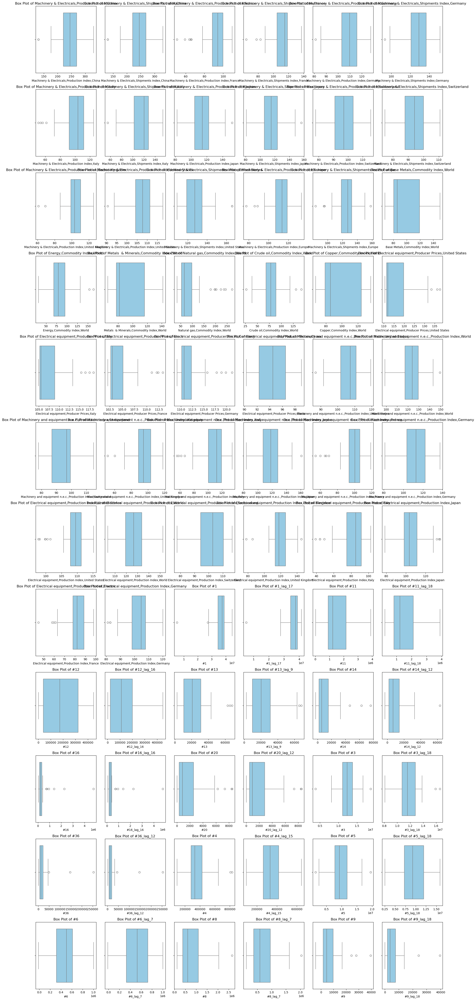

In [72]:
n_cols = 6
n_rows = 12  # Calculate rows needed

# Set the figure size for readability
plt.figure(figsize=(20, 4 * n_rows))

# Plot each numerical column in a separate horizontal box plot
for i, column in enumerate(metric_features, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=joined_df, x=column, color = '#89CFF0')
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)

plt.tight_layout()
plt.show()

`Capping outliers at the upper and lower bounds`

Capping outliers, also known as **winsorization**, is a technique used to limit extreme values in a dataset to reduce their impact on statistical analysis and model performance. 

**Why?**
- Improved Model Performance: Extreme values can skew the results of machine learning algorithms, especially those sensitive to outliers.
- Data Normalization: Capping helps bring data to a more consistent scale, making it easier to compare variables.
- Preserve Trends: This process still allows us to identify trends in data, as results are still considered very high or low values therefore representing the actual real world scenario.

In [73]:
def cap_outliers(df, metric_features):
    # Iterate through each feature in the list of metric features
    for column in metric_features:
        # Defining Q1 and Q3 to then find IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define the lower and upper bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Cap the outliers at the lower and upper bounds
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
        
    return df

In [74]:
df_capped = cap_outliers(joined_df, metric_features)
df_capped.head(3)

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester,#1,#1_lag_17,#11,#11_lag_18,#12,#12_lag_16,#13,#13_lag_9,#14,#14_lag_12,#16,#16_lag_16,#20,#20_lag_12,#3,#3_lag_18,#36,#36_lag_12,#4,#4_lag_15,#5,#5_lag_18,#6,#6_lag_7,#8,#8_lag_7,#9,#9_lag_18
MonthYear,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,211.96,211.96,108.28,122.45,124.23,137.74,118.35,122.46,125.21,124.79,109.08,104.59,113.66,111.90,127.81,124.39,130.99,86.10,100.22,79.35,89.57,97.07,82.55,110.70,105.30,102.06,109.12,96.32,111.42,131.34,106.82,110.89,129.39,131.50,114.72,127.46,112.85,129.33,112.97,118.67,93.00,112.38,97.85,118.30,4,36098918.79,NaN,1021303.50,NaN,28686.33,NaN,27666.10,NaN,5770.00,NaN,333196.87,NaN,4563.14,NaN,8089465.96,NaN,6474.60,NaN,397760.69,NaN,2499061.19,NaN,369231.60,NaN,586052.74,NaN,3219.32,NaN
2018-11,220.52,220.52,99.64,115.96,127.40,142.73,107.72,120.13,122.62,123.29,112.24,107.66,115.09,110.88,117.68,123.07,132.93,83.84,84.44,77.50,97.36,78.84,82.23,110.99,105.30,102.06,109.22,95.37,109.74,129.98,110.79,112.12,117.99,127.88,104.87,132.99,113.15,128.24,114.74,120.47,84.13,111.91,91.16,117.16,4,27689397.14,NaN,1898844.80,NaN,1070.00,NaN,61716.33,NaN,17130.00,NaN,614599.90,NaN,5798.14,NaN,11863001.51,NaN,21617.61,NaN,371322.42,NaN,8993944.04,NaN,473046.96,NaN,526292.77,NaN,1875.90,NaN
2018-12,241.85,241.85,94.69,115.13,120.52,141.41,88.78,131.94,122.99,124.51,115.41,110.72,101.56,106.26,123.28,113.86,131.26,82.73,74.90,76.07,94.41,68.27,80.63,111.16,105.30,102.17,109.33,94.99,103.45,124.20,114.77,99.45,99.19,128.13,104.97,137.36,111.82,117.04,116.50,105.38,64.88,112.52,78.03,89.63,4,37889612.12,NaN,1226122.00,NaN,17880.60,NaN,15655.18,NaN,0.00,NaN,614599.90,NaN,918.65,NaN,8736859.39,NaN,13924.52,NaN,430100.96,NaN,6947507.31,NaN,999472.69,NaN,271490.71,NaN,0.00,NaN


In [75]:
joined_df = df_capped.copy()

## `` 3.5 Standardization``

For data preprocessing, it's important to rescale the features of our dataset so that they have a mean of 0 and a standar deviation of 1. This process is called standardization and it's what we'll attempt to do in this phase as it is essential when the features have different units or scales. This will help us achieve better performance in the modelling phase.

In [76]:
def plot_metric_histograms(df, metric_features):
    n_features = len(metric_features)  # Get the number of metric features
    n_cols = 6  # Number of histograms per row
    n_rows = (n_features + n_cols - 1) // n_cols  # Calculate number of rows needed

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

    # Flatten axes array for easy iteration
    axes = axes.flatten()

    # Loop through the metric features and plot histograms
    for i, feature in enumerate(metric_features):
        axes[i].hist(df[feature].dropna(), bins=20, edgecolor='black', color='midnightblue')  # Create histogram
        axes[i].set_title(f"Histogram of {feature}", fontsize=5)  # Title for each histogram
        axes[i].grid(True)  # Add gridlines

    # Hide any empty subplots (in case the grid doesn't fit perfectly)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()  # Display the grid of histograms
    

In [77]:
# Creating a copy os our dataset
joined_df_standard = joined_df.copy()

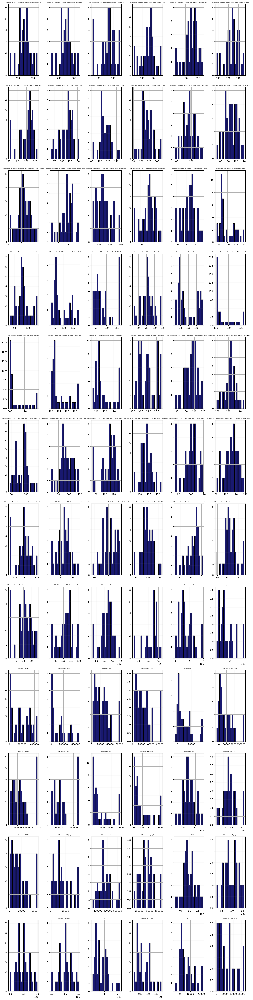

In [78]:
plot_metric_histograms(joined_df_standard, metric_features)

Based on these histograms, many of the features appear to have **skewed distributions** and are not normalized, as evidenced by the wide range of values. To improve model performance, applying scaling techniques would help transform the features to the same range.

### ``3.5.1. Standard Scaler``
StandardScaler will standardize the features of our dataset by transforming them in order to have a mean of 0 and standard deviation of 1. 

In [79]:
def scaler_func_standard(df, metric):
    
    # Defining an instance of Standard Scaler
    scaler = StandardScaler().fit(df.loc[:, metric])
    
    # Fit the data
    scaled_features = scaler.transform(df.loc[:, metric])

    df.loc[:, metric] = scaled_features
    
    return df

In [80]:
scaler_func_standard(joined_df_standard, metric_features)

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester,#1,#1_lag_17,#11,#11_lag_18,#12,#12_lag_16,#13,#13_lag_9,#14,#14_lag_12,#16,#16_lag_16,#20,#20_lag_12,#3,#3_lag_18,#36,#36_lag_12,#4,#4_lag_15,#5,#5_lag_18,#6,#6_lag_7,#8,#8_lag_7,#9,#9_lag_18
MonthYear,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,-0.85,-0.85,1.51,0.85,1.50,0.79,1.15,0.39,0.83,0.67,1.46,1.34,1.01,0.84,-0.06,1.14,0.42,-0.49,0.74,-0.68,0.13,0.96,-0.66,-0.76,-0.63,-0.92,-1.23,0.70,0.74,0.77,1.44,1.35,1.30,0.88,1.33,1.18,1.12,0.30,1.19,-0.03,0.82,0.64,1.70,1.70,4,-0.10,NaN,-0.53,NaN,-1.18,NaN,0.29,NaN,-0.38,NaN,0.42,NaN,1.56,NaN,-1.91,NaN,-0.76,NaN,0.32,NaN,-2.08,NaN,-0.46,NaN,-0.43,NaN,-0.53,NaN
2018-11,-0.64,-0.64,0.68,0.35,1.81,1.18,0.49,0.28,0.64,0.57,1.84,1.72,1.16,0.66,-0.87,1.02,0.56,-0.58,0.12,-0.77,0.31,0.07,-0.67,-0.71,-0.63,-0.92,-1.18,0.33,0.49,0.65,1.90,1.46,0.59,0.64,0.49,1.60,1.21,0.20,1.37,0.15,0.20,0.60,0.99,1.57,4,-2.42,NaN,0.38,NaN,-1.37,NaN,2.53,NaN,0.74,NaN,2.08,NaN,2.22,NaN,-0.26,NaN,0.45,NaN,0.12,NaN,-0.27,NaN,-0.03,NaN,-0.54,NaN,-0.75,NaN
2018-12,-0.12,-0.12,0.20,0.29,1.14,1.07,-0.70,0.85,0.67,0.65,2.23,2.09,-0.21,-0.18,-0.42,0.14,0.44,-0.63,-0.26,-0.83,0.24,-0.44,-0.74,-0.69,-0.63,-0.87,-1.13,0.18,-0.45,0.10,2.36,0.39,-0.57,0.66,0.50,1.93,0.81,-0.81,1.55,-1.35,-1.17,0.65,-0.40,-1.45,4,0.40,NaN,-0.32,NaN,-1.25,NaN,-0.50,NaN,-0.95,NaN,2.08,NaN,-0.40,NaN,-1.63,NaN,-0.16,NaN,0.56,NaN,-0.84,NaN,2.17,NaN,-1.05,NaN,-1.05,NaN
2019-01,-1.74,-1.74,-0.24,-0.23,-0.38,-0.70,-0.04,-1.08,-0.59,-0.60,1.53,1.41,-0.19,0.04,-1.41,-0.58,-0.91,-0.70,-0.20,-0.85,-0.09,-0.28,-0.82,-0.66,-0.56,-0.60,-0.92,0.16,0.01,-1.02,1.71,0.34,-0.09,-0.52,-0.33,-0.57,0.10,-1.31,0.92,-1.17,0.01,-0.74,0.01,0.28,1,-2.41,NaN,0.71,NaN,-1.23,NaN,0.26,NaN,-0.78,NaN,2.08,NaN,0.40,NaN,-0.77,NaN,-0.04,NaN,0.96,NaN,-0.48,NaN,0.50,NaN,-0.83,NaN,-0.81

<span style="color: grey;">Note: We didn't consider **MinMax** as we believed that even with our outlier approach, the difference in data scaling would still make a difference. RobustScaler was also an option but we deemed StandardScaler an appropriate solution.</span>

## `3.6 Encoding`

<b>One-hot encoding </b>is a technique used to convert categorical variables into a numerical format that can be used in machine learning algorithms. In this process, each category or class is represented by a binary vector (a series of 0s and 1s), where each vector corresponds to a single category. In this case we only have one categorical feature `Trimester`.

In [81]:
def oh_encode(X, features):
    
    data = X[features]
    
    # Define an instance for One-Hot Encoding
    oh_encoder = OneHotEncoder(drop="first")
    
    # Fit our data
    ohe_feat = oh_encoder.fit_transform(data)
    
    ohe_df = pd.DataFrame(ohe_feat.toarray(), index=data.index, columns=oh_encoder.get_feature_names_out())
    
    X[oh_encoder.get_feature_names_out()] = ohe_df
    
    X = X.drop(features, axis=1)
    
    return X

In [82]:
# Creating. acopy of the dataset
joined_df_standard_oh = joined_df_standard.copy()
# Creating a list with the non metric features to encode
non_metric_features_encode = ["Trimester"]
# Applying the function created
joined_df_standard_oh = oh_encode(joined_df_standard_oh, non_metric_features_encode)
# Assume joined_df_standard_oh is the DataFrame you are working with

# Extract the column names
cols = joined_df_standard_oh.columns.tolist()

# Find the index of 'CPI,Index,China'
idx = cols.index('Electrical equipment,Production Index,Germany')

# Put the last 3 columns after the 'CPI,Index,China' column
new_cols = cols[:idx+1] + cols[-3:] + cols[idx+1:-3]

# Reindex the DataFrame
joined_df_standard_oh = joined_df_standard_oh.reindex(columns=new_cols)

## `3.7 Feature Selection`

**Filter methods** evaluate each feature based on certain statistical criteria and select the most important ones. We're going to try a few of these methods and decide which one will be more appropriate for our dataset.

**Wrapper methods** use machine learning models to evaluate feature subsets by training models and selecting the features that lead to the best performance.

**Embedded methods** perform feature selection during model training. They integrate the feature selection process directly into the model training phase.

### ``3.7.1 Spearman's Correlation``

In [83]:
# removing targets and lagged features of targets from original dataset
cols_to_be_dropped = ['#1_lag_17', '#11_lag_18', '#12_lag_16', '#13_lag_9', '#14_lag_12',
    '#16_lag_16', '#20_lag_12', '#3_lag_18', '#36_lag_12', '#4_lag_15',
    '#5_lag_18', '#6_lag_7', '#8_lag_7', '#9_lag_18'
]

joined_df_standard_oh = joined_df_standard_oh.drop(columns=cols_to_be_dropped)

In [84]:
joined_df_standard_oh.head(2)

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester_2,Trimester_3,Trimester_4,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
MonthYear,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,-0.85,-0.85,1.51,0.85,1.50,0.79,1.15,0.39,0.83,0.67,1.46,1.34,1.01,0.84,-0.06,1.14,0.42,-0.49,0.74,-0.68,0.13,0.96,-0.66,-0.76,-0.63,-0.92,-1.23,0.70,0.74,0.77,1.44,1.35,1.30,0.88,1.33,1.18,1.12,0.30,1.19,-0.03,0.82,0.64,1.70,1.70,0.00,0.00,1.00,-0.10,-0.53,-1.18,0.29,-0.38,0.42,1.56,-1.91,-0.76,0.32,-2.08,-0.46,-0.43,-0.53
2018-11,-0.64,-0.64,0.68,0.35,1.81,1.18,0.49,0.28,0.64,0.57,1.84,1.72,1.16,0.66,-0.87,1.02,0.56,-0.58,0.12,-0.77,0.31,0.07,-0.67,-0.71,-0.63,-0.92,-1.18,0.33,0.49,0.65,1.90,1.46,0.59,0.64,0.49,1.60,1.21,0.20,1.37,0.15,0.20,0.60,0.99,1.57,0.00,0.00,1.00,-2.42,0.38,-1.37,2.53,0.74,2.08,2.22,-0.26,0.45,0.12,-0.27,-0.03,-0.54,-0.75


In [85]:
feature_selection_results = {}

In [86]:
joined_df_spearman = joined_df_standard_oh.copy()

In [87]:
# Create a correlation matrix between features and target variables
corr_matrix = joined_df_spearman.corr(method="spearman")[targets]
removed_features = 0

# Initialize the feature selection results dictionary
feature_selection_results = {}

# Loop through the correlation matrix to extract correlations greater than 0.55 or less than -0.55
for target_col in corr_matrix.columns:
    # Initialize the dictionary entry for the target
    feature_selection_results[target_col] = {}

    # Store Spearman correlations greater than 0.55 or less than -0.55
    spearman_selected_features = []
    for feature, corr_value in corr_matrix[target_col].items():
        # Exclude correlations equal to 1 (self-correlation) and correlations equal to 0 (no correlation)
        if corr_value != 1 and corr_value != 0 and abs(corr_value) > 0.55:
            if feature not in targets:
                spearman_selected_features.append(feature)
            else:
                removed_features += 1

    # Add Spearman results to the dictionary
    feature_selection_results[target_col]["Spearman"] = spearman_selected_features

# Set the style of the heatmap
sns.set(style="white")
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Define a function to highlight values greater than 0.6 or less than -0.6
def highlight_corr(val):
    # Apply color coding: 
    # - Red for 0 (no correlation)
    # - Green for values with significant correlation (greater than 0.55 or less than -0.55)
    if val == 0:
        return 'background-color: red'  # Highlight 0 as red
    elif abs(val) > 0.55:
        return 'background-color: green'  # Highlight significant correlations in green
    else:
        return ''  # No highlight for non-significant correlations

# Round the correlation values to two decimal places and apply the highlight function
corr_matrix = corr_matrix.round(2).style.applymap(highlight_corr)

# Display the correlation matrix
corr_matrix


,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
"Machinery & Electricals,Production Index,China",0.130000,0.120000,0.520000,-0.160000,0.190000,-0.200000,0.200000,0.290000,0.160000,0.090000,0.270000,0.020000,0.480000,0.330000
"Machinery & Electricals,Shipments Index,China",0.130000,0.120000,0.520000,-0.160000,0.190000,-0.200000,0.200000,0.290000,0.160000,0.090000,0.270000,0.020000,0.480000,0.330000
"Machinery & Electricals,Production Index,France",0.100000,-0.030000,0.020000,0.150000,0.320000,0.280000,0.350000,0.230000,0.080000,0.350000,0.200000,-0.060000,0.070000,0.300000
"Machinery & Electricals,Shipments Index,France",0.030000,-0.110000,0.220000,0.230000,0.150000,0.110000,0.360000,0.200000,0.040000,0.150000,0.260000,-0.130000,0.250000,0.220000
"Machinery & Electricals,Production Index,Germany",0.010000,0.130000,0.020000,0.220000,0.250000,0.410000,0.270000,0.170000,0.070000,0.310000,0.150000,0.020000,0.070000,0.240000
"Machinery & Electricals,Shipments Index,Germany",0.060000,0.200000,0.220000,0.200000,0.210000,0.230000,0.200000,0.310000,0.120000,0.240000,0.210000,-0.020000,0.300000,0.280000
"Machinery & Electricals,Production Index,Italy",0.110000,-0.130000,0.140000,0.020000,0.400000,0.130000,0.330000,0.280000,0.020000,0.370000,0.150000,0.010000,0.070000,0.210000
"Machinery & Electricals,Shipments Index,Italy",0.070000,0.020000,0.380000,0.020000,0.230000,-0.000000,0.180000,0.210000,0.030000,0.190000,0.180000,0.010000,0.280000,0.250000
"Machinery & Electricals,Production Index,Japan",0.060000,0.130000,0.210000,0.240000,0.280000,0.090000,0.210000,0.270000,0.160000,0.250000,0.210000,0.050000,0.360000,0.240000
"Machinery & Electricals,Shipments Index,Japan",0.070000,0.200000,0.210000,0.210000,0.280000,0.090000,0.200000,0.270000,0.160000,0.260000,0.260000,0.070000,0.410000,0.200000


### ``3.7.2 Pearsons Correlation``

The `Pearson method` measures the `linear correlation` between two continuous variables. It calculates the strength and direction of the linear relationship by determining how much one variable changes in proportion to the other. The correlation coefficient ranges from `-1 to 1`, where **1** indicates a perfect positive linear correlation, **-1** indicates a perfect negative linear correlation, and **0** indicates no linear correlation. It assumes that the data is `normally distributed` and that the relationship between the variables is `linear`.

In [88]:
joined_df_pearson = joined_df_standard_oh.copy()

In [89]:
# Create the Pearson correlation matrix
corr_matrix_pearson = joined_df_pearson.corr(method="pearson")[targets]

# Loop through the Pearson correlation matrix to extract correlations greater than 0.55 or less than -0.55
for target_col in corr_matrix_pearson.columns:
    # If the target doesn't exist in feature_selection_results, initialize it
    if target_col not in feature_selection_results:
        feature_selection_results[target_col] = {'Spearman': [], 'Pearson': []}
    
    # Ensure 'Pearson' key exists for the target
    if 'Pearson' not in feature_selection_results[target_col]:
        feature_selection_results[target_col]['Pearson'] = []

    # Store Pearson feature selection for each target
    pearson_selected_features = []

    # Loop through the features and their correlation values
    for feature, corr_value in corr_matrix_pearson[target_col].items():
        # Exclude correlations equal to 1 (self-correlation) and correlations equal to 0 (no correlation)
        if corr_value != 1 and corr_value != 0 and abs(corr_value) > 0.55:
            if feature not in targets:
                pearson_selected_features.append(feature)  # Add the feature
            else:
                removed_features += 1

    # Add the filtered Pearson results to the existing entry under "Pearson" for the target
    feature_selection_results[target_col]["Pearson"].extend(pearson_selected_features)

# Optionally set the style of the heatmap for visualization (not critical for dictionary updates)
sns.set(style="white")
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Define a function to highlight values greater than 0.55 or less than -0.55 (for visualization)
def highlight_corr(val):
    if val == 0:
        return 'background-color: red'  # Highlight 0 as red
    elif abs(val) > 0.55:
        return 'background-color: green'  # Highlight significant correlations in green
    else:
        return ''  # No highlight for non-significant correlations

# Round the correlation values to two decimal places and apply the highlight function for visualization
corr_matrix_pearson = corr_matrix_pearson.round(2).style.applymap(highlight_corr)

# Display the correlation matrix (for visualization purposes)
corr_matrix_pearson


,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
"Machinery & Electricals,Production Index,China",0.240000,0.120000,0.450000,-0.090000,0.230000,-0.250000,0.170000,0.290000,0.200000,0.080000,0.230000,0.030000,0.510000,0.320000
"Machinery & Electricals,Shipments Index,China",0.240000,0.120000,0.450000,-0.090000,0.230000,-0.250000,0.170000,0.290000,0.200000,0.080000,0.230000,0.030000,0.510000,0.320000
"Machinery & Electricals,Production Index,France",0.080000,-0.060000,0.120000,0.210000,0.240000,0.150000,0.280000,0.180000,0.080000,0.290000,0.060000,-0.060000,0.140000,0.300000
"Machinery & Electricals,Shipments Index,France",0.090000,-0.050000,0.250000,0.200000,0.140000,0.070000,0.290000,0.220000,0.130000,0.200000,0.160000,-0.160000,0.310000,0.260000
"Machinery & Electricals,Production Index,Germany",0.080000,0.170000,0.080000,0.290000,0.170000,0.400000,0.240000,0.180000,0.050000,0.240000,0.130000,0.020000,0.120000,0.260000
"Machinery & Electricals,Shipments Index,Germany",0.160000,0.270000,0.270000,0.230000,0.170000,0.250000,0.180000,0.320000,0.110000,0.190000,0.200000,-0.020000,0.380000,0.290000
"Machinery & Electricals,Production Index,Italy",0.070000,-0.130000,0.200000,0.080000,0.360000,0.030000,0.220000,0.260000,0.020000,0.330000,0.030000,-0.090000,0.120000,0.210000
"Machinery & Electricals,Shipments Index,Italy",0.180000,0.010000,0.400000,0.060000,0.300000,-0.040000,0.200000,0.250000,0.080000,0.180000,0.110000,-0.020000,0.390000,0.260000
"Machinery & Electricals,Production Index,Japan",0.100000,0.150000,0.210000,0.210000,0.240000,0.150000,0.150000,0.240000,0.060000,0.230000,0.170000,0.010000,0.370000,0.240000
"Machinery & Electricals,Shipments Index,Japan",0.090000,0.210000,0.220000,0.180000,0.240000,0.170000,0.130000,0.250000,0.070000,0.230000,0.210000,0.020000,0.400000,0.250000


### ``3.7.3 Recursive Feature Elimination (RFE)``

This method is a technique that evaluates the importance of features, refines the model, and removes the least useful features step by step until a specified number of features remain.

In [90]:
joined_df_rfe = joined_df_standard_oh.copy()
joined_df_rfe = joined_df_rfe.drop(columns=targets)

In [91]:
joined_df_rfe.head()

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester_2,Trimester_3,Trimester_4
MonthYear,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,-0.85,-0.85,1.51,0.85,1.50,0.79,1.15,0.39,0.83,0.67,1.46,1.34,1.01,0.84,-0.06,1.14,0.42,-0.49,0.74,-0.68,0.13,0.96,-0.66,-0.76,-0.63,-0.92,-1.23,0.70,0.74,0.77,1.44,1.35,1.30,0.88,1.33,1.18,1.12,0.30,1.19,-0.03,0.82,0.64,1.70,1.70,0.00,0.00,1.00
2018-11,-0.64,-0.64,0.68,0.35,1.81,1.18,0.49,0.28,0.64,0.57,1.84,1.72,1.16,0.66,-0.87,1.02,0.56,-0.58,0.12,-0.77,0.31,0.07,-0.67,-0.71,-0.63,-0.92,-1.18,0.33,0.49,0.65,1.90,1.46,0.59,0.64,0.49,1.60,1.21,0.20,1.37,0.15,0.20,0.60,0.99,1.57,0.00,0.00,1.00
2018-12,-0.12,-0.12,0.20,0.29,1.14,1.07,-0.70,0.85,0.67,0.65,2.23,2.09,-0.21,-0.18,-0.42,0.14,0.44,-0.63,-0.26,-0.83,0.24,-0.44,-0.74,-0.69,-0.63,-0.87,-1.13,0.18,-0.45,0.10,2.36,0.39,-0.57,0.66,0.50,1.93,0.81,-0.81,1.55,-1.35,-1.17,0.65,-0.40,-1.45,0.00,0.00,1.00
2019-01,-1.74,-1.74,-0.24,-0.23,-0.38,-0.70,-0.04,-1.08,-0.59,-0.60,1.53,1.41,-0.19,0.04,-1.41,-0.58,-0.91,-0.70,-0.20,-0.85,-0.09,-0.28,-0.82,-0.66,-0.56,-0.60,-0.92,0.16,0.01,-1.02,1.71,0.34,-0.09,-0.52,-0.33,-0.57,0.10,-1.31,0.92,-1.17,0.01,-0.74,0.01,0.28,0.00,0.00,0.00
2019-02,-1.74,-1.74,-0.01,-0.19,0.08,-0.39,0.29,-0.55,0.05,-0.00,0.83,0.73,-0.01,0.46,-0.95,-0.19,-0.57,-0.55,-0.05,-0.65,-0.33,-0.00,-0.61,-0.63,-0.63,-0.64,-0.87,0.07,0.43,-0.61,1.07,0.40,0.33,-0.01,0.09,0.07,0.50,-1.21,0.28,-0.83,0.15,0.21,-0.16,0.09,0.00,0.00,0.00


In [92]:
# Define a list of targets and the feature set X
X = joined_df_rfe
#target_columns = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9']

# Loop through each target and perform feature selection using RFE
for target_col in targets:
    target_data = joined_df[target_col]

    # Initialize the estimator and RFE selector
    model = LinearRegression()
    rfe_selector = RFE(estimator=model, n_features_to_select=10, step=1)

    # Fit the RFE selector to the data
    rfe_selector.fit(X, target_data)

    # Extract the selected features
    important_features = X.columns[rfe_selector.support_]

    # Print the results (Optional)
    print(f'Target: {target_col}')
    print('Selected features:', important_features)
    print('Feature rankings:', rfe_selector.ranking_)
    print('-' * 100)

    # Append the RFE results to the dictionary under the corresponding target
    if target_col not in feature_selection_results:
        feature_selection_results[target_col] = {}  # Initialize dictionary for new target

    # Add the RFE results to the target
    feature_selection_results[target_col]["RFE"] = list(important_features)



Target: #1
Selected features: Index(['Machinery & Electricals,Production Index,Japan',
       'Machinery & Electricals,Production Index,Switzerland',
       'Machinery & Electricals,Shipments Index,Switzerland',
       'Machinery & Electricals,Production Index,United States',
       'Electrical equipment,Producer Prices,France',
       'Electrical equipment,Producer Prices,Germany',
       'Machinery and equipment n.e.c.,Production Index,United States',
       'Machinery and equipment n.e.c.,Production Index,World',
       'Machinery and equipment n.e.c.,Production Index,Japan',
       'Electrical equipment,Production Index,Japan'],
      dtype='object')
Feature rankings: [16  6 10 13  3  4 31 34  1  9  1  1 15  1 23 24 19  2  8  5 28  7 11 27
 21  1  1 12  1  1 33 14 29  1 18 17 36 22 37 25 38  1 35 32 26 20 30]
----------------------------------------------------------------------------------------------------
Target: #11
Selected features: Index(['Machinery & Electricals,Production 

### ``3.7.4 Lasso Regression``

Lasso can shrink the coefficients of less important features to zero, effectively performing feature selection.

In [93]:
# Creating a copy of the dataset
joined_df_lasso = joined_df_rfe.copy()

# Define a list of targets and the feature set X
X = joined_df_lasso


# Loop through each target and perform Lasso feature selection
for target_col in targets:
    target_data = joined_df[target_col]

    # Split the data into training and testing sets (optional, but good for cross-validation)
    X_train, X_test, y_train, y_test = train_test_split(X, target_data, test_size=0.2, random_state=42)

    # Initialize the LassoCV model with cross-validation to find the optimal alpha
    lasso = LassoCV(cv=5)  # 5-fold cross-validation to choose the best alpha

    # Fit the Lasso model
    lasso.fit(X_train, y_train)

    # Get the selected features (non-zero coefficients)
    selected_features = X.columns[lasso.coef_ != 0]

    # Display the results
    print(f'Target: {target_col}')
    print('Selected features by Lasso:', selected_features)
    print('Best alpha:', lasso.alpha_)
    print('Coefficients:', lasso.coef_)
    print('-' * 100)

    
        # Append the Lasso results to the dictionary under the corresponding target
    if target_col not in feature_selection_results:
        feature_selection_results[target_col] = {}  # Initialize dictionary for new target

    # Add the Lasso results to the target
    feature_selection_results[target_col]["LASSO"] = list(selected_features)


Target: #1
Selected features by Lasso: Index([], dtype='object')
Best alpha: 1541126.9096059906
Coefficients: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0. -0. -0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. -0.  0.  0.  0.  0.  0.
  0.  0. -0.  0.  0.  0. -0.  0.  0.  0. -0.]
----------------------------------------------------------------------------------------------------
Target: #11
Selected features by Lasso: Index(['Machinery & Electricals,Production Index,China',
       'Machinery & Electricals,Shipments Index,Germany',
       'Machinery & Electricals,Shipments Index,Italy',
       'Machinery & Electricals,Shipments Index,United States',
       'Natural gas,Commodity Index,World', 'Crude oil,Commodity Index,World',
       'Electrical equipment,Producer Prices,China',
       'Machinery and equipment n.e.c.,Production Index,United States',
       'Machinery and equipment n.e.c.,Production Index,Japan',
       'Machinery and equipment n.e.c.,Production Inde

### ``3.7.5 Chi-Squared (categorical data)``

In [94]:
joined_df_CHI = joined_df_standard_oh.copy()
joined_df_CHI = joined_df_CHI.drop(columns=targets)
# Defining the significance level. We decided to use the default / most common value of 5%
alpha = 0.05

# Iterating over the categorical features
for col in joined_df_CHI.columns:
    for cat_col in ['Trimester_2', 'Trimester_3', 'Trimester_4']:
        contingency_table = pd.crosstab(joined_df_CHI[col], joined_df_CHI[cat_col])
        chi2, p, dof, ex = chi2_contingency(contingency_table, correction=False)
        if p > alpha:
            print(f"For {col}, {cat_col} should be discarded (p-value = {p:.4f} > alpha = {alpha})")
        else:
            print(f"For {col}, {cat_col} should be kept (p-value = {p:.4f} <= alpha = {alpha})")
    print("--------------------------------------------------------------------------")

For Machinery & Electricals,Production Index,China, Trimester_2 should be discarded (p-value = 0.2657 > alpha = 0.05)
For Machinery & Electricals,Production Index,China, Trimester_3 should be discarded (p-value = 0.2657 > alpha = 0.05)
For Machinery & Electricals,Production Index,China, Trimester_4 should be discarded (p-value = 0.2657 > alpha = 0.05)
--------------------------------------------------------------------------
For Machinery & Electricals,Shipments Index,China, Trimester_2 should be discarded (p-value = 0.2657 > alpha = 0.05)
For Machinery & Electricals,Shipments Index,China, Trimester_3 should be discarded (p-value = 0.2657 > alpha = 0.05)
For Machinery & Electricals,Shipments Index,China, Trimester_4 should be discarded (p-value = 0.2657 > alpha = 0.05)
--------------------------------------------------------------------------
For Machinery & Electricals,Production Index,France, Trimester_2 should be discarded (p-value = 0.5493 > alpha = 0.05)
For Machinery & Electrical

``Trimester`` variables are only correlated with eachother, they don't hold much predictive power - so we could discard them.

### ``3.7.6 Gradient Boosting Trees for Feature Importance``

In [95]:
joined_df_GBT = joined_df_standard_oh.copy()
joined_df_GBT = joined_df_GBT.drop(columns=targets)

# Loop through each target and perform Gradient Boosting feature selection
for target_col in targets:
    y = joined_df[target_col]

    # Create the gradient boosted trees model
    GBT = GradientBoostingRegressor()

    # Fit the model on your data
    GBT.fit(X, y)

    # Get the feature importances
    importances = GBT.feature_importances_

    # Create a dataframe of feature importances
    feature_importances = pd.DataFrame({'feature': X.columns, 'importance': importances})

    # Sort the dataframe by feature importance in descending order
    feature_importances = feature_importances.sort_values('importance', ascending=False).reset_index(drop=True)

    # Print the top 10 most important features (Optional for verification)
    print(f"Target: {target_col}")
    print(feature_importances.head(10), "\n")
    print("------------------------------")

    # Append the top 10 features to the dictionary for the current target
    # Extract the top 10 most important features
    top_10_features = feature_importances.head(10)['feature'].tolist()

    # Append the results to the feature_selection_results dictionary under the corresponding target
    if target_col not in feature_selection_results:
        feature_selection_results[target_col] = {}  # Initialize dictionary for new target

    # Add the Gradient Boosting results to the target
    feature_selection_results[target_col]["XGB"] = top_10_features

Target: #1
                                             feature  importance
0  Machinery & Electricals,Shipments Index,United...        0.22
1                  Natural gas,Commodity Index,World        0.16
2     Machinery & Electricals,Shipments Index,Europe        0.08
3     Machinery & Electricals,Production Index,China        0.06
4    Machinery & Electricals,Production Index,Europe        0.05
5      Machinery & Electricals,Shipments Index,China        0.05
6  Machinery and equipment n.e.c.,Production Inde...        0.04
7     Machinery & Electricals,Shipments Index,France        0.03
8      Machinery & Electricals,Shipments Index,Italy        0.03
9  Electrical equipment,Production Index,United K...        0.03 

------------------------------
Target: #11
                                             feature  importance
0                                        Trimester_3        0.32
1  Electrical equipment,Production Index,Switzerland        0.10
2    Machinery & Electricals,Shipm

### ``3.7.7 Voting Mechanism``

Considering that our feature selection initially displayd results of lists with only 1 feature we decided to set a threshold for the minimum number of features we want to include, therefore: <br>
- If our final list has <b>< 6 variables</b> - the output of feature importance from XGBoost should be appended to ensure we have a reasonable amount of features considered (up until 5 features).

In [96]:
# Initialize the dictionary to store the results for all targets 
final_results = {}

# Iterate through each target
for target_col in targets:
    # Initialize a DataFrame to store feature decisions for the current target
    methods = ["Pearson", "Spearman", "RFE", "LASSO", "XGB"]
    
    # Get the features for the current target (based on previous selection results)
    features = list(joined_df_standard_oh.columns)
    
    # Create the initial DataFrame for decisions (default: "Discard")
    feature_decisions = pd.DataFrame("Discard", index=features, columns=methods)
    
    # Populate the DataFrame with the "Keep" decisions based on the feature selection methods
    for method, selected_features in feature_selection_results[target_col].items():        
        # Mark the selected features as "Keep"
        feature_decisions.loc[selected_features, method] = "Keep"
    
    # Apply a voting mechanism: for each feature, count how many "Keep" votes it received
    feature_decisions["Voting"] = feature_decisions.apply(
        lambda row: "Keep" if row.value_counts().get("Keep", 0) >= 2 else "Discard", axis=1
    )

    # Store the final results for the current target
    final_results[target_col] = feature_decisions

    # Generate the list of features to keep for the current target (those marked as "Keep")
    keep_features = feature_decisions.index[feature_decisions["Voting"] == "Keep"].tolist()

    # Ensure the target feature is not included in the keep features (even if it's accidentally selected)
    keep_features = [f for f in keep_features if f != target_col]

    # Now we check the length of the keep_features list
    if len(keep_features) < 6:
        # If fewer than 8 features are selected, get the XGB results and add features from it
        
        # Get the XGB top features for the current target from the feature_selection_results
        xgb_features = feature_selection_results.get(target_col, {}).get("XGB", [])
        
        # Add the XGB features (excluding the already selected features and the target feature itself)
        xgb_to_add = [feature for feature in xgb_features if feature not in keep_features and feature != target_col]
        
        # Append the XGB features to the keep_features list until it reaches 5 (the five most important feaetures)
        keep_features.extend(xgb_to_add[:5])

    # Dynamically create the target-specific list variable
    exec(f"fs_keep_{target_col.replace('#', '').replace(' ', '')} = keep_features")

    # Optionally display the table for the current target (remove if you don't want to print it)
    print(f"Feature Selection for Target: {target_col}")
    print(feature_decisions)
    print("\n" + "-"*50 + "\n")


Feature Selection for Target: #1
                                                  Pearson Spearman      RFE  \
Machinery & Electricals,Production Index,China    Discard  Discard  Discard   
Machinery & Electricals,Shipments Index,China     Discard  Discard  Discard   
Machinery & Electricals,Production Index,France   Discard  Discard  Discard   
Machinery & Electricals,Shipments Index,France    Discard  Discard  Discard   
Machinery & Electricals,Production Index,Germany  Discard  Discard  Discard   
...                                                   ...      ...      ...   
#4                                                Discard  Discard  Discard   
#5                                                Discard  Discard  Discard   
#6                                                Discard  Discard  Discard   
#8                                                Discard  Discard  Discard   
#9                                                Discard  Discard  Discard   

                  

### ``3.7.8 Final Insights``

A good though was given to retaining lagged features of different products for the feature selection of different targets and the conclusion that we came to was that we would <b>not considered them</b>. Lagged features are not only good at assessing often important patterns in time series data but they offer us interpretability. However we have to consider that we could be introducing some data leakage (use of data that wouldn't be available at the time of prediction) or the possibility that whatever pattern we find between lagged features that don't correspond to their target (like #13_lag_9) could be correlated but not have a causal relationship (spurious relationships).

In [97]:
# List of feature variables
feature_variables = [
    'fs_keep_1', 'fs_keep_11', 'fs_keep_12', 'fs_keep_13', 'fs_keep_14', 
    'fs_keep_16', 'fs_keep_20', 'fs_keep_3', 'fs_keep_36', 'fs_keep_4', 
    'fs_keep_5', 'fs_keep_6', 'fs_keep_8', 'fs_keep_9'
]

# Loop through each feature variable and print the number of features and the feature list
for feature_var in feature_variables:
    feature_list = globals()[feature_var]  # Access the feature list dynamically
    print(f"len: {len(feature_list)} -", feature_list)

len: 5 - ['Machinery & Electricals,Shipments Index,United States', 'Natural gas,Commodity Index,World', 'Machinery & Electricals,Shipments Index,Europe', 'Machinery & Electricals,Production Index,China', 'Machinery & Electricals,Production Index,Europe']
len: 8 - ['Machinery & Electricals,Production Index,China', 'Machinery & Electricals,Shipments Index,Germany', 'Machinery & Electricals,Shipments Index,Italy', 'Machinery & Electricals,Shipments Index,United States', 'Machinery and equipment n.e.c.,Production Index,France', 'Electrical equipment,Production Index,Switzerland', 'Electrical equipment,Production Index,France', 'Trimester_3']
len: 10 - ['Copper,Commodity Index,World', 'Electrical equipment,Producer Prices,Germany', 'Machinery and equipment n.e.c.,Production Index,Switzerland', 'Machinery and equipment n.e.c.,Production Index,France', 'Electrical equipment,Production Index,United Kingdom', 'Machinery and equipment n.e.c.,Production Index,United Kingdom', 'Machinery and equip

In [98]:
# updating list for product #11, as trimester variables shouldn't be considered
fs_keep_11 = [item for item in fs_keep_11 if item != 'Trimester_3']
fs_keep_6 = [item for item in fs_keep_6 if item != 'Trimester_4']

In [99]:
# Loop through each product id to select the features
for idx in product_ids:
    # Dynamically access the fs_keep_N list for each product
    fs_keep = globals().get(f'fs_keep_{idx}')
    
    # Ensure that the target column (e.g., #1, #11, ...) is included in fs_keep
    target_column = f'#{idx}'  # Target column name (e.g., "#1", "#11", etc.)
    
    # If the target column is not in fs_keep, append it
    if target_column not in fs_keep:
        fs_keep.append(target_column)
    
    # Dynamically select the features for the product dataframe
    product_df = globals().get(f'product_{idx}')
    product_df = joined_df_standard_oh.loc[:, fs_keep]
    
    # Assign it back to the variable
    globals()[f'product_{idx}'] = product_df

In [100]:
# to check
# product_9

## ``3.8 Data Partition``

Initially we are going to split our data into train and validation. For out test set, we need to make some predictions as to address our forecasting problem. For this we wanted to test the following approaches: **Rolling Window, Walking Forward and Time Based Split.**

### ``3.8.1 Rolling Window Approach``

In [101]:
joined_df_rolling = joined_df_standard_oh.copy()

def split_train_val_rolling_window(df, train_size):
    """
    Splits a time-series dataset into training and validation sets using a rolling window approach

    Arguments:
    - df: The time-series dataset to split. Determines the number of rows to be included in the training set
    - train_size (int): The number of rows to include in the training set

    Returns:
    - Tuple of pandas.DataFrames: The training and validation sets.
    """
    # Split the dataset into the training and validation periods
    train = df.iloc[:train_size]
    val = df.iloc[train_size:]

    # Define a generator for rolling windows over the validation period
    def rolling_window_gen(df, window_size):
        for i in range(len(df) - window_size + 1):
            yield df.iloc[i:i+window_size]

    # Determine the size of the rolling window
    window_size = len(val) // 10
    
    # Generate rolling windows over the validation period
    windows = rolling_window_gen(val, window_size)

    # Initialize the training and validation sets with the first window
    train = pd.concat([train, next(windows)])
    val = next(windows)

    # Add each subsequent window to the training or validation set with probability p
    p = 0.5
    for window in windows:
        if np.random.random() < p:
            train = pd.concat([train, window])
        else:
            val = pd.concat([val, window])

    return train, val

train_size = 12 # number of months in a year - represents a cycle
train, val = split_train_val_rolling_window(joined_df_rolling, train_size)

In [102]:
print(joined_df_rolling.shape)
print(train.shape)
print(val.shape)

(43, 61)
(63, 61)
(36, 61)


### ``3.8.2 Walking Forward ``

In [103]:
joined_df_walk_forward = joined_df_standard_oh.copy()

def walk_forward_split(df, train_size, val_size):
    """
    Splits a time-series dataset into training and validation sets using the walking-forward approach

    Arguments:
    - df: The time-series dataset to split.
    - train_size (int): The number of rows to include in the initial training set
    - val_size (int): The number of rows to include in each subsequent validation set

    Returns:
    - Tuple of pandas.DataFrames: The training and validation sets.
    """
    # Calculate the number of folds
    n_folds = (len(df) - train_size) // val_size + 1

    # Initialize the training and validation sets
    train = df.iloc[:train_size]
    val = df.iloc[train_size:train_size+val_size]

    # Initialize lists to store the training and validation sets
    train_sets = [train]
    val_sets = [val]

    # Iterate over the remaining folds
    for i in range(1, n_folds):
        # Add the next validation set to the training set
        train = pd.concat([train, val])

        # Update the validation set
        val_start = train_size + i*val_size
        val_end = val_start + val_size
        val = df.iloc[val_start:val_end]

        # Store the training and validation sets
        train_sets.append(train)
        val_sets.append(val)

    # Concatenate the training and validation sets
    train_wf = pd.concat(train_sets)
    val_wf = pd.concat(val_sets)

    return train_wf, val_wf


train_wf, val_wf = walk_forward_split(joined_df_walk_forward, 30, 13)

In [104]:
print(joined_df_walk_forward.shape)
print(train_wf.shape)
print(val_wf.shape)

(43, 61)
(73, 61)
(13, 61)


### ``3.8.3 Time Based Split``

We need to ensure our data is previously scaled/normalized to start this approach, which verifies.

``Applying splitting conditions for our product dfs``

In [105]:
def split_data(df, train_pct):
    train_len = int(len(df) * train_pct)
    X_train = df.iloc[:train_len, :-1]
    y_train = pd.DataFrame(df.iloc[:train_len, -1])
    X_val = df.iloc[train_len:, :-1]
    y_val = pd.DataFrame(df.iloc[train_len:, -1])
    return X_train, y_train, X_val, y_val

In [106]:
# Loop through each product id and apply the split_data function
for idx in product_ids:
    # Dynamically reference each product dataframe using globals() or locals()
    product_df = globals().get(f'product_{idx}')
    
    # Apply split_data function to the product dataframe
    X_train, y_train, X_val, y_val = split_data(product_df, 0.7)
    
    # Dynamically assign the output variables (mimicking line-by-line assignment)
    globals()[f'X_train_product_{idx}'] = X_train
    globals()[f'y_train_product_{idx}'] = y_train
    globals()[f'X_val_product_{idx}'] = X_val
    globals()[f'y_val_product_{idx}'] = y_val

In [107]:
# Creating lists with our dataframes to use them later
X_val_dfs = [X_val_product_1, X_val_product_11, X_val_product_12, X_val_product_13, X_val_product_14, X_val_product_16,X_val_product_20,X_val_product_3, X_val_product_36,X_val_product_4, X_val_product_5, X_val_product_6, X_val_product_8, X_val_product_9]
X_train_dfs = [X_train_product_1, X_train_product_11,X_train_product_12,X_train_product_13,X_train_product_14,X_train_product_16,X_train_product_20,X_train_product_3,X_train_product_36, X_train_product_4,X_train_product_5,X_train_product_6,X_train_product_8,X_train_product_9]
y_val_dfs = [y_val_product_1, y_val_product_11, y_val_product_12, y_val_product_13, y_val_product_14, y_val_product_16,y_val_product_20,y_val_product_3, y_val_product_36,y_val_product_4, y_val_product_5, y_val_product_6, y_val_product_8, y_val_product_9]
y_train_dfs = [y_train_product_1, y_train_product_11,y_train_product_12,y_train_product_13,y_train_product_14,y_train_product_16,y_train_product_20,y_train_product_3,y_train_product_36, y_train_product_4,y_train_product_5,y_train_product_6,y_train_product_8,y_train_product_9]

## ``3.9 Modelling``

Here we want:
- RMSE to be close to 0, indicating minimal error between the predicted and actual values.

- R² to be close to 1, reflecting a strong fit of the model and the ability to explain most of the variance in the data.

- Low MAPE, close to 0%, minimizing the percentage error between predicted and actual values.

- Max error to be low, ensuring that no single prediction deviates significantly from the actual value.

### ``3.9.1 ARIMA``

`Finding the optimal q parameters`

In [ ]:
# Dictionary to store the optimal q values for each product
optimal_q_values = {}

# List of product IDs (the same column names you're working with)
columns = [1, 11, 12, 13, 14, 16, 20, 3, 36, 4, 5, 6, 8, 9]
product_numbers = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9']

# Function to calculate the optimal q value using ACF
def find_optimal_q(df, column_name, max_lag=18, threshold=0.2):
    # Extract the time series column
    series = df[column_name]
    
    # Compute the ACF (Autocorrelation Function)
    acf_values = acf(series, nlags=max_lag)
    
    # Determine the optimal q (where ACF cuts off or drops significantly)
    # The optimal q is the first lag where ACF becomes small
    optimal_q = np.argmax(np.abs(acf_values[1:]) < threshold) + 1
    
    return optimal_q

# Loop through all the datasets and find the optimal q value
for i, column in enumerate(columns):
    # Define the dataset to use (retrieved dynamically)
    df = eval(f"product_{column}")
    
    # Get the corresponding column name from product_numbers
    column_name = product_numbers[i]  # Use the index `i` to map the correct column name
    
    # Find the optimal q using the ACF function
    optimal_q = find_optimal_q(df, column_name)
    
    # Store the optimal q value in the dictionary with the product code as the key
    product_code = f"#{column}"
    optimal_q_values[product_code] = optimal_q
    
    # Optionally print the result
    print(f'Optimal q value (MA order) for dataset product_{column} is {optimal_q}')

# Print the optimal q values for all products
print("Optimal q values for all products:")
print(optimal_q_values)


`Finding the optimal p values`

In [ ]:
# Dictionary to store the optimal p values for each product
optimal_p_values = {}

# List of product IDs (the same column names you're working with)
columns = [1, 11, 12, 13, 14, 16, 20, 3, 36, 4, 5, 6, 8, 9]
product_numbers = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9']

# Function to calculate the optimal p value using PACF
def find_optimal_p(df, column_name, max_lag=18, threshold=0.2):
    # Extract the time series column
    series = df[column_name]
    
    # Compute the PACF (Partial Autocorrelation Function)
    pacf_values = pacf(series, nlags=max_lag)
    
    # Determine the optimal p (where PACF cuts off or drops significantly)
    # The optimal p is the first lag where PACF becomes small
    optimal_p = np.argmax(np.abs(pacf_values[1:]) < threshold) + 1
    
    return optimal_p

# Loop through all the datasets and find the optimal p value
for i, column in enumerate(columns):
    # Define the dataset to use (retrieved dynamically)
    df = eval(f"product_{column}")
    
    # Get the corresponding column name from product_numbers
    column_name = product_numbers[i]  # Use the index `i` to map the correct column name
    
    # Find the optimal p using the PACF function
    optimal_p = find_optimal_p(df, column_name)
    
    # Store the optimal p value in the dictionary with the product code as the key
    product_code = f"#{column}"
    optimal_p_values[product_code] = optimal_p
    
    # Optionally print the result
    print(f'Optimal p value (AR order) for dataset product_{column} is {optimal_p}')

# Print the optimal p values for all products
print("Optimal p values for all products:")
print(optimal_p_values)

In [ ]:
def evaluate_arima_models(X_train_df, X_val_df, y_train_df, y_val_df):
    # Initialize lists to store the results
    dataset_names, train_rmse_list, val_rmse_list, train_mae_list, val_mae_list, train_r2_list, val_r2_list, train_mape_list, val_mape_list, train_maxerr_list, val_maxerr_list = [], [], [], [], [], [], [], [], [], [], []

    # Loop over the train and validation datasets
    for i in range(len(X_train_df)):
        X_train, X_val, y_train, y_val = X_train_df[i], X_val_df[i], y_train_df[i], y_val_df[i]
        
        # Get the product identifier (e.g., '#1', '#11', etc.)
        product_id = y_train.columns[0]

        # Extract optimal p and q values for the current product
        p_value = optimal_p_values.get(product_id, 1)  # Default to 1 if not found in the dictionary
        q_value = optimal_q_values.get(product_id, 1)  # Default to 1 if not found in the dictionary

        # Initialize ARIMA model with optimal p and q values, keeping d=0 as default
        arima = ARIMA(y_train, order=(p_value, 0, q_value))
        fitted_model = arima.fit()

        # Generate predictions on the validation data
        y_pred_val = fitted_model.predict(start=0, end=len(y_val)-1)

        # Generate predictions on the train data
        y_pred_train = fitted_model.predict(start=0, end=len(y_train)-1)

        # Compute metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
        val_rmse = np.sqrt(mean_squared_error(y_val, y_pred_val))
        train_mae = mean_absolute_error(y_train, y_pred_train)
        val_mae = mean_absolute_error(y_val, y_pred_val)
        train_r2 = r2_score(y_train, y_pred_train)
        val_r2 = r2_score(y_val, y_pred_val)
        train_mape = mean_absolute_percentage_error(y_train, y_pred_train)
        val_mape = mean_absolute_percentage_error(y_val, y_pred_val)
        train_maxerr = max_error(y_train, y_pred_train)
        val_maxerr = max_error(y_val, y_pred_val)

        # Store the results in the lists
        dataset_names.append(product_id)
        train_rmse_list.append(train_rmse)
        val_rmse_list.append(val_rmse)
        train_mae_list.append(train_mae)
        val_mae_list.append(val_mae)
        train_r2_list.append(train_r2)
        val_r2_list.append(val_r2)
        train_mape_list.append(train_mape)
        val_mape_list.append(val_mape)
        train_maxerr_list.append(train_maxerr)
        val_maxerr_list.append(val_maxerr)

    # Create a dataframe with the results and set the 'Dataset' column as the index
    results_df = pd.DataFrame({
        'Train RMSE': train_rmse_list,
        'Val RMSE': val_rmse_list,
        'Train MAE': train_mae_list,
        'Val MAE': val_mae_list,
        'Train R^2': train_r2_list,
        'Val R^2': val_r2_list,
        'Train MAPE (%)': train_mape_list,
        'Val MAPE (%)': val_mape_list,
        'Train Max Error': train_maxerr_list,
        'Val Max Error': val_maxerr_list
    }, index=dataset_names)

    # Set the name for the index and return the result
    results_df.index.name = 'Product'
    return results_df


In [ ]:
evaluate_arima_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs)

Train RMSE being lower than Validation indicates that the model is probably overfitting. <br>
The Training MAE values are also generally lower than the Validation MAE.<br>
The Training R² values are mostly positive and show that the model is explaining some variance, but the Validation R² is often negative, indicating that the model does not perform well on unseen data for these products.<br>
Training MAPE is relatively low and the Max Error metric is generally moderate, but for some products the model makes mistakes.<br>

### ``3.9.2 SARIMA``

`Finding the optimal parameters for SARIMA`

In [ ]:
# Dictionaries to store the optimal values for each parameter
optimal_P_values = {}
optimal_D_values = {}
optimal_Q_values = {}
optimal_s_values = {}

# Function to calculate the optimal seasonal parameters (P, D, Q, s)
def find_optimal_sarima_params(df, column_name, max_lag=18, seasonal_period=12, threshold=0.2):
    """
    Find the optimal seasonal ARIMA parameters (P, D, Q, s) for the product.
    
    - `df`: The product dataframe.
    - `column_name`: The column name in the dataframe.
    - `max_lag`: The maximum lag to consider for ACF/PACF calculations.
    - `seasonal_period`: The length of the seasonal cycle (s).
    - `threshold`: The threshold for considering correlations significant.
    
    Returns a tuple with (P, D, Q, s).
    """
    # Extract the time series column
    series = df[column_name]
    
    # Compute the seasonal ACF and PACF for lags up to max_lag
    seasonal_acf = acf(series, nlags=max_lag, fft=False)
    seasonal_pacf = pacf(series, nlags=max_lag)
    
    # Determine the optimal seasonal parameters (P, D, Q)
    # P: Look for significant lags in the seasonal PACF
    P = np.argmax(np.abs(seasonal_pacf[seasonal_period:]) > threshold) + seasonal_period
    
    # Q: Look for significant lags in the seasonal ACF
    Q = np.argmax(np.abs(seasonal_acf[seasonal_period:]) > threshold) + seasonal_period
    
    # D: Seasonal differencing - Check the number of seasonal differencings needed
    D = 1  # This is often set to 1, but you can adjust based on tests
    
    # s: The seasonal cycle length
    s = seasonal_period  # You can change this depending on your data (e.g., 12 for monthly data)
    
    return P, D, Q, s

# Loop through all the datasets and find the optimal SARIMA parameters
for i, column in enumerate(columns):
    # Define the dataset to use (retrieved dynamically)
    df = eval(f"product_{column}")
    
    # Get the corresponding column name from product_numbers
    column_name = product_numbers[i]
    
    # Find the optimal SARIMA parameters (P, D, Q, s)
    P, D, Q, s = find_optimal_sarima_params(df, column_name)
    
    # Store the optimal values in the respective dictionaries
    product_code = f"#{column}"
    
    optimal_P_values[product_code] = P
    optimal_D_values[product_code] = D
    optimal_Q_values[product_code] = Q
    optimal_s_values[product_code] = s


# Print the optimal SARIMA parameters for all products
print("Optimal SARIMA parameters for all products:")
print("P values:", optimal_P_values)
print("D values:", optimal_D_values)
print("Q values:", optimal_Q_values)
print("s values:", optimal_s_values)


In [ ]:
def evaluate_sarima_models(X_train_df, X_val_df, y_train_df, y_val_df):
    # Initialize lists to store the results
    dataset_names, train_rmse_list, val_rmse_list, train_mae_list, val_mae_list, train_r2_list, val_r2_list, train_mape_list, val_mape_list, train_maxerr_list, val_maxerr_list = [], [], [], [], [], [], [], [], [], [], []

    # Loop over the train and validation datasets
    for i in range(len(X_train_df)):
        X_train, X_val, y_train, y_val = X_train_df[i], X_val_df[i], y_train_df[i], y_val_df[i]
        
        # Get the product identifier (e.g., '#1', '#11', etc.)
        product_id = y_train.columns[0]

        # Extract optimal p, q, P, D, Q, s values for the current product
        p_value = optimal_p_values.get(product_id, 1)  # Default to 1 if not found in the dictionary
        q_value = optimal_q_values.get(product_id, 1)  # Default to 1 if not found in the dictionary
        P_value = optimal_P_values.get(product_id, 1)  # Default to 1 if not found in the dictionary
        D_value = optimal_D_values.get(product_id, 0)  # Default to 0 if not found in the dictionary
        Q_value = optimal_Q_values.get(product_id, 1)  # Default to 1 if not found in the dictionary
        s_value = optimal_s_values.get(product_id, 12)  # Default to 12 (monthly seasonality) if not found in the dictionary

        # Initialize SARIMA model with optimal p, q, P, D, Q, s values
        sarima = SARIMAX(y_train, order=(p_value, 0, q_value), seasonal_order=(P_value, D_value, Q_value, s_value))
        fitted_model = sarima.fit()

        # Generate predictions on the validation data
        y_pred_val = fitted_model.predict(start=0, end=len(y_val)-1)

        # Generate predictions on the train data
        y_pred_train = fitted_model.predict(start=0, end=len(y_train)-1)

        # Compute metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
        val_rmse = np.sqrt(mean_squared_error(y_val, y_pred_val))
        train_mae = mean_absolute_error(y_train, y_pred_train)
        val_mae = mean_absolute_error(y_val, y_pred_val)
        train_r2 = r2_score(y_train, y_pred_train)
        val_r2 = r2_score(y_val, y_pred_val)
        train_mape = mean_absolute_percentage_error(y_train, y_pred_train)
        val_mape = mean_absolute_percentage_error(y_val, y_pred_val)
        train_maxerr = max_error(y_train, y_pred_train)
        val_maxerr = max_error(y_val, y_pred_val)

        # Store the results in the lists
        dataset_names.append(product_id)
        train_rmse_list.append(train_rmse)
        val_rmse_list.append(val_rmse)
        train_mae_list.append(train_mae)
        val_mae_list.append(val_mae)
        train_r2_list.append(train_r2)
        val_r2_list.append(val_r2)
        train_mape_list.append(train_mape)
        val_mape_list.append(val_mape)
        train_maxerr_list.append(train_maxerr)
        val_maxerr_list.append(val_maxerr)

    # Create a dataframe with the results and set the 'Dataset' column as the index
    results_df = pd.DataFrame({
        'Train RMSE': train_rmse_list,
        'Val RMSE': val_rmse_list,
        'Train MAE': train_mae_list,
        'Val MAE': val_mae_list,
        'Train R^2': train_r2_list,
        'Val R^2': val_r2_list,
        'Train MAPE (%)': train_mape_list,
        'Val MAPE (%)': val_mape_list,
        'Train Max Error': train_maxerr_list,
        'Val Max Error': val_maxerr_list
    }, index=dataset_names)

    # Set the name for the index and return the result
    results_df.index.name = 'Product'
    return results_df


In [ ]:
# With FS
evaluate_sarima_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs)

Train RMSE being lower than Validation indicates that the model is probably overfitting. <br>
The Training MAE values are also generally lower than the Validation MAE.<br>
The Training R² values are mostly positive and show that the model is explaining some variance, but the Validation R² is often negative, indicating that the model does not perform well on unseen data for these products.<br>
Training MAPE is relatively low and the Max Error metric is generally moderate, but for some products the model makes mistakes.<br>

### ``3.9.3 XGBoost``

In [ ]:
'''
# Performing grid search to find the best parameters for xgboost
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

# Initialize the XGBoost model
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', booster='gbtree', random_state=42)

# Define the parameter grid
param_grid = {
    'max_depth': [3, 5, 7, 10],  # Max depth of trees
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Learning rate
    'n_estimators': [50, 100, 200],  # Number of trees
    'subsample': [0.6, 0.8, 1.0],  # Fraction of data to train on
    'colsample_bytree': [0.6, 0.8, 1.0],  # Fraction of features to use per tree
    'gamma': [0, 0.1, 0.2],  # Regularization term
    'reg_alpha': [0, 0.1, 0.5],  # L1 regularization
    'reg_lambda': [1, 1.5, 2],  # L2 regularization
}

# Set up GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit grid search to the data
grid_search.fit(X_train, y_train)  # Replace X_train and y_train with your actual data

# Get the best hyperparameters
print("Best parameters found: ", grid_search.best_params_)

# Get the best score
print("Best RMSE: ", (-grid_search.best_score_)**0.5)'''

In [ ]:
def evaluate_xgboost_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs):
    # Initialize lists to store the results
    dataset_names, train_rmse_list, val_rmse_list, train_mae_list, val_mae_list, train_r2_list, val_r2_list, train_mape_list, val_mape_list, train_maxerr_list, val_maxerr_list = [], [], [], [], [], [], [], [], [], [], []

    # Loop over the train and validation datasets
    for i in range(len(X_train_dfs)):
        # Split into features and target variables
        X_train, X_val, y_train, y_val = X_train_dfs[i], X_val_dfs[i], y_train_dfs[i], y_val_dfs[i]

        # Initialize XGBoost model and set hyperparameters
        xgb_reg = xgb.XGBRegressor(max_depth=3, learning_rate=0.2, n_estimators=200, objective='reg:squarederror',
                                   booster='gbtree', subsample=1.0, colsample_bytree=0.6, random_state=42)

        # Fit the XGBoost model
        xgb_reg.fit(X_train, y_train)

        # Make predictions on the train set
        train_pred = xgb_reg.predict(X_train)
        # Make predictions on the validation set
        val_pred = xgb_reg.predict(X_val)

        # Compute metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, val_pred))
        train_mae = mean_absolute_error(y_train, train_pred)
        val_mae = mean_absolute_error(y_val, val_pred)
        train_r2 = r2_score(y_train, train_pred)
        val_r2 = r2_score(y_val, val_pred)
        train_mape = mean_absolute_percentage_error(y_train, train_pred)
        val_mape = mean_absolute_percentage_error(y_val, val_pred)
        train_maxerr = max_error(y_train, train_pred)
        val_maxerr = max_error(y_val, val_pred)

        # Store the results in the lists
        dataset_names.append(y_train.columns[0] if hasattr(y_train, 'columns') else 'Dataset_' + str(i))
        train_rmse_list.append(train_rmse)
        val_rmse_list.append(val_rmse)
        train_mae_list.append(train_mae)
        val_mae_list.append(val_mae)
        train_r2_list.append(train_r2)
        val_r2_list.append(val_r2)
        train_mape_list.append(train_mape)
        val_mape_list.append(val_mape)
        train_maxerr_list.append(train_maxerr)
        val_maxerr_list.append(val_maxerr)

    # Create a dataframe with the results and set the 'Dataset' column as the index
    results_df = pd.DataFrame({
        'Train RMSE': train_rmse_list,
        'Val RMSE': val_rmse_list,
        'Train MAE': train_mae_list,
        'Val MAE': val_mae_list,
        'Train R^2': train_r2_list,
        'Val R^2': val_r2_list,
        'Train MAPE (%)': train_mape_list,
        'Val MAPE (%)': val_mape_list,
        'Train Max Error': train_maxerr_list,
        'Val Max Error': val_maxerr_list
    }, index=dataset_names)

    # Set the name for the index and return the result
    results_df.index.name = 'Dataset'
    return results_df


In [109]:
# With FS
evaluate_xgboost_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs)

,Train RMSE,Val RMSE,Train MAE,Val MAE,Train R^2,Val R^2,Train MAPE (%),Val MAPE (%),Train Max Error,Val Max Error
Dataset,,,,,,,,,,
#1,0.00,1.08,0.00,0.81,1.00,-0.78,0.00,3.08,0.00,2.44
#11,0.00,1.13,0.00,0.87,1.00,-0.38,0.00,1.22,0.00,2.73
#12,0.00,0.83,0.00,0.74,1.00,-0.41,0.00,1.47,0.00,1.72
#13,0.00,1.09,0.00,0.87,1.00,-0.88,0.00,1.53,0.00,1.98
#14,0.00,1.37,0.00,1.10,1.00,-0.38,0.00,2.55,0.00,2.60
#16,0.00,1.02,0.00,0.94,1.00,-4.18,0.01,2.45,0.00,1.63
#20,0.00,1.00,0.00,0.84,1.00,0.13,0.00,1.38,0.00,1.96
#3,0.00,0.86,0.00,0.67,1.00,-0.14,0.00,3.30,0.00,1.83
#36,0.00,1.41,0.00,1.10,1.00,-0.46,0.01,2.07,0.00,2.91


This is our best model so far. Low train RMSE values and closer Val RMSE values indicate that the model is generalizing well for unseen data. <br>
Almost Perfect Train R² means that the model is explaining almost all the variance in the training data, which means its capturing patterns. Considerable Positive R² for Some Products suggesting that it can predict those products’ outcomes well. 

### ``3.9.4 Random Forest``

In [ ]:
def evaluate_rf_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs):
    dataset_names, train_rmse_list, val_rmse_list, train_mae_list, val_mae_list, train_r2_list, val_r2_list, train_mape_list, val_mape_list, train_maxerr_list, val_maxerr_list = [], [], [], [], [], [], [], [], [], [], []

    for i in range(len(X_train_dfs)):
        X_train, X_val, y_train, y_val = X_train_dfs[i], X_val_dfs[i], y_train_dfs[i], y_val_dfs[i]
        X_train = X_train.bfill() # rf dont take NaNs
        X_val = X_val.bfill() # rf dont take Nans

        # Initialize and fit the Random Forest model
        rf_reg = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
        rf_reg.fit(X_train, y_train)

        # Make predictions
        train_pred = rf_reg.predict(X_train)
        val_pred = rf_reg.predict(X_val)

        # Compute metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, val_pred))
        train_mae = mean_absolute_error(y_train, train_pred)
        val_mae = mean_absolute_error(y_val, val_pred)
        train_r2 = r2_score(y_train, train_pred)
        val_r2 = r2_score(y_val, val_pred)
        train_mape = mean_absolute_percentage_error(y_train, train_pred)
        val_mape = mean_absolute_percentage_error(y_val, val_pred)
        train_maxerr = max_error(y_train, train_pred)
        val_maxerr = max_error(y_val, val_pred)

        # Store the results
        dataset_names.append(y_train.columns[0] if hasattr(y_train, 'columns') else 'Dataset_' + str(i))
        train_rmse_list.append(train_rmse)
        val_rmse_list.append(val_rmse)
        train_mae_list.append(train_mae)
        val_mae_list.append(val_mae)
        train_r2_list.append(train_r2)
        val_r2_list.append(val_r2)
        train_mape_list.append(train_mape)
        val_mape_list.append(val_mape)
        train_maxerr_list.append(train_maxerr)
        val_maxerr_list.append(val_maxerr)

    # Create a dataframe with the results
    results_df = pd.DataFrame({
        'Train RMSE': train_rmse_list,
        'Val RMSE': val_rmse_list,
        'Train MAE': train_mae_list,
        'Val MAE': val_mae_list,
        'Train R^2': train_r2_list,
        'Val R^2': val_r2_list,
        'Train MAPE (%)': train_mape_list,
        'Val MAPE (%)': val_mape_list,
        'Train Max Error': train_maxerr_list,
        'Val Max Error': val_maxerr_list
    }, index=dataset_names)

    results_df.index.name = 'Dataset'
    return results_df

In [ ]:
# With FS
evaluate_rf_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs)

The lower Train RMSE compared to Validation RMSE suggests overfitting, where the model performs better on training data but struggles to generalize to unseen data. Similarly, the Training MAE is lower than the Validation MAE, indicating that the model is more accurate on known data. Training R² values are positive, but Validation R² is often negative, pointing to poor generalization on new data. Training MAPE is low, but Validation MAPE increases for certain products, showing the model struggles with percentage errors on unseen data. While Max Error is moderate for most products, some (like #1, #14, and #3) show significant prediction errors, highlighting areas where the model fails to predict accurately.

### `3.9.5 Support Vector Machine`

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error, max_error

def evaluate_svr_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs):
    dataset_names, train_rmse_list, val_rmse_list, train_mae_list, val_mae_list, train_r2_list, val_r2_list, train_mape_list, val_mape_list, train_maxerr_list, val_maxerr_list = [], [], [], [], [], [], [], [], [], [], []

    for i in range(len(X_train_dfs)):
        X_train, X_val, y_train, y_val = X_train_dfs[i], X_val_dfs[i], y_train_dfs[i], y_val_dfs[i]
        X_train = X_train.bfill() # rf dont take NaNs
        X_val = X_val.bfill() # rf dont take Nans

        # Initialize and fit the Support Vector Regressor (SVR)
        svr_reg = SVR(kernel='rbf', C=100, epsilon=0.1)  # You can tune C and epsilon parameters for better performance
        svr_reg.fit(X_train, y_train)

        # Make predictions
        train_pred = svr_reg.predict(X_train)
        val_pred = svr_reg.predict(X_val)

        # Compute metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, val_pred))
        train_mae = mean_absolute_error(y_train, train_pred)
        val_mae = mean_absolute_error(y_val, val_pred)
        train_r2 = r2_score(y_train, train_pred)
        val_r2 = r2_score(y_val, val_pred)
        train_mape = mean_absolute_percentage_error(y_train, train_pred)
        val_mape = mean_absolute_percentage_error(y_val, val_pred)
        train_maxerr = max_error(y_train, train_pred)
        val_maxerr = max_error(y_val, val_pred)

        # Store the results
        dataset_names.append(y_train.columns[0] if hasattr(y_train, 'columns') else 'Dataset_' + str(i))
        train_rmse_list.append(train_rmse)
        val_rmse_list.append(val_rmse)
        train_mae_list.append(train_mae)
        val_mae_list.append(val_mae)
        train_r2_list.append(train_r2)
        val_r2_list.append(val_r2)
        train_mape_list.append(train_mape)
        val_mape_list.append(val_mape)
        train_maxerr_list.append(train_maxerr)
        val_maxerr_list.append(val_maxerr)

    # Create a dataframe with the results
    results_df = pd.DataFrame({
        'Train RMSE': train_rmse_list,
        'Val RMSE': val_rmse_list,
        'Train MAE': train_mae_list,
        'Val MAE': val_mae_list,
        'Train R^2': train_r2_list,
        'Val R^2': val_r2_list,
        'Train MAPE (%)': train_mape_list,
        'Val MAPE (%)': val_mape_list,
        'Train Max Error': train_maxerr_list,
        'Val Max Error': val_maxerr_list
    }, index=dataset_names)

    results_df.index.name = 'Dataset'
    return results_df


In [ ]:
evaluate_svr_models(X_train_dfs, X_val_dfs, y_train_dfs, y_val_dfs)

The lower Train RMSE compared to Validation RMSE indicates overfitting, with the model performing better on training data. Train MAE is also lower than Validation MAE, further suggesting overfitting. Although Train R² is close to 1, Validation R² is negative, signaling poor generalization. Train MAPE is low, but Validation MAPE increases, showing the model struggles with unseen data. Max Error is consistently low, but the model still overfits, as reflected in other metrics.

## ``3.10 Evaluation``

#### ``Forecasting Sales with Linear Regressing to Create Test Data``

In [156]:
#getting the correct dataset
evaluation_df = df_capped.copy()

# removing targets and lagged features of targets from original dataset
cols_to_be_dropped = ['#1_lag_17', '#11_lag_18', '#12_lag_16', '#13_lag_9', '#14_lag_12',
    '#16_lag_16', '#20_lag_12', '#3_lag_18', '#36_lag_12', '#4_lag_15',
    '#5_lag_18', '#6_lag_7', '#8_lag_7', '#9_lag_18'
]

evaluation_df = evaluation_df.drop(columns=cols_to_be_dropped)
test_df = evaluation_df.copy()

In [157]:
# Get the last month from your current data (e.g., April 2022).
last_month = pd.to_datetime("2022-04-01")  # Change this if your last date is different

# Generate the next 10 months (starting from May 2022).
new_months = pd.date_range(last_month + pd.DateOffset(months=1), periods=10, freq='MS').strftime('%Y-%m')

# Create an empty DataFrame for the new rows (with NaN values).
new_rows = pd.DataFrame(np.nan, index=new_months, columns=evaluation_df.columns)

# Append these new rows to your existing DataFrame
evaluation_df = pd.concat([evaluation_df, new_rows])

In [158]:
evaluation_df.index = pd.to_datetime(evaluation_df.index, format='%Y-%m')
# format the index to show only month and year
evaluation_df.index = evaluation_df.index.strftime('%Ym%m')
# sort the DataFrame by the index
evaluation_df = evaluation_df.sort_index(axis=0)

In [159]:
xgb_predictions_df = evaluation_df.copy()

Adding the predictions of our features to our main dataframe (excluding targets)

In [160]:
for i in range(0, 45):
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(test_df.iloc[:-10,i].values.reshape(-1, 1), 
                                                        test_df.iloc[:-10,i].values, 
                                                        test_size=0.2, random_state=42)
    # Train a linear regression model on the training set
    model = LinearRegression()
    model.fit(X_train.reshape(-1, 1), y_train)

    # Predict the last 10 rows of data
    predictions = model.predict(evaluation_df.iloc[:-10, i].dropna().tail(10).values.reshape(-1, 1))
    evaluation_df.iloc[-10:, i] = predictions

In [161]:
evaluation_df

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2018m10,211.96,211.96,108.28,122.45,124.23,137.74,118.35,122.46,125.21,124.79,109.08,104.59,113.66,111.90,127.81,124.39,130.99,86.10,100.22,79.35,89.57,97.07,82.55,110.70,105.30,102.06,109.12,96.32,111.42,131.34,106.82,110.89,129.39,131.50,114.72,127.46,112.85,129.33,112.97,118.67,93.00,112.38,97.85,118.30,4.00,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018m11,220.52,220.52,99.64,115.96,127.40,142.73,107.72,120.13,122.62,123.29,112.24,107.66,115.09,110.88,117.68,123.07,132.93,83.84,84.44,77.50,97.36,78.84,82.23,110.99,105.30,102.06,109.22,95.37,109.74,129.98,110.79,112.12,117.99,127.88,104.87,132.99,113.15,128.24,114.74,120.47,84.13,111.91,91.16,117.16,4.00,27689397.14,1898844.80,1070.00,61716.33,17130.00,614599.90,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018m12,241.85,241.85,94.69,115.13,120.52,141.41,88.78,131.94,122.99,124.51,115.41,110.72,101.56,106.26,123.28,113.86,131.26,82.73,74.90,76.07,94.41,68.27,80.63,111.16,105.30,102.17,109.33,94.99,103.45,124.20,114.77,99.45,99.19,128.13,104.97,137.36,111.82,117.04,116.50,105.38,64.88,112.52,78.03,89.63,4.00,37889612.12,1226122.00,17880.60,15655.18,0.00,614599.90,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019m01,175.67,175.67,90.14,108.33,104.78,118.70,99.28,92.42,105.51,106.30,109.62,105.16,101.80,107.51,111.04,106.42,113.06,81.25,76.20,75.77,80.06,71.59,78.82,111.39,105.51,102.78,109.75,94.95,106.51,112.18,109.20,98.83,106.99,110.20,95.23,104.43,109.50,111.52,110.35,107.17,81.56,95.96,81.91,105.41,1.00,27728148.35,2216391.74,21484.00,27198.29,1686.40,614599.90,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10

Plotting the predictions for all variables (except targets)

Exception ignored in: <function DataIter.__del__ at 0x0000024E1A3640D0>
Traceback (most recent call last):
  File "c:\Users\maria\anaconda3\envs\DM2425\lib\site-packages\xgboost\core.py", line 572, in __del__
    assert self._temporary_data is None
KeyboardInterrupt: 


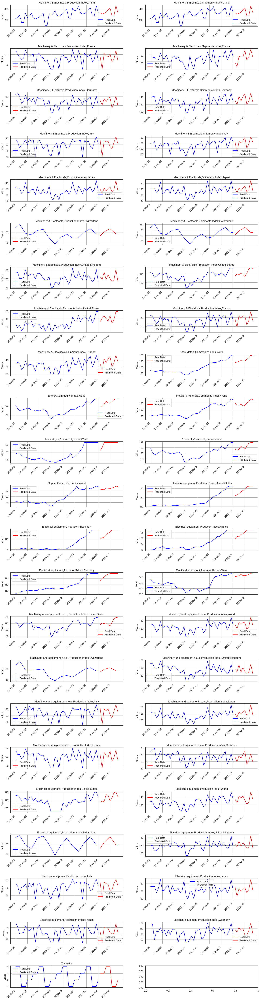

In [162]:
# Set number of rows and columns for subplot grid
num_rows = 23
num_cols = 2

# Create a figure and axis objects with appropriate size and spacing
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 80))
fig.subplots_adjust(hspace=1.0)

# Loop over the columns and create a new plot for each one
for i, col in enumerate(evaluation_df.columns[:45]):
    # Calculate row and column index for current subplot
    row = i // num_cols
    col_index = i % num_cols  # Avoid overwriting the 'col' variable in the loop

    # Plot the real data as a blue line
    axes[row, col_index].plot(evaluation_df.index[:43], evaluation_df.iloc[:43, i], color='blue', label='Real Data')

    # Plot the predicted data as an orange line
    axes[row, col_index].plot(evaluation_df.index[43:], evaluation_df.iloc[43:, i], color='red', label='Predicted Data')

    # Set axis labels
    axes[row, col_index].set_ylabel('Values', fontsize=10)  # Y-axis label as 'Values'
    
    # Set x-axis tick labels to the index of the DataFrame
    axes[row, col_index].set_xticks(evaluation_df.index[::6])  # Set x-ticks to every 6th value for better spacing
    axes[row, col_index].set_xticklabels(evaluation_df.index[::6], rotation=45, ha='right')  # Rotate x-tick labels for readability

    # Set the title of the subplot to the name of the feature
    axes[row, col_index].set_title(col, fontsize=12)

    # Add a gray grid to the subplot
    axes[row, col_index].grid(color='gray', linestyle='-', linewidth=0.5)

    # Add legend to the plot
    axes[row, col_index].legend()

# Display the plot
plt.show()


Creating a complete df with linear regression to use as a benchmark to assess performance.

In [163]:
linear_predictions_df = evaluation_df.copy()

In [164]:
for i in range(0, 59):
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(test_df.iloc[:-10,i].values.reshape(-1, 1), 
                                                        test_df.iloc[:-10,i].values, 
                                                        test_size=0.2, random_state=42)
    # Train a linear regression model on the training set
    model = LinearRegression()
    model.fit(X_train.reshape(-1, 1), y_train)

    # Predict the last 10 rows of data
    predictions = model.predict(linear_predictions_df.iloc[:-10, i].dropna().tail(10).values.reshape(-1, 1))
    linear_predictions_df.iloc[-10:, i] = predictions

## `3.11 Final Model`

Testing our model predictions on our created test dataset `'linear_predictions_df'`.

In [165]:
# Defining another split function to 
def split_data_nr_row(df, train_len):
    X_train = df.iloc[:train_len, :-1]
    y_train = pd.DataFrame(df.iloc[:train_len, -1])
    X_test = df.iloc[train_len:, :-1]
    y_test = pd.DataFrame(df.iloc[train_len:, -1])
    return X_train, y_train, X_test, y_test

In [166]:
product_1= linear_predictions_df.loc[:,fs_keep_1]
product_11=linear_predictions_df.loc[:,fs_keep_11]
product_12= linear_predictions_df.loc[:,fs_keep_12]
product_13= linear_predictions_df.loc[:,fs_keep_13]
product_14= linear_predictions_df.loc[:,fs_keep_14]
product_16= linear_predictions_df.loc[:,fs_keep_16]
product_20= linear_predictions_df.loc[:,fs_keep_20]
product_3= linear_predictions_df.loc[:,fs_keep_3]
product_36= linear_predictions_df.loc[:,fs_keep_36]
product_4= linear_predictions_df.loc[:,fs_keep_4]
product_5= linear_predictions_df.loc[:,fs_keep_5]
product_6=linear_predictions_df.loc[:,fs_keep_6]
product_8= linear_predictions_df.loc[:,fs_keep_8]
product_9= linear_predictions_df.loc[:,fs_keep_9]

In [170]:
# Applying the function to our 14 dataframes
X_train_product_1, y_train_product_1, X_test_product_1, y_test_product_1 = split_data_nr_row(product_1, len(linear_predictions_df.iloc[:-10]))
X_train_product_11, y_train_product_11, X_test_product_11, y_test_product_11 = split_data_nr_row(product_11, len(linear_predictions_df.iloc[:-10]))
X_train_product_12, y_train_product_12, X_test_product_12, y_test_product_12 = split_data_nr_row(product_12, len(linear_predictions_df.iloc[:-10]))
X_train_product_13, y_train_product_13, X_test_product_13, y_test_product_13 = split_data_nr_row(product_13, len(linear_predictions_df.iloc[:-10]))
X_train_product_14, y_train_product_14, X_test_product_14, y_test_product_14 = split_data_nr_row(product_14, len(linear_predictions_df.iloc[:-10]))
X_train_product_16, y_train_product_16, X_test_product_16, y_test_product_16 = split_data_nr_row(product_16, len(linear_predictions_df.iloc[:-10]))
X_train_product_20, y_train_product_20, X_test_product_20, y_test_product_20 = split_data_nr_row(product_20, len(linear_predictions_df.iloc[:-10]))
X_train_product_3, y_train_product_3, X_test_product_3, y_test_product_3 = split_data_nr_row(product_3, len(linear_predictions_df.iloc[:-10]))
X_train_product_36, y_train_product_36, X_test_product_36, y_test_product_36 = split_data_nr_row(product_36, len(linear_predictions_df.iloc[:-10]))
X_train_product_4, y_train_product_4, X_test_product_4, y_test_product_4 = split_data_nr_row(product_4, len(linear_predictions_df.iloc[:-10]))
X_train_product_5, y_train_product_5, X_test_product_5, y_test_product_5 = split_data_nr_row(product_5, len(linear_predictions_df.iloc[:-10]))
X_train_product_6, y_train_product_6, X_test_product_6, y_test_product_6 = split_data_nr_row(product_6, len(linear_predictions_df.iloc[:-10]))
X_train_product_8, y_train_product_8, X_test_product_8, y_test_product_8 = split_data_nr_row(product_8, len(linear_predictions_df.iloc[:-10]))
X_train_product_9, y_train_product_9, X_test_product_9, y_test_product_9 = split_data_nr_row(product_9, len(linear_predictions_df.iloc[:-10]))

In [175]:
# Creating lists with our dataframes to use them later
X_test_dfs = [X_test_product_1, X_test_product_11, X_test_product_12, X_test_product_13, X_test_product_14, X_test_product_16,X_test_product_20,X_test_product_3, X_test_product_36,X_test_product_4, X_test_product_5, X_test_product_6, X_test_product_8, X_test_product_9]

X_train_dfs = [X_train_product_1, X_train_product_11,X_train_product_12,X_train_product_13,X_train_product_14,X_train_product_16,X_train_product_20,X_train_product_3,X_train_product_36, X_train_product_4,X_train_product_5,X_train_product_6,X_train_product_8,X_train_product_9]

y_test_dfs = [y_test_product_1, y_test_product_11, y_test_product_12, y_test_product_13, y_test_product_14, y_test_product_16,y_test_product_20,y_test_product_3, y_test_product_36,y_test_product_4, y_test_product_5, y_test_product_6, y_test_product_8, y_test_product_9]

y_train_dfs = [y_train_product_1, y_train_product_11,y_train_product_12,y_train_product_13,y_train_product_14,y_train_product_16,y_train_product_20,y_train_product_3,y_train_product_36, y_train_product_4,y_train_product_5,y_train_product_6,y_train_product_8,y_train_product_9]

`Assess Performance`

In [ ]:
dataset_names, test_rmse_list, test_mae_list, test_r2_list, test_mape_list, test_maxerr_list = [], [], [], [], [], []
for i in range(len(X_train_dfs)):
    # Split into features and target variables
    X_train, X_test, y_train, y_test = X_train_dfs[i], X_test_dfs[i], y_train_dfs[i], y_test_dfs[i]
    
    # Initialize XGBoost model and set hyperparameters
    xgb_reg = xgb.XGBRegressor(max_depth=3, learning_rate=0.2, n_estimators=200, objective='reg:squarederror',
                               booster='gbtree', subsample=1.0, colsample_bytree=0.6, random_state=42)
    
    # Fit the XGBoost model
    xgb_reg.fit(X_train, y_train)
    
    # Make predictions on the test set
    test_pred = xgb_reg.predict(X_test)
    #print(f"fold {i}")
    #print(test_pred)
    #print(y_test)

    # Store the predictions in your dataframe (if needed)
    #xgb_predictions_df.iloc[-10:, xgb_predictions_df.columns.get_loc(y_train.columns[0])] = test_pred

    # Compute metrics
    test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
    test_mae = mean_absolute_error(y_test, test_pred)
    test_r2 = r2_score(y_test, test_pred)
    test_mape = mean_absolute_percentage_error(y_test, test_pred)
    test_maxerr = max_error(y_test, test_pred)

        # Store the results in the lists
    dataset_names.append(y_train.columns[0] if hasattr(y_train, 'columns') else 'Dataset_' + str(i))
    test_rmse_list.append(test_rmse)
    test_mae_list.append(test_mae)
    test_r2_list.append(test_r2)
    test_mape_list.append(test_mape)
    test_maxerr_list.append(test_maxerr)

    # Create a dataframe with the results and set the 'Dataset' column as the index
    results_df = pd.DataFrame({
        'test RMSE': test_rmse_list,
        'test MAE': test_mae_list,
        'test R^2': test_r2_list,
        'test MAPE (%)': test_mape_list,
        'test Max Error': test_maxerr_list
    }, index=dataset_names)

    # Set the name for the index and return the result
    results_df.index.name = 'Dataset'


In [194]:
results_df

,test RMSE,test MAE,test R^2,test MAPE (%),test Max Error
Dataset,,,,,
#1,1516.68,1092.07,1.00,0.00,3251.79
#11,62.42,46.27,1.00,0.00,116.49
#12,5.56,4.07,1.00,0.00,9.77
#13,12.10,10.19,1.00,0.00,22.51
#14,0.45,0.32,1.00,4088902041.50,0.87
#16,17.79,13.42,1.00,0.00,41.65
#20,0.81,0.70,1.00,58948888166.40,1.43
#3,258.70,195.84,1.00,0.00,546.47
#36,4.82,3.15,1.00,0.00,12.30


High RMSE and MAE indicate that large prediction errors, which need to be improved.
Perfect R^2 scores indicate extreme overfitting, which means the model is not generalizing well for unseen data, which is expected since we used a Linear Regression (simple model) to simulate actual sales.
Extreme values for MAPE suggest overfitting again and poor performance for certain products probably due to lack of data (few observations).
Max error is somewhat reasonable but for some months we have big deviations, likely due to outliers or poor model perfomance.

``Applying our Best Model``

Predicting our market features with our best model.

In [184]:
for i in range(0, 45):
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(test_df.iloc[:-10,i].values.reshape(-1, 1), 
                                                        test_df.iloc[:-10,i].values, 
                                                        test_size=0.2, random_state=42)
    # Train a linear regression model on the training set
    model = xgb.XGBRegressor(max_depth=3, learning_rate=0.2, n_estimators=200, objective='reg:squarederror',
                                   booster='gbtree', subsample=1.0, colsample_bytree=0.6, random_state=42)
    model.fit(X_train.reshape(-1, 1), y_train)

    # Predict the last 10 rows of data
    predictions = model.predict(xgb_predictions_df.iloc[:-10, i].dropna().tail(10).values.reshape(-1, 1))
    xgb_predictions_df.iloc[-10:, i] = predictions

In [186]:
product_1= xgb_predictions_df.loc[:,fs_keep_1]
product_11=xgb_predictions_df.loc[:,fs_keep_11]
product_12= xgb_predictions_df.loc[:,fs_keep_12]
product_13= xgb_predictions_df.loc[:,fs_keep_13]
product_14= xgb_predictions_df.loc[:,fs_keep_14]
product_16= xgb_predictions_df.loc[:,fs_keep_16]
product_20= xgb_predictions_df.loc[:,fs_keep_20]
product_3= xgb_predictions_df.loc[:,fs_keep_3]
product_36= xgb_predictions_df.loc[:,fs_keep_36]
product_4= xgb_predictions_df.loc[:,fs_keep_4]
product_5= xgb_predictions_df.loc[:,fs_keep_5]
product_6=xgb_predictions_df.loc[:,fs_keep_6]
product_8= xgb_predictions_df.loc[:,fs_keep_8]
product_9= xgb_predictions_df.loc[:,fs_keep_9]

In [187]:
# Applying the function to our 14 dataframes
X_train_product_1, y_train_product_1, X_test_product_1, y_test_product_1 = split_data_nr_row(product_1, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_11, y_train_product_11, X_test_product_11, y_test_product_11 = split_data_nr_row(product_11, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_12, y_train_product_12, X_test_product_12, y_test_product_12 = split_data_nr_row(product_12, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_13, y_train_product_13, X_test_product_13, y_test_product_13 = split_data_nr_row(product_13, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_14, y_train_product_14, X_test_product_14, y_test_product_14 = split_data_nr_row(product_14, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_16, y_train_product_16, X_test_product_16, y_test_product_16 = split_data_nr_row(product_16, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_20, y_train_product_20, X_test_product_20, y_test_product_20 = split_data_nr_row(product_20, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_3, y_train_product_3, X_test_product_3, y_test_product_3 = split_data_nr_row(product_3, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_36, y_train_product_36, X_test_product_36, y_test_product_36 = split_data_nr_row(product_36, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_4, y_train_product_4, X_test_product_4, y_test_product_4 = split_data_nr_row(product_4, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_5, y_train_product_5, X_test_product_5, y_test_product_5 = split_data_nr_row(product_5, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_6, y_train_product_6, X_test_product_6, y_test_product_6 = split_data_nr_row(product_6, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_8, y_train_product_8, X_test_product_8, y_test_product_8 = split_data_nr_row(product_8, len(xgb_predictions_df.iloc[:].dropna()))
X_train_product_9, y_train_product_9, X_test_product_9, y_test_product_9 = split_data_nr_row(product_9, len(xgb_predictions_df.iloc[:].dropna()))

In [188]:
# Creating lists with our dataframes to use them later
X_test_dfs = [X_test_product_1, X_test_product_11, X_test_product_12, X_test_product_13, X_test_product_14, X_test_product_16,X_test_product_20,X_test_product_3, X_test_product_36,X_test_product_4, X_test_product_5, X_test_product_6, X_test_product_8, X_test_product_9]

X_train_dfs = [X_train_product_1, X_train_product_11,X_train_product_12,X_train_product_13,X_train_product_14,X_train_product_16,X_train_product_20,X_train_product_3,X_train_product_36, X_train_product_4,X_train_product_5,X_train_product_6,X_train_product_8,X_train_product_9]

y_test_dfs = [y_test_product_1, y_test_product_11, y_test_product_12, y_test_product_13, y_test_product_14, y_test_product_16,y_test_product_20,y_test_product_3, y_test_product_36,y_test_product_4, y_test_product_5, y_test_product_6, y_test_product_8, y_test_product_9]

y_train_dfs = [y_train_product_1, y_train_product_11,y_train_product_12,y_train_product_13,y_train_product_14,y_train_product_16,y_train_product_20,y_train_product_3,y_train_product_36, y_train_product_4,y_train_product_5,y_train_product_6,y_train_product_8,y_train_product_9]

Predicting the sales with our model.

In [189]:
for i in range(len(X_train_dfs)):
    # Split into features and target variables
    X_train, X_test, y_train, y_test = X_train_dfs[i], X_test_dfs[i], y_train_dfs[i], y_test_dfs[i]
    

    # Initialize XGBoost model and set hyperparameters
    xgb_reg = xgb.XGBRegressor(max_depth=3, learning_rate=0.2, n_estimators=200, objective='reg:squarederror',
                                   booster='gbtree', subsample=1.0, colsample_bytree=0.6, random_state=42)

    # Fit the XGBoost model
    xgb_reg.fit(X_train, y_train)
  
    # Make predictions on the train set
    test_pred = xgb_reg.predict(X_test)
    xgb_predictions_df.iloc[-10:, xgb_predictions_df.columns.get_loc(y_train.columns[0])] = test_pred

In [190]:
xgb_predictions_df

,"Machinery & Electricals,Production Index,China","Machinery & Electricals,Shipments Index,China","Machinery & Electricals,Production Index,France","Machinery & Electricals,Shipments Index,France","Machinery & Electricals,Production Index,Germany","Machinery & Electricals,Shipments Index,Germany","Machinery & Electricals,Production Index,Italy","Machinery & Electricals,Shipments Index,Italy","Machinery & Electricals,Production Index,Japan","Machinery & Electricals,Shipments Index,Japan","Machinery & Electricals,Production Index,Switzerland","Machinery & Electricals,Shipments Index,Switzerland","Machinery & Electricals,Production Index,United Kingdom","Machinery & Electricals,Production Index,United States","Machinery & Electricals,Shipments Index,United States","Machinery & Electricals,Production Index,Europe","Machinery & Electricals,Shipments Index,Europe","Base Metals,Commodity Index,World","Energy,Commodity Index,World","Metals & Minerals,Commodity Index,World","Natural gas,Commodity Index,World","Crude oil,Commodity Index,World","Copper,Commodity Index,World","Electrical equipment,Producer Prices,United States","Electrical equipment,Producer Prices,Italy","Electrical equipment,Producer Prices,France","Electrical equipment,Producer Prices,Germany","Electrical equipment,Producer Prices,China","Machinery and equipment n.e.c.,Production Index,United States","Machinery and equipment n.e.c.,Production Index,World","Machinery and equipment n.e.c.,Production Index,Switzerland","Machinery and equipment n.e.c.,Production Index,United Kingdom","Machinery and equipment n.e.c.,Production Index,Italy","Machinery and equipment n.e.c.,Production Index,Japan","Machinery and equipment n.e.c.,Production Index,France","Machinery and equipment n.e.c.,Production Index,Germany","Electrical equipment,Production Index,United States","Electrical equipment,Production Index,World","Electrical equipment,Production Index,Switzerland","Electrical equipment,Production Index,United Kingdom","Electrical equipment,Production Index,Italy","Electrical equipment,Production Index,Japan","Electrical equipment,Production Index,France","Electrical equipment,Production Index,Germany",Trimester,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2018m10,211.96,211.96,108.28,122.45,124.23,137.74,118.35,122.46,125.21,124.79,109.08,104.59,113.66,111.90,127.81,124.39,130.99,86.10,100.22,79.35,89.57,97.07,82.55,110.70,105.30,102.06,109.12,96.32,111.42,131.34,106.82,110.89,129.39,131.50,114.72,127.46,112.85,129.33,112.97,118.67,93.00,112.38,97.85,118.30,4.00,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
2018m11,220.52,220.52,99.64,115.96,127.40,142.73,107.72,120.13,122.62,123.29,112.24,107.66,115.09,110.88,117.68,123.07,132.93,83.84,84.44,77.50,97.36,78.84,82.23,110.99,105.30,102.06,109.22,95.37,109.74,129.98,110.79,112.12,117.99,127.88,104.87,132.99,113.15,128.24,114.74,120.47,84.13,111.91,91.16,117.16,4.00,27689397.14,1898844.80,1070.00,61716.33,17130.00,614599.90,5798.14,11863001.51,21617.61,371322.42,8993944.04,473046.96,526292.77,1875.90
2018m12,241.85,241.85,94.69,115.13,120.52,141.41,88.78,131.94,122.99,124.51,115.41,110.72,101.56,106.26,123.28,113.86,131.26,82.73,74.90,76.07,94.41,68.27,80.63,111.16,105.30,102.17,109.33,94.99,103.45,124.20,114.77,99.45,99.19,128.13,104.97,137.36,111.82,117.04,116.50,105.38,64.88,112.52,78.03,89.63,4.00,37889612.12,1226122.00,17880.60,15655.18,0.00,614599.90,918.65,8736859.39,13924.52,430100.96,6947507.31,999472.69,271490.71,0.00
2019m01,175.67,175.67,90.14,108.33,104.78,118.70,99.28,92.42,105.51,106.30,109.62,105.16,101.80,107.51,111.04,106.42,113.06,81.25,76.20,75.77,80.06,71.59,78.82,111.39,105.51,102.78,109.75,94.95,106.51,112.18,109.20,98.83,106.99,110.20,95.23,104.43,109.50,111.52,110.35,107.17,81.56,95.96,81.91,105.41,1.00,27728148.35,2216391.74,21484.00,27198.29,1686.40,614599.90,2398.04,10705300.63,15444.39,484173.88,8233205.07,598874.10

Plotting final predictions for each of our product groups.

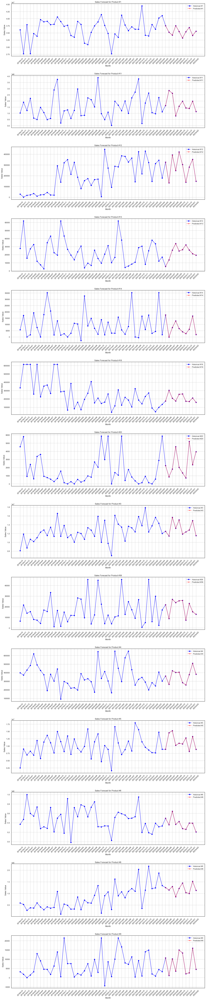

In [191]:
# List of product group columns you want to plot
product_groups = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9']  # Adjust this based on your actual columns

# Set up the figure and axes with a larger figure size
num_plots = len(product_groups)
# set number of rows and columns for subplot grid
num_rows = 14
num_cols = 1

plt.figure(figsize=(18, 6 * num_rows))  # Adjust the height based on the number of rows

# Loop through the product groups to create individual plots
for i, product in enumerate(product_groups):
    # Create a new subplot for each product group
    plt.subplot(num_rows, num_cols, i+1)  # Set the subplot position
    
    # Historical data (actual sales)
    plt.plot(xgb_predictions_df.index, xgb_predictions_df[product], label=f'Historical {product}', color='blue', linestyle='-', marker='o')
    
    # Predicted data (forecasted sales)
    plt.plot(xgb_predictions_df.index[-10:], xgb_predictions_df[product][-10:], label=f'Predicted {product}', color='red', linestyle='--', marker='x')
    
    # Title for each subplot
    plt.title(f'Sales Forecast for Product {product}')
    
    # Label for x and y axes
    plt.xlabel('Month')
    plt.ylabel('Sales Value')
    
    # Rotate x-axis labels to prevent overlap
    plt.xticks(rotation=45)
    
    # Add a legend to distinguish between historical and predicted
    plt.legend()
    
    # Add grid for clarity
    plt.grid(True)

# Adjust layout to prevent overlap of subplots
plt.tight_layout(pad=3.0)

# Show the plot
plt.show()


In [192]:
final_evaluation_df = xgb_predictions_df.copy()

`Simulating our results`

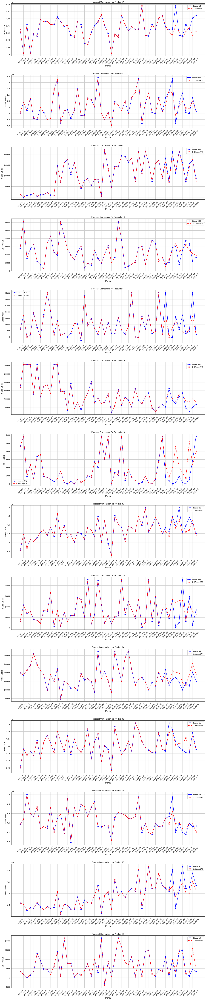

In [193]:
# List of product group columns you want to plot (assuming these are your target columns)
product_groups = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9']

# Set up the figure and axes with a larger figure size
num_plots = len(product_groups)
num_rows = 14
num_cols = 1

plt.figure(figsize=(18, 6 * num_rows))  # Adjust the height based on the number of rows

# Loop through the product groups to create individual plots
for i, product in enumerate(product_groups):
    # Create a new subplot for each product group
    plt.subplot(num_rows, num_cols, i + 1)  # Set the subplot position
    
    # Plot Linear Regression predictions (entire time span, historical and predicted)
    plt.plot(linear_predictions_df.index, linear_predictions_df[product], label=f'Linear {product}', color='blue', linestyle='-', marker='o')
    
    # Plot XGBoost predictions (entire time span, historical and predicted)
    plt.plot(xgb_predictions_df.index, xgb_predictions_df[product], label=f'XGBoost {product}', color='red', linestyle='--', marker='x')
    
    # Title for each subplot
    plt.title(f'Forecast Comparison for Product {product}')
    
    # Label for x and y axes
    plt.xlabel('Month')
    plt.ylabel('Sales Value')
    
    # Rotate x-axis labels to prevent overlap
    plt.xticks(rotation=45)
    
    # Add a legend to distinguish between Linear and XGBoost predictions
    plt.legend()
    
    # Add grid for clarity
    plt.grid(True)

# Adjust layout to prevent overlap of subplots
plt.tight_layout(pad=3.0)

# Show the plot
plt.show()


## ``3.12 Exports``

``Exporting test dataframe``

In [222]:
final_test_df = final_evaluation_df.iloc[-10:, -14:]

In [223]:
final_test_df

,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2022m05,37809124.00,1007186.94,346921.66,17636.57,18127.01,156519.12,1398.12,13082624.00,25686.39,337631.66,9276194.00,417982.72,1249854.12,10933.31
2022m06,36485292.00,2771262.00,137279.88,13212.94,-128.38,321151.19,802.37,11678119.00,10333.46,266816.25,13445995.00,320307.12,1144456.50,966.17
2022m07,35610208.00,1994612.00,339938.28,18125.53,3902.88,224731.83,1331.68,16403010.00,18278.44,446792.19,14628510.00,606860.56,1293950.50,7554.22
2022m08,37972432.00,746567.62,256974.48,34578.65,13760.57,166209.00,4442.11,13429621.00,3475.03,425734.19,10689671.00,412291.84,857866.75,4656.53
2022m09,37608184.00,1427668.62,435128.25,15927.22,6289.26,240600.48,1427.00,15436529.00,9192.81,371813.06,11210672.00,460374.19,1210826.75,13285.56
2022m10,33874816.00,1971297.25,307851.84,25718.32,4185.89,271521.50,1320.31,12521422.00,10049.32,299009.78,10734453.00,345846.56,1445192.00,12792.23
2022m11,35173112.00,1504399.88,141545.80,34273.19,2118.05,160492.50,670.14,12816555.00,6273.25,218435.03,11223923.00,278546.56,1034534.62,1915.57
2022m12,37034476.00,1192087.75,273180.91,28369.51,5787.34,122192.62,4948.95,12974783.00,18358.28,371255.25,7975909.00,468532.84,997714.88,2982.63
2023m01,33902496.00,2205184.25,328836.69,21874.09,17853.65,232695.67,1867.42,14117205.00,4429.04,588812.56,12798318.00,452779.50,1517919.50,16520.02
2023m02,35487036.00,1011489.81,147342.12,19601.06,2791.48,171003.84,4378.49,11814141.00,14293.23,367023.22,9047502.00,271641.59,1129695.00,3857.33


In [224]:
final_test_df = final_test_df.reset_index()
final_test_df = final_test_df.rename(columns={'index': 'Month Year'})
final_test_df

,Month Year,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
0,2022m05,37809124.00,1007186.94,346921.66,17636.57,18127.01,156519.12,1398.12,13082624.00,25686.39,337631.66,9276194.00,417982.72,1249854.12,10933.31
1,2022m06,36485292.00,2771262.00,137279.88,13212.94,-128.38,321151.19,802.37,11678119.00,10333.46,266816.25,13445995.00,320307.12,1144456.50,966.17
2,2022m07,35610208.00,1994612.00,339938.28,18125.53,3902.88,224731.83,1331.68,16403010.00,18278.44,446792.19,14628510.00,606860.56,1293950.50,7554.22
3,2022m08,37972432.00,746567.62,256974.48,34578.65,13760.57,166209.00,4442.11,13429621.00,3475.03,425734.19,10689671.00,412291.84,857866.75,4656.53
4,2022m09,37608184.00,1427668.62,435128.25,15927.22,6289.26,240600.48,1427.00,15436529.00,9192.81,371813.06,11210672.00,460374.19,1210826.75,13285.56
5,2022m10,33874816.00,1971297.25,307851.84,25718.32,4185.89,271521.50,1320.31,12521422.00,10049.32,299009.78,10734453.00,345846.56,1445192.00,12792.23
6,2022m11,35173112.00,1504399.88,141545.80,34273.19,2118.05,160492.50,670.14,12816555.00,6273.25,218435.03,11223923.00,278546.56,1034534.62,1915.57
7,2022m12,37034476.00,1192087.75,273180.91,28369.51,5787.34,122192.62,4948.95,12974783.00,18358.28,371255.25,7975909.00,468532.84,997714.88,2982.63
8,2023m01,33902496.00,2205184.25,328836.69,21874.09,17853.65,232695.67,1867.42,14117205.00,4429.04,588812.56,12798318.00,452779.50,1517919.50,16520.02
9,2023m02,35487036.00,1011489.81,147342.12,19601.06,2791.48,171003.84,4378.49,11814141.00,14293.23,367023.22,9047502.00,271641.59,1129695.00,3857.33


In [225]:
# Melt the DataFrame to reshape it
final_test_df = final_test_df.melt(id_vars=['Month Year'], var_name='Mapped_GCK', value_name='Sales_EUR')

# Convert 'MonthYear' to the desired format 'May 22', 'Jun 22', etc.
final_test_df['Month Year'] = pd.to_datetime(final_test_df['Month Year'], format='%Ym%m').dt.strftime('%b %y')

In [226]:
final_test_df

,Month Year,Mapped_GCK,Sales_EUR
0,May 22,#1,37809124.00
1,Jun 22,#1,36485292.00
2,Jul 22,#1,35610208.00
3,Aug 22,#1,37972432.00
4,Sep 22,#1,37608184.00
...,...,...,...
135,Oct 22,#9,12792.23
136,Nov 22,#9,1915.57
137,Dec 22,#9,2982.63
138,Jan 23,#9,16520.02


In [200]:
final_test_df.to_csv('NOVASAC-GroupO.csv')